# PATTERN RECOGNITION PROJECT
### Authors: Davide Savini and Giulia Focarelli
### Available data: heart pathologies/disease

# Preliminary step: Import of Libraries

In [1]:
# Basic Libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import sys
import traceback
import xarray as xr
import scipy.stats as stats

# Tensorflow libraries for ANN purposes
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras import optimizers
from tensorflow.keras import utils
import tensorflow as tf
import warnings
from sklearn.preprocessing import StandardScaler
warnings.filterwarnings("ignore")

#Visual Libraries
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px # NEEDED FOR T-SNE

# Importing library for t-sne to do the Exploratory analysis
from sklearn import datasets, manifold
from sklearn.manifold import TSNE

# Importing necessary libraries for encoding
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, LabelEncoder

# Importing necessary libraries for normalization
from sklearn.preprocessing import MinMaxScaler # (e.g) norm = MinMaxScaler.fit(X_train) and 
                                               # X_train_norm = norm.transform(X_train) # same for test

# Importing necessary library for scaling (that means a standardization)
from sklearn.preprocessing import StandardScaler

# Importing another library for scaling
from sklearn.preprocessing import LabelBinarizer

# Importing necessary library for train-test split
from sklearn.model_selection import train_test_split

# Importing necessary libraries for model development and evaluation
from sklearn.neighbors import KNeighborsClassifier # (K-NN)
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis # Linear Discriminant Analysis (LDA)
from sklearn.cross_decomposition import PLSRegression # Partial Least Squares (PLS) - Discriminant Analysis (PLS-DA)
from sklearn.cross_decomposition import PLSCanonical
from sklearn.neural_network import MLPClassifier # Feed-Foward Neural Network: Multi-Layer Perceptrons (MLP) 
                                                                                        # (Classifier case) 
# from pyPLS import PLSClassifier # PLS-DA Classifier
# from sklearn.linear_model import LogisticRegression
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
# from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve
from sklearn.metrics import classification_report

from sklearn.metrics import mean_squared_error, mean_squared_log_error
from sklearn.datasets import make_classification
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.model_selection import GridSearchCV # for hyperparameter tuning
from sklearn.model_selection import RandomizedSearchCV # for hyperparameter tuning


# Import keras to implement a custom ANN
# Using TensorFlow backend
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Activation, Dropout, Flatten, Dense
import keras
from keras.models import Sequential
from keras.layers import Dense
import warnings

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        

# Data loading, visualization, and exploratory analysis
## Read the Data

After done preliminary step, the overall Machine-Learning (ML) process steps can start. The process involves several steps:
1. **Data Loading**: We load the dataset into the notebook using pandas.
2. **Exploratory data analysis (EDA)**: Exploration and data visualization of features inside dataset. 
3. **Data Preprocessing**: In this step, we convert categorical variables into dummy/indicator variables, handle missing values if any, and scale numerical features to a similar range. This step is composed by **Encoding of data** and one of **Normalization of data** or **Scaling of data**. **The difference is that: in scaling, you're changing the range of your data, while. in normalization, you're changing the shape of the distribution of your data**. The Encoding must be done before Scaling/Normalization; also, Splitting can be done before preprocessing. In theory, it’s better to split data into training and test datasets and then normalize/scale and encode each dataset separately. In practice, there are advantages to normalizing/scaling and encoding all the data first, and then splitting the data. <!-- In this model development we decided Encoding, Normalization (in the case of experiment with it) before Splitting and Scaling after it. --> 

4. **Splitting the Data**: We split the dataset into a training set and a test set.

5. **Model Training**: We train different models on the training data.

6. **Model Evaluation**: 
    - 1) Each model is evaluated on the test data, one with training-set 80% of the original dataset (test 20%), and one with train 90% (test 10%). We calculate the accuracy of each model on the training and test data. We also generate confusion matrices for each model to better understand their performance. 
    - 2) Each model is evaluated using k-fold cross validation. 

<br>

7. **Model Comparison**: We compare the performance of the different observing the accuracy.



In [2]:
# path_to_data = '/kaggle/input/cardiovascular-diseases-risk-prediction-dataset/'
# data = os.path.join(path_to_data,'CVD_cleaned.csv')

# Load the data
data = pd.read_csv('Correct_Dataset.csv')

# Storage in a file.txt
file = open("txt_correct_dataset.txt", "w")
np.set_printoptions(threshold=sys.maxsize) # used to see the overall saved data inside file.txt (doesn't work!)
file.write(repr(data))
file.close()

# Display the first few rows
# data.head()

# Display the overall dataset
data


,Unnamed: 0,Age,Sex,Chest_Pain,Resting_Blood_Pressure,Colestrol,Fasting_Blood_Sugar,Rest_ECG,MAX_Heart_Rate,Exercised_Induced_Angina,ST_Depression,Slope,Major_Vessels,Thalessemia,Target
0,0,63,1,1,145,233,1,2,150,0,2.3,3,0,6,0
1,1,67,1,4,160,286,0,2,108,1,1.5,2,3,3,2
2,2,67,1,4,120,229,0,2,129,1,2.6,2,2,7,1
3,3,37,1,3,130,250,0,0,187,0,3.5,3,0,3,0
4,4,41,0,2,130,204,0,2,172,0,1.4,1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,298,45,1,1,110,264,0,0,132,0,1.2,2,0,7,1
299,299,68,1,4,144,193,1,0,141,0,3.4,2,2,7,2
300,300,57,1,4,130,131,0,0,115,1,1.2,2,1,7,3
301,301,57,0,2,130,236,0,2,174,0,0.0,2,1,3,1


This dataset appears to be related to health and lifestyle factors, possibly in relation to cardiovascular disease (CVD), as suggested by the filename. Here is a brief description of the columns:

- `Unnamed`: The names and social security numbers of the patients were recently removed from the database, replaced with unnamed values.
- `Age`: age in years.
- `Sex`: sex (1 = male; 0 = female).
- `Chest_Pain`: The chest pain experienced (Value 1: typical angina, Value 2: atypical angina, Value 3: non-anginal pain, Value 4: asymptomatic).
- `Resting_Blood_Pressure`: resting blood pressure (in mm Hg on admission to the hospital).
- `Colestrol`: serum cholestoral in mg/dl.
- `Fasting_Blood_Sugar`: fasting blood sugar > 120 mg/dl (1 = true; 0 = false).
- `Rest_ECG`: resting electrocardiographic results (values 0,1,2).
- `MAX_Heart_Rate`: maximum heart rate achieved (beats per second).
- `Exercised_Induced_Angina`: exercise induced angina (1 = yes; 0 = no).
- `ST_Depression`: oldpeak = ST depression induced by exercise relative to rest. <!-- deve avere un andamento decrescente, ST segment spiegazione https://litfl.com/st-segment-ecg-library/ --> 
- `Slope`:  the slope of the peak exercise ST segment (Value 1: upsloping, Value 2: flat, Value 3: downsloping).
- `Major_Vessels`: number of major vessels (0-3) colored by flourosopy; this measures the presence of disease in the major blood vessels to the heart. A higher number usually indicates more severe disease.
- `Thalessemia`: A blood disorder called thalassemia (thal) (3 = normal; 6 = fixed defect; 7 = reversable defect). <!-- originale: thal: 0 = normal; 1 = fixed defect; 2 = reversable defect -->
- `Target`: ('output' of the stored measurements) should be the Diagnosis of Heart Disease. A value of 0 should indicate not a significant heart disease, while an increasing of this value should indicate a significant heart disease (from 0 to 4).

<!-- - age in years
- sex (1 = male; 0 = female)
- chest pain type (4 values)
- resting blood pressure (in mm Hg on admission to the hospital)
- serum cholestoral in mg/dl
- fasting blood sugar > 120 mg/dl (1 = true; 0 = false)
- resting electrocardiographic results (values 0,1,2)
- maximum heart rate achieved (beats per second)
- exercise induced angina (1 = yes; 0 = no)
- oldpeak = ST depression induced by exercise relative to rest
- the slope of the peak exercise ST segment
- number of major vessels (0-3) colored by flourosopy
- thal: 3 = normal; 6 = fixed defect; 7 = reversable defect
- The names and social security numbers of the patients were recently removed from the database, replaced with unnamed values. -->

Let's get more insights from the dataset like its size, column data types, and basic statistics.

The dataset contains 303 rows (individuals) and 15 columns (features).

Here are the data types for each column:

- `Unnamed`: int64
- `Age`: int64
- `Sex`: int64 -> (1 or 0 : Male or Female)
- `Chest_Pain`: int64
- `Resting_Blood_Pressure`: int64
- `Colestrol`: int64
- `Fasting_Blood_Sugar`: int64
- `Rest_ECG`:int64
- `MAX_Heart_Rate`: int64
- `Exercised_Induced_Angina`:int64
- `ST_Depression`: float64
- `Slope`: int64
- `Major_Vessels`: object
- `Thalessemia`: object
- `Target`: int64

<!-- - `General_Health`: Object (likely string)
- `Checkup`: Object (likely string)
- `Exercise`: Object (likely string)
- `Heart_Disease`: Object (likely string)
- `Skin_Cancer`: Object (likely string)
- `Other_Cancer`: Object (likely string)
- `Depression`: Object (likely string)
- `Diabetes`: Object (likely string)
- `Arthritis`: Object (likely string)
- `Sex`: Object (likely string)
- `Age_Category`: Object (likely string)
- `Height_(cm)`: Float64
- `Weight_(kg)`: Float64
- `BMI`: Float64
- `Smoking_History`: Object (likely string)
- `Alcohol_Consumption`: Float64
- `Fruit_Consumption`: Float64
- `Green_Vegetables_Consumption`: Float64
- `FriedPotato_Consumption`: Float64 -->

<!-- Basic statistics for the numeric columns:

- `Height_(cm)`: Mean height is approximately 170.6 cm, with a minimum of 91 cm and a maximum of 241 cm.
- `Weight_(kg)`: Mean weight is approximately 83.6 kg, with a minimum of 24.95 kg and a maximum of 293.02 kg.
- `BMI`: Mean BMI is approximately 28.63, with a minimum of 12.02 and a maximum of 99.33.
- `Alcohol_Consumption`: Mean alcohol consumption is approximately 5.1, with a minimum of 0 and a maximum of 30.
- `Fruit_Consumption`: Mean fruit consumption is approximately 29.83, with a minimum of 0 and a maximum of 120.
- `Green_Vegetables_Consumption`: Mean green vegetables consumption is approximately 15.11, with a minimum of 0 and a maximum of 128.
- `FriedPotato_Consumption`: Mean fried potato consumption is approximately 6.3, with a minimum of 0 and a maximum of 128. -->

## Data Understanding and first Exploration

In [3]:
data.info() # dataset is 303 entries x 15 columns


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 15 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                303 non-null    int64  
 1   Age                       303 non-null    int64  
 2   Sex                       303 non-null    int64  
 3   Chest_Pain                303 non-null    int64  
 4   Resting_Blood_Pressure    303 non-null    int64  
 5   Colestrol                 303 non-null    int64  
 6   Fasting_Blood_Sugar       303 non-null    int64  
 7   Rest_ECG                  303 non-null    int64  
 8   MAX_Heart_Rate            303 non-null    int64  
 9   Exercised_Induced_Angina  303 non-null    int64  
 10  ST_Depression             303 non-null    float64
 11  Slope                     303 non-null    int64  
 12  Major_Vessels             303 non-null    object 
 13  Thalessemia               303 non-null    object 
 14  Target    

In [4]:
# numerical variables
data.describe().T

# data.describe(include=['int64']).T

# data.select_dtypes('int64').nunique()
# data.select_dtypes('float64').nunique()

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,303.0,151.000000,87.612784,0.0,75.5,151.0,226.5,302.0
Age,303.0,54.438944,9.038662,29.0,48.0,56.0,61.0,77.0
Sex,303.0,0.679868,0.467299,0.0,0.0,1.0,1.0,1.0
Chest_Pain,303.0,3.158416,0.960126,1.0,3.0,3.0,4.0,4.0
Resting_Blood_Pressure,303.0,131.689769,17.599748,94.0,120.0,130.0,140.0,200.0
Colestrol,303.0,246.693069,51.776918,126.0,211.0,241.0,275.0,564.0
Fasting_Blood_Sugar,303.0,0.148515,0.356198,0.0,0.0,0.0,0.0,1.0
Rest_ECG,303.0,0.990099,0.994971,0.0,0.0,1.0,2.0,2.0
MAX_Heart_Rate,303.0,149.607261,22.875003,71.0,133.5,153.0,166.0,202.0
Exercised_Induced_Angina,303.0,0.326733,0.469794,0.0,0.0,0.0,1.0,1.0


Most of the features in the dataset are numerical (int64 and float64 types), while only two are categorical (object).

The summary statistics show that:

- The `Major_Vessels` column has 5 (4 without '?') unique categories
- The `Thalessemia` column has 4 (3 without '?') unique categories
- For numerical columns like `Unnamed`, `Age`, `Sex`, `Chest_Pain`, `Resting_Blood_Pressure`, `Colestrol`, `Fasting_Blood_Sugar`, `Rest_ECG`, `MAX_Heart_Rate`, `Exercised_Induced_Angina`, `ST_Depression` (the only float64), `Slope`, `Target` the mean, standard deviation, minimum, 25th percentile, median, 75th percentile, and maximum values are provided.

In [5]:
# target info
print(data.Target.values) # [0,1,2,3,4]
print("------------")

# categorical variables
print(data.Major_Vessels.values) # to see what there is inside: [0, 1, 2, 3, ?], 5 unique, the most common (top) is 0
print("------------")
print(data.Thalessemia.values) # [3, 6, 7, ?], 4 unique, the most common (top) is 3

print("------------")
print(data.describe(include=['object']).T)
print("------------")
print(data.select_dtypes('object').nunique())


[0 2 1 0 0 0 3 0 2 1 0 0 2 0 0 0 1 0 0 0 0 0 1 3 4 0 0 0 0 3 0 2 1 0 0 0 3
 1 3 0 4 0 0 0 1 4 0 4 0 0 0 0 2 0 1 1 1 1 0 0 2 0 1 0 2 2 1 0 2 1 0 3 1 1
 1 0 1 0 0 3 0 0 0 3 0 0 0 0 0 0 0 3 0 0 0 1 2 3 0 0 0 0 0 0 3 0 2 1 2 3 1
 1 0 2 2 0 0 0 3 2 3 4 0 3 1 0 3 3 0 0 0 0 0 0 0 0 4 3 1 0 0 1 0 1 0 1 4 0
 0 0 0 0 0 4 3 1 1 1 2 0 0 4 0 0 0 0 0 0 1 0 3 0 1 0 4 1 0 1 0 0 3 2 0 0 1
 0 0 2 1 2 0 3 1 2 0 3 0 0 0 1 0 0 0 0 0 3 3 3 0 1 0 4 0 3 1 0 0 0 0 0 0 0
 0 3 1 0 0 0 3 2 0 2 1 0 0 3 2 1 0 0 0 0 0 2 0 2 2 1 3 0 0 1 0 0 0 0 0 0 0
 1 0 3 0 0 4 2 2 2 1 0 1 0 2 0 1 0 0 0 1 0 2 0 3 0 2 4 2 0 0 0 1 0 2 2 1 0
 3 1 1 2 3 1 0]
------------
['0' '3' '2' '0' '0' '0' '2' '0' '1' '0' '0' '0' '1' '0' '0' '0' '0' '0'
 '0' '0' '0' '0' '0' '2' '2' '0' '0' '0' '0' '0' '2' '2' '0' '0' '0' '0'
 '0' '1' '1' '0' '3' '0' '2' '0' '0' '1' '0' '0' '1' '0' '1' '0' '1' '0'
 '1' '1' '1' '0' '1' '1' '0' '0' '3' '0' '1' '2' '0' '0' '0' '0' '0' '2'
 '2' '2' '1' '0' '1' '1' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0' '0'
 '0' '

## Clean of Dataset from outliers inside features Major Vessels and Thalessemia
This step is not needed if a good encoding will be done.

In [6]:
# data.values # you can see the overall values of the dataset
# data['Major_Vessels'].values == '?' # works
# data.values == '?' 

# drop rows where value is ?
# by using not equal operator

# ds_clean = data[data.Major_Vessels != '?']
data_noClean = data
print(data.loc[data.values == '?']) # works, to find overall values equal to ? and printing its rows
ds_cln = data[data.Major_Vessels != '?']
ds_clean = ds_cln[ds_cln.Thalessemia != '?']

# ds_clean.loc[ds_clean.values == '?'] # works, to find overall values equal to ? and printing its rows
ds_clean


     Unnamed: 0  Age  Sex  Chest_Pain  Resting_Blood_Pressure  Colestrol  \
87           87   53    0           3                     128        216   
166         166   52    1           3                     138        223   
192         192   43    1           4                     132        247   
266         266   52    1           4                     128        204   
287         287   58    1           2                     125        220   
302         302   38    1           3                     138        175   

     Fasting_Blood_Sugar  Rest_ECG  MAX_Heart_Rate  Exercised_Induced_Angina  \
87                     0         2             115                         0   
166                    0         0             169                         0   
192                    1         2             143                         1   
266                    1         0             156                         1   
287                    0         0             144                 

,Unnamed: 0,Age,Sex,Chest_Pain,Resting_Blood_Pressure,Colestrol,Fasting_Blood_Sugar,Rest_ECG,MAX_Heart_Rate,Exercised_Induced_Angina,ST_Depression,Slope,Major_Vessels,Thalessemia,Target
0,0,63,1,1,145,233,1,2,150,0,2.3,3,0,6,0
1,1,67,1,4,160,286,0,2,108,1,1.5,2,3,3,2
2,2,67,1,4,120,229,0,2,129,1,2.6,2,2,7,1
3,3,37,1,3,130,250,0,0,187,0,3.5,3,0,3,0
4,4,41,0,2,130,204,0,2,172,0,1.4,1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
297,297,57,0,4,140,241,0,0,123,1,0.2,2,0,7,1
298,298,45,1,1,110,264,0,0,132,0,1.2,2,0,7,1
299,299,68,1,4,144,193,1,0,141,0,3.4,2,2,7,2
300,300,57,1,4,130,131,0,0,115,1,1.2,2,1,7,3


In [7]:
print(ds_clean.describe(include=['object']).T)

# print(ds_clean.Major_Vessels.values)
# print(ds_clean.Thalessemia.values)
# print(ds_clean.Major_Vessels.value_counts)
# print(ds_clean.Thalessemia.value_counts)
print("------------")
print(ds_clean.select_dtypes('object').nunique())


              count unique top freq
Major_Vessels   297      4   0  174
Thalessemia     297      3   3  164
------------
Major_Vessels    4
Thalessemia      3
dtype: int64


Here is a summary of the categorical variables in the dataset:

- The `Major_Vessels` count people with major vessels inside heart. <!-- vasi sanguigni più grandi -->
- The `Thalessemia` count people with different type of Thalessemia. <!-- Anemia mediterranea o Talassemia -->

<!-- 1. **General_Health**: This is a measure of the individual's overall health. It contains 5 unique categories like "Poor", "Fair", "Good", "Very Good", "Excellent". The most common category is "Good".

2. **Checkup**: This represents the last time the individual had a medical checkup. It has 5 unique categories such as "Within past year (anytime less than 12 months ago)", "Within past 2 years (1 year but less than 2 years ago)", "Within past 5 years (2 years but less than 5 years ago)", "5 or more years ago", "Never". The most common category is "Within past year (anytime less than 12 months ago)".

3. **Exercise**: This indicates whether the individual exercises or not. It has 2 unique values - "Yes" and "No". The most common value is "Yes".

4. **Heart_Disease**: This indicates whether the individual has heart disease or not. It has 2 unique values - "Yes" and "No". The most common value is "No".

5. **Skin_Cancer**: This indicates whether the individual has skin cancer or not. It has 2 unique values - "Yes" and "No". The most common value is "No".

6. **Other_Cancer**: This indicates whether the individual has any other type of cancer. It has 2 unique values - "Yes" and "No". The most common value is "No".

7. **Depression**: This indicates whether the individual suffers from depression. It has 2 unique values - "Yes" and "No". The most common value is "No".

8. **Diabetes**: This indicates whether the individual has diabetes. It has 2 unique values - "Yes" and "No". The most common value is "No".

9. **Arthritis**: This indicates whether the individual has arthritis. It has 2 unique values - "Yes" and "No". The most common value is "No".

10. **Sex**: This represents the gender of the individual. It has 2 unique values - "Male" and "Female". The most common value is "Female".

11. **Age_Category**: This represents the age category of the individual. It has 12 unique categories such as "60-64", "65-69", "70-74", "75-79", "80-84", "85+". The most common category is "60-64".

12. **Smoking_History**: This represents the smoking history of the individual. It has 2 unique categories  -->

As we can see from the data, most of the numerical variables are integers, few are binary (Yes/No), one float and the two categorical that are object with integer `int64` inside. Binary will make easier to convert binary variables itself into numerical format for machine learning models. The categoricals are ordinal variables (two integer arrays that contain [0,1,2,3,?] for "Major Vessels" and [3,6,7,?] for "Thalessemia", which can be converted into numerical format using ordinal encoding. 

Next, we can visualize the distribution of numerical variables and categorical variables and also check the relationship between these variables and the target variable (if defined).

## Exploratory data analysis (EDA): Univariate analysis

### Age and gender data exploration

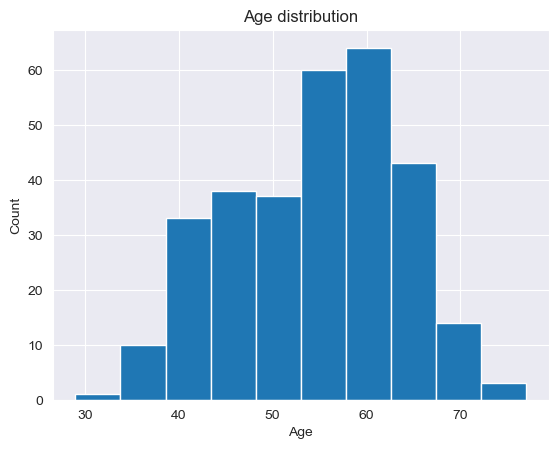

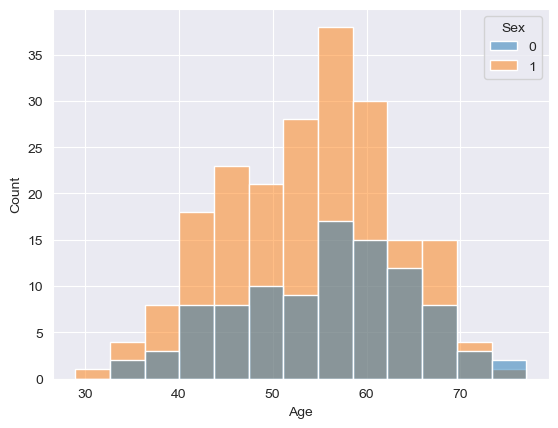

Min Age : 29
Max Age : 77
Mean Age : 54.43894389438944


In [8]:
# sns.set_style(style=None) # Default

features = ["Age", "Sex", "Chest_Pain", "Resting_Blood_Pressure", "Colestrol", "Fasting_Blood_Sugar", 
            "Rest_ECG", "MAX_Heart_Rate", "Exercised_Induced_Angina", "ST_Depression",
            "Slope", "Major_Vessels", "Thalessemia", "Target"]

sns.set_style('darkgrid')

plt.hist(data['Age'])
plt.xlabel('Age')
plt.ylabel('Count')
plt.title('Age distribution')
plt.show()

sns.histplot(data=data, x="Age", hue="Sex")
plt.show()

# sns.set_style(style=None) # Default, doesn't work
# sns.set_style('whitegrid')

#Lets investigate age values
minAge=min(data.Age)
maxAge=max(data.Age)
meanAge=data.Age.mean()
print('Min Age :',minAge)
print('Max Age :',maxAge)
print('Mean Age :',meanAge)


### Distribution of the overall numerical variables inside dataset

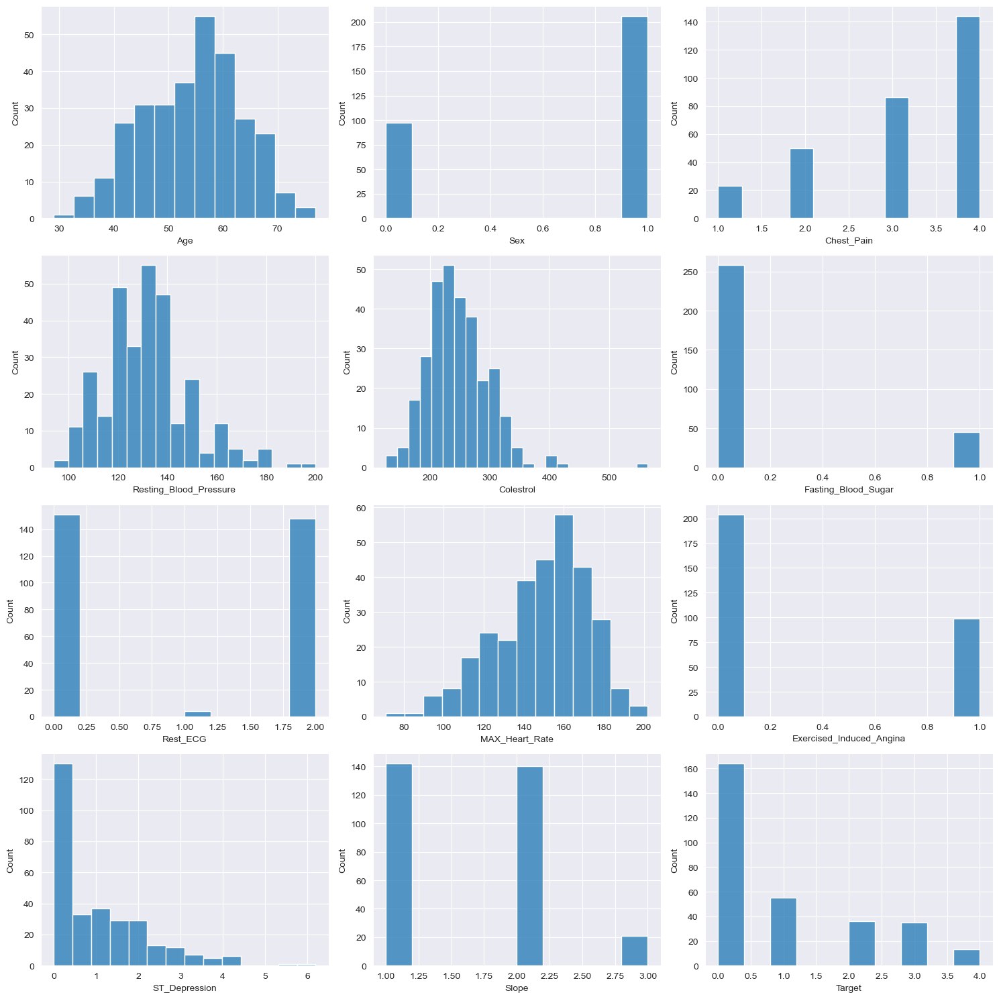

In [9]:
# Plotting the distribution of numerical variables
# data = ds_clean # I will have error if I do encoding and I uncomment this row

numerical_cols = ["Age", "Sex", "Chest_Pain", "Resting_Blood_Pressure", "Colestrol", "Fasting_Blood_Sugar", 
                  "Rest_ECG", "MAX_Heart_Rate", "Exercised_Induced_Angina", "ST_Depression",
                 "Slope", "Target"]

fig, axs = plt.subplots(4, 3, figsize=(15, 15))

for i, col in enumerate(numerical_cols):
    row = i // 3
    col = i % 3
    sns.histplot(data[numerical_cols[i]], ax=axs[row, col])

plt.tight_layout()
plt.show()


The histograms above depict the distribution of numerical features in the dataset. Here are some observations:

- `Age`: This is a key risk factor for heart disease. As age increases, the risk of damaged and narrowed arteries, weakened or thickened heart muscle, and other heart disease risk factors also increases.
- `Sex`: Men are generally at higher risk of heart disease than women. However, after menopause, a woman's risk increases to almost match that of a man's.
- `Chest_Pain`: Chest pain is a key symptom of heart disease. It may manifest in different forms: typical angina, atypical angina, non-anginal pain, or may even be asymptomatic. Chest pain associated with heart disease is usually described as a discomfort, heaviness, pressure, aching, burning, fullness, squeezing, or painful feeling.
- `Resting_Blood_Pressure`: High blood pressure (hypertension) can harden and thicken arteries, leading to a buildup of plaque (atherosclerosis) that can cause coronary artery disease. The pressure is measured in millimeters of mercury (mm Hg) and is usually recorded as two figures. Normal resting blood pressure in an adult is approximately 120/80 mm Hg.
- `Colestrol`: Cholesterol is a type of lipid molecule. High levels of low-density lipoprotein (LDL) or 'bad cholesterol' can increase the risk of heart disease by forming plaques and narrowing arteries.
- `Fasting_Blood_Sugar`: High fasting blood sugar levels (prediabetes or diabetes) can contribute to narrowing of the arteries and increase the risk of heart disease. A fasting blood sugar level less than 100 mg/dL is considered normal. 100-125 mg/dL is considered prediabetes, and 126 mg/dL or higher on two separate tests means you have diabetes.
- `Rest_ECG`: Resting Electrocardiographic (ECG) records the electrical activity of the heart and can show previous heart attacks or problems with the heart rhythm. Abnormal results can indicate heart conditions such as left ventricular hypertrophy or heart arrhythmias.
- `MAX_Heart_Rate`: During exercise or stress testing, the maximum heart rate can indicate cardiovascular fitness and the heart's ability to handle exertion.
- `Exercised_Induced_Angina`: This happens when the heart muscle doesn't get as much blood (and thus oxygen) as it needs for the level of physical activity, causing chest pain or discomfort.
- `ST_Depression`: (ST Depression Induced by Exercise Relative to Rest (oldpeak)) changes in the ST segment on an ECG can indicate heart disease. ST depression can indicate ischemia, or lack of sufficient blood flow to the heart muscle.
- `Slope`: (The Slope of The Peak Exercise ST Segment) The ST segment/heart rate slope (ST/HR slope), has been introduced as an index of relative myocardial oxygen demand during exercise. The shape of the ST segment can reveal a lot about the heart's condition.
- `Target`: (should be Diagnosis of Heart Disease) . A value of 0 should indicate not a significant heart disease, while an increasing of this value should indicate a significant heart disease (from 0 to 4). 

<!-- 1. `Height_(cm)`: The distribution appears to be normal with a peak around 170 cm.
2. `Weight_(kg)`: The distribution is slightly right-skewed with a peak around 80 kg.
3. `BMI`: The distribution is slightly right-skewed with a peak around 25-30, which is the normal range of BMI.
4. `Alcohol_Consumption`: Most of the participants consume little to no alcohol, as the distribution is heavily right-skewed.
5. `Fruit_Consumption`: A significant number of individuals consume around 30 units (the unit is not specified), but there's also a large number who consume very little.
6. `Green_Vegetables_Consumption`: The consumption of green vegetables is spread quite evenly, with slightly more people consuming very little.
7. `FriedPotato_Consumption`: Most of the participants consume little to no fried potatoes, as the distribution is heavily right-skewed. -->

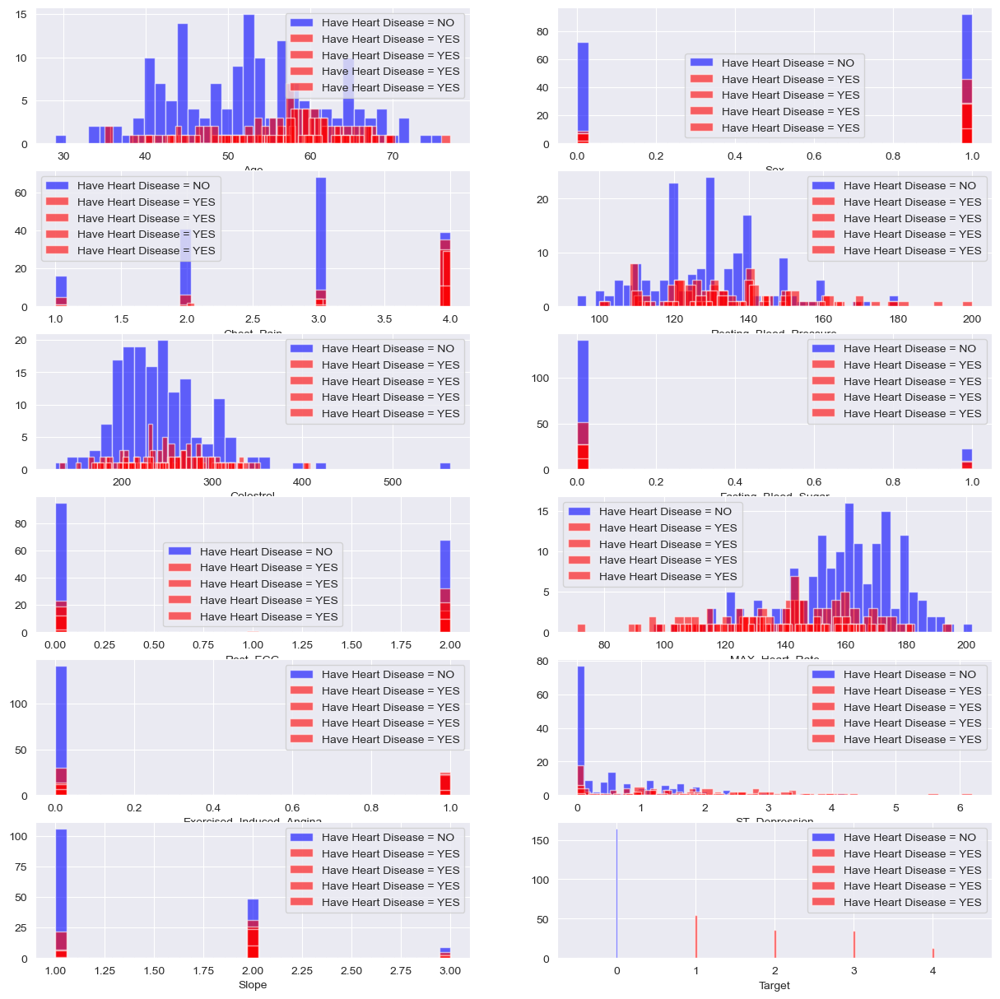

In [10]:
plt.figure(figsize=(15, 15))

for i, column in enumerate(numerical_cols, 1):
    plt.subplot(6, 2, i)
    data[data["Target"] == 0][column].hist(bins=35, color='blue', label='Have Heart Disease = NO', alpha=0.6)
    data[data["Target"] == 1][column].hist(bins=35, color='red', label='Have Heart Disease = YES', alpha=0.6)
    data[data["Target"] == 2][column].hist(bins=35, color='red', label='Have Heart Disease = YES', alpha=0.6)
    data[data["Target"] == 3][column].hist(bins=35, color='red', label='Have Heart Disease = YES', alpha=0.6)
    data[data["Target"] == 4][column].hist(bins=35, color='red', label='Have Heart Disease = YES', alpha=0.6)

    plt.legend()
    plt.xlabel(column)

### Distribution of the overall categorical variables inside dataset

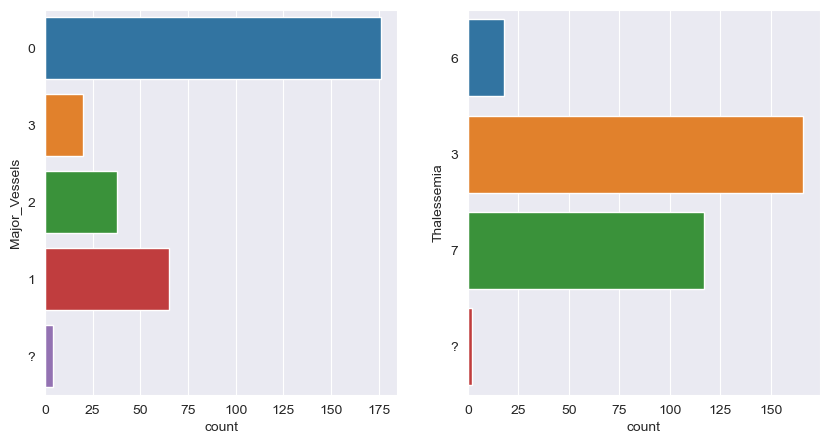

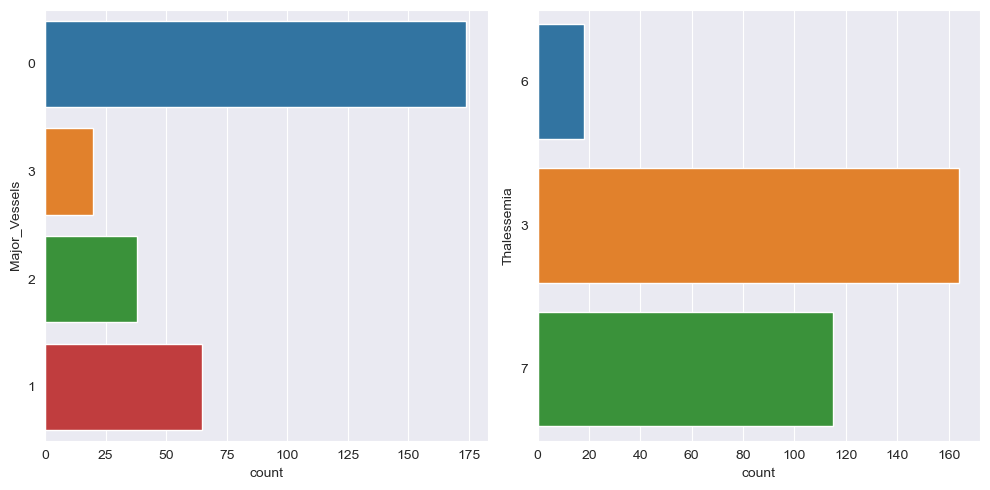

In [11]:
# Selecting the categorical variables
categorical_cols = ["Major_Vessels", "Thalessemia"]

# Plotting the distribution of categorical variables
# fig, axs = plt.subplots(2, 2, figsize=(15, 30))
fig, axs = plt.subplots(1, 2, figsize=(10,5))

for i, col in enumerate(categorical_cols):
    row = i // 2
    col = i % 2
#     sns.countplot(y=data[categorical_cols[i]], ax=axs[row,col]) # for 2-dimensional subplot (e.g.: plt.subplots(2,2))
    sns.countplot(y=data_noClean[categorical_cols[i]], ax=axs[col])


# plt.tight_layout()
# plt.show()

# plot without the unknown element '?'
fig1, axs1 = plt.subplots(1, 2, figsize=(10,5))

for i, col in enumerate(categorical_cols):
    row = i // 2
    col = i % 2
    sns.countplot(y=ds_clean[categorical_cols[i]], ax=axs1[col])

plt.tight_layout()
plt.show()


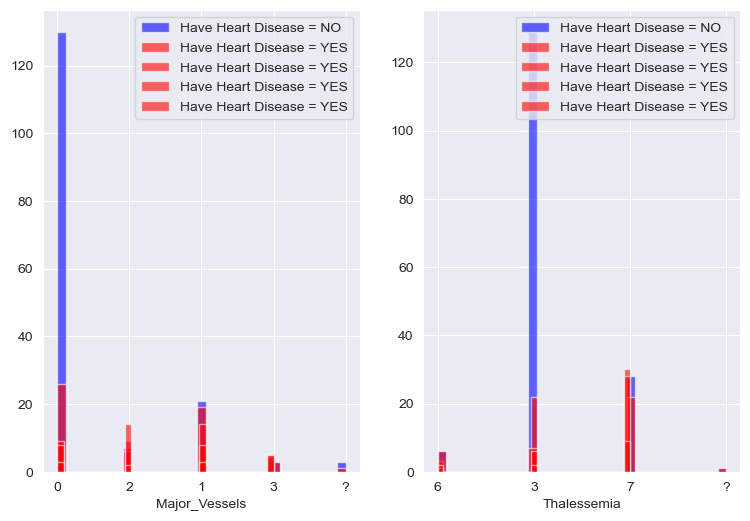

In [12]:
plt.figure(figsize=(9, 6))

for i, column in enumerate(categorical_cols, 1):
    plt.subplot(1, 2, i)
    data[data["Target"] == 0][column].hist(bins=35, color='blue', label='Have Heart Disease = NO', alpha=0.6)
    data[data["Target"] == 1][column].hist(bins=35, color='red', label='Have Heart Disease = YES', alpha=0.6)
    data[data["Target"] == 2][column].hist(bins=35, color='red', label='Have Heart Disease = YES', alpha=0.6)
    data[data["Target"] == 3][column].hist(bins=35, color='red', label='Have Heart Disease = YES', alpha=0.6)
    data[data["Target"] == 4][column].hist(bins=35, color='red', label='Have Heart Disease = YES', alpha=0.6)

    plt.legend()
    plt.xlabel(column)

The count plots above show the distribution of categorical variables in the dataset. Here are some observations:

- `Major_Vessels`: This measures the presence of disease in the major blood vessels to the heart. A higher number usually indicates more severe disease (from 0 to 3).
- `Thalessemia`: The blood disorder where: 3 = normal thalassemia; 6 = fixed defect thalassemia; 7 = reversable defect thalassemia.


<!-- 1. `General_Health`: Most individuals report their general health as "Very Good". "Poor" health is the least reported.
2. `Checkup`: The majority of individuals have had a checkup within the past year.
3. `Exercise`: Most individuals report that they exercise.
4. `Heart_Disease`: The majority of individuals do not have heart disease.
5. `Skin_Cancer`: A vast majority of individuals do not have skin cancer.
6. `Other_Cancer`: Similar to skin cancer, most individuals do not have other types of cancer.
7. `Depression`: Most individuals do not have depression.
8. `Diabetes`: The majority of individuals do not have diabetes.
9. `Arthritis`: More individuals do not have arthritis than those who do.
10. `Sex`: There are slightly more females than males in the dataset.
11. `Age_Category`: The age categories are quite evenly distributed, with a slightly higher count in the "65-69" category.
12. `Smoking_History`: Most individuals do not have a smoking history. -->


## Exploratory analysis: Bivariate and Multivariate analysis
### Target and gender comparison

Percentage of Female Patients: 32.01%
Percentage of Male Patients: 67.99%
Percentage of Patients Haven't Heart Disease: 54.13%
Percentage of Patients Have Heart Disease number 1: 18.15%
Percentage of Patients Have Heart Disease number 2: 11.88%
Percentage of Patients Have Heart Disease number 3: 11.55%
Percentage of Patients Have Heart Disease number 4: 4.29%


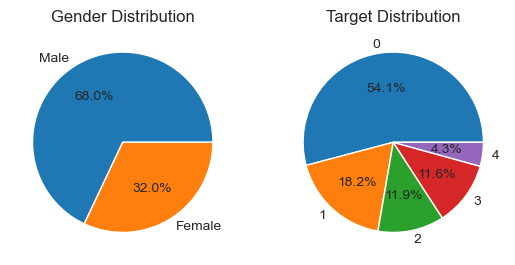

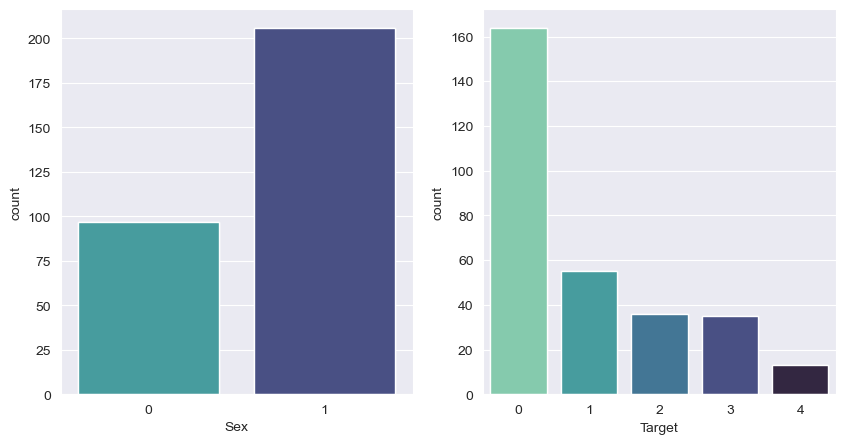

,Unnamed: 0,Age,Sex,Chest_Pain,Resting_Blood_Pressure,Colestrol,Fasting_Blood_Sugar,Rest_ECG,MAX_Heart_Rate,Exercised_Induced_Angina,ST_Depression,Slope
Target,,,,,,,,,,,,
0,147.073171,52.585366,0.560976,2.792683,129.250000,242.640244,0.140244,0.835366,158.378049,0.140244,0.586585,1.408537
1,151.927273,55.381818,0.836364,3.345455,133.254545,249.109091,0.072727,1.163636,145.927273,0.454545,1.005455,1.636364
2,171.083333,58.027778,0.805556,3.750000,134.194444,259.277778,0.250000,0.916667,135.583333,0.611111,1.780556,1.888889
3,151.742857,56.000000,0.800000,3.771429,135.457143,246.457143,0.228571,1.285714,132.057143,0.657143,1.962857,1.971429
4,139.000000,59.692308,0.846154,3.692308,138.769231,253.384615,0.076923,1.615385,140.615385,0.461538,2.361538,2.076923


In [13]:
countFemale = len(data[data.Sex == 0])
countMale = len(data[data.Sex == 1])
print("Percentage of Female Patients: {:.2f}%".format((countFemale / (len(data.Sex))*100)))
print("Percentage of Male Patients: {:.2f}%".format((countMale / (len(data.Sex))*100)))

countNoDisease = len(data[data.Target == 0]) # assumption that target == 0 is people with no disease (highest distribution)
countDisease_1 = len(data[data.Target == 1])
countDisease_2 = len(data[data.Target == 2])
countDisease_3 = len(data[data.Target == 3])
countDisease_4 = len(data[data.Target == 4])
print("Percentage of Patients Haven't Heart Disease: {:.2f}%".format((countNoDisease / (len(data.Target))*100)))
print("Percentage of Patients Have Heart Disease number 1: {:.2f}%".format((countDisease_1 / (len(data.Target))*100)))
print("Percentage of Patients Have Heart Disease number 2: {:.2f}%".format((countDisease_2 / (len(data.Target))*100)))
print("Percentage of Patients Have Heart Disease number 3: {:.2f}%".format((countDisease_3 / (len(data.Target))*100)))
print("Percentage of Patients Have Heart Disease number 4: {:.2f}%".format((countDisease_4 / (len(data.Target))*100)))

plt.subplot(1,2,1)
sex_count = data['Sex'].value_counts()
plt.pie(sex_count, labels=["Male","Female"], autopct='%1.1f%%')
plt.title('Gender Distribution')
# plt.show()
plt.subplot(1,2,2)
target_count = data['Target'].value_counts()
plt.pie(target_count, labels=target_count.index, autopct='%1.1f%%')
plt.title('Target Distribution')
plt.show()

numerical_cols = ["Target", "Sex"]

fig, axs = plt.subplots(1,2, figsize=(10,5))
for i, col in enumerate(numerical_cols):
    sns.countplot(x='Sex', data=data, palette="mako_r", ax=axs[0])
    plt.xlabel("Sex (0 = female, 1= male)")    
    sns.countplot(x="Target", data=data, palette="mako_r", ax=axs[1])

plt.show()

data.groupby('Target').mean()


### Heart Diseases respect Ages

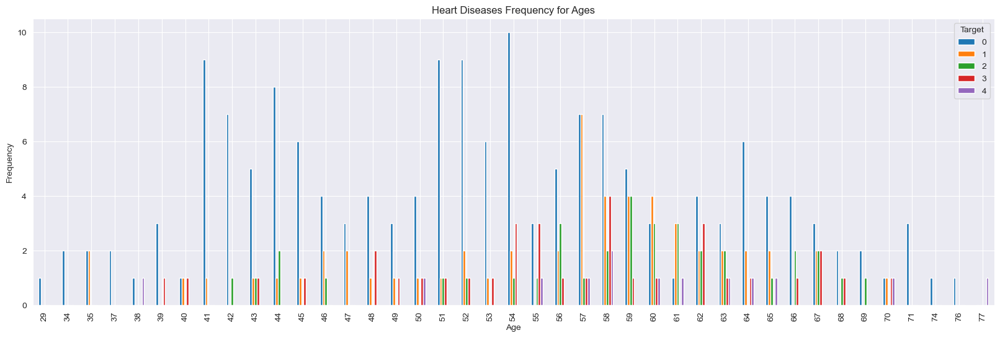

In [14]:
pd.crosstab(data.Age,data.Target).plot(kind="bar",figsize=(20,6))
plt.title('Heart Diseases Frequency for Ages')
plt.xlabel('Age')
plt.ylabel('Frequency')
# plt.savefig('heartDiseaseAndAges.png')
plt.show()


### Heart Diseases respect gender

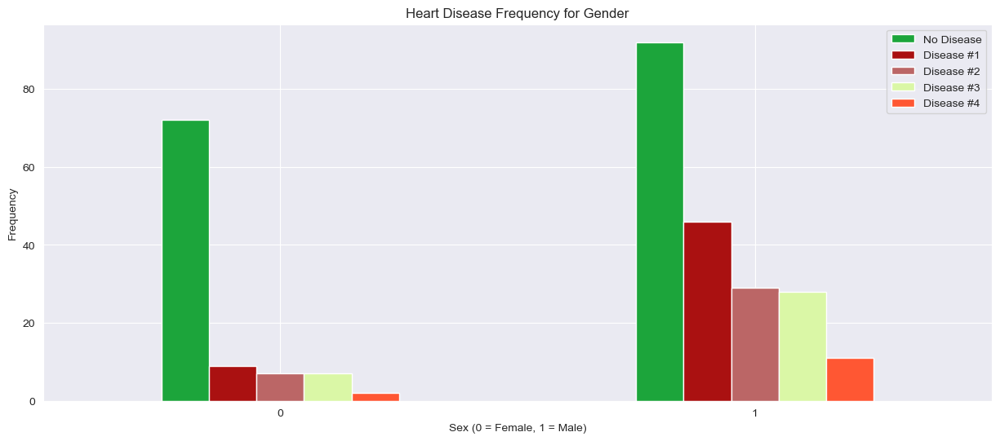

In [15]:
pd.crosstab(data.Sex,data.Target).plot(kind="bar",figsize=(15,6),color=['#1CA53B','#AA1111','#BB6666','#DAF7A6','#FF5733'])
plt.title('Heart Disease Frequency for Gender')
plt.xlabel('Sex (0 = Female, 1 = Male)')
plt.xticks(rotation=0)
plt.legend(["No Disease", "Disease #1", "Disease #2", "Disease #3", "Disease #4"])
plt.ylabel('Frequency')
plt.show()


 ### Heart Diseases respect different features

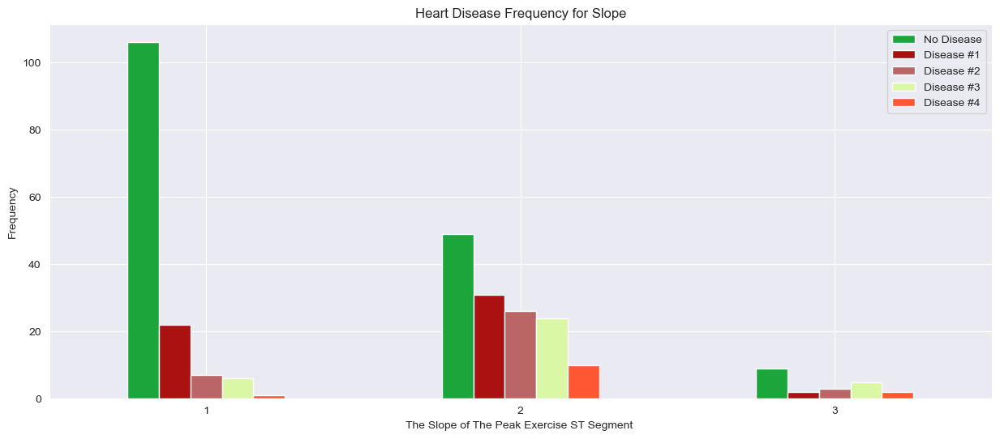

In [16]:
pd.crosstab(data.Slope,data.Target).plot(kind="bar",figsize=(15,6),color=['#1CA53B','#AA1111','#BB6666','#DAF7A6','#FF5733'])
plt.title('Heart Disease Frequency for Slope')
plt.xlabel('The Slope of The Peak Exercise ST Segment ')
plt.xticks(rotation = 0)
plt.legend(["No Disease", "Disease #1", "Disease #2", "Disease #3", "Disease #4"])
plt.ylabel('Frequency')
plt.show()


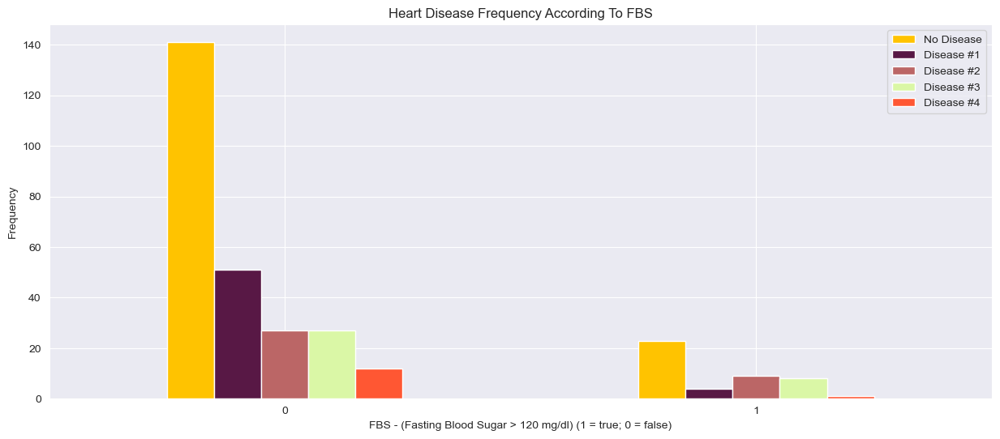

In [17]:
# pd.crosstab(data.Fasting_Blood_Sugar,data.Target).plot(kind="bar",figsize=(15,6),color=['#FFC300','#581845' ])
pd.crosstab(data.Fasting_Blood_Sugar,data.Target).plot(kind="bar",figsize=(15,6),
                                                       color=['#FFC300','#581845','#BB6666','#DAF7A6','#FF5733'])
plt.title('Heart Disease Frequency According To FBS')
plt.xlabel('FBS - (Fasting Blood Sugar > 120 mg/dl) (1 = true; 0 = false)')
plt.xticks(rotation = 0)
plt.legend(["No Disease", "Disease #1", "Disease #2", "Disease #3", "Disease #4"])
plt.ylabel('Frequency')
plt.show()


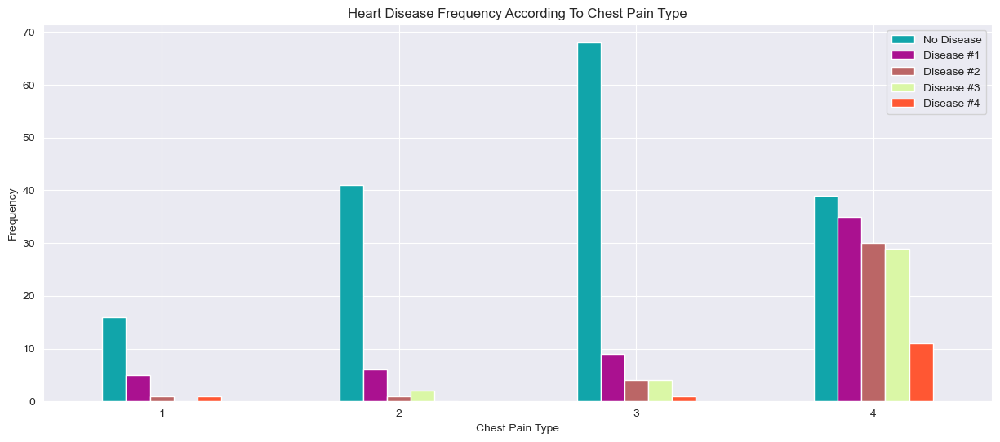

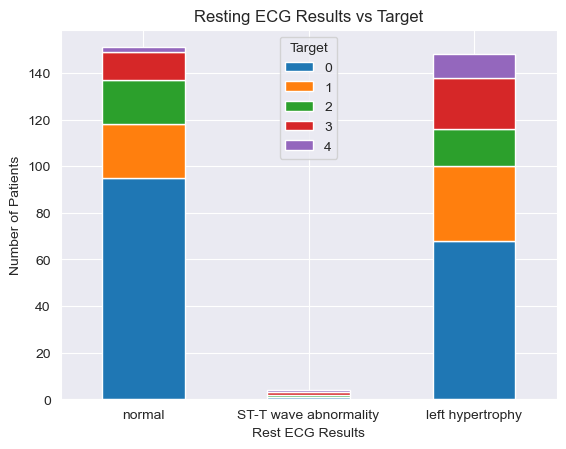

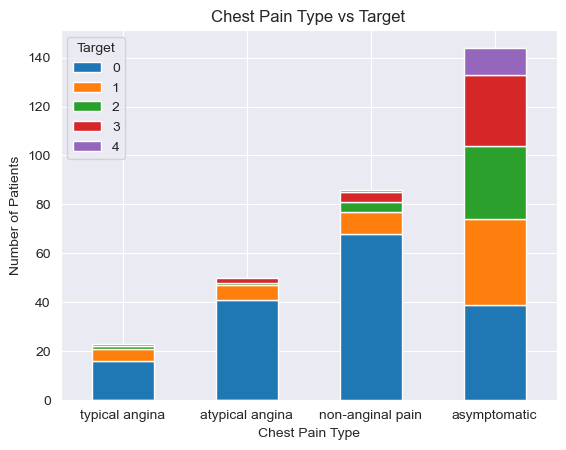

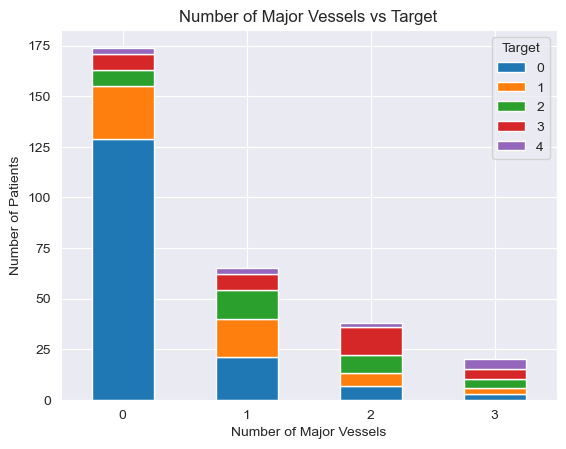

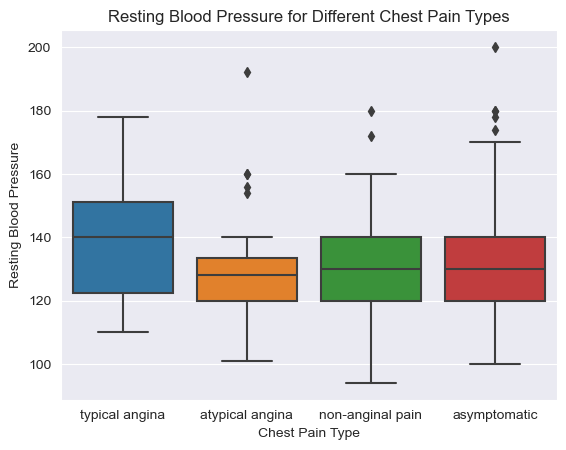

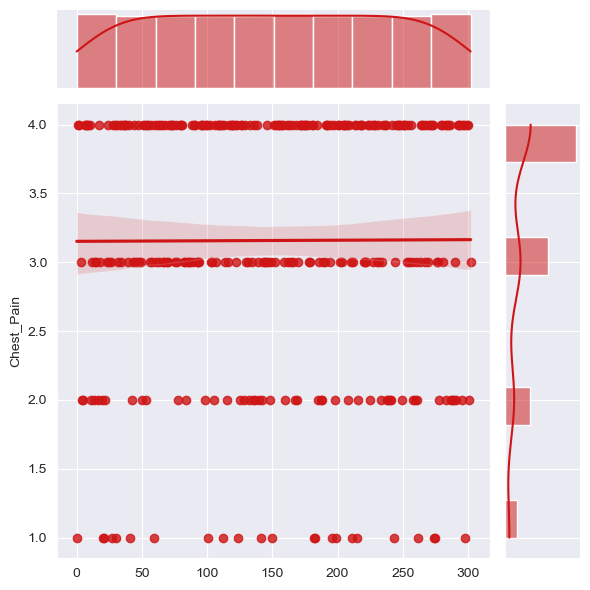

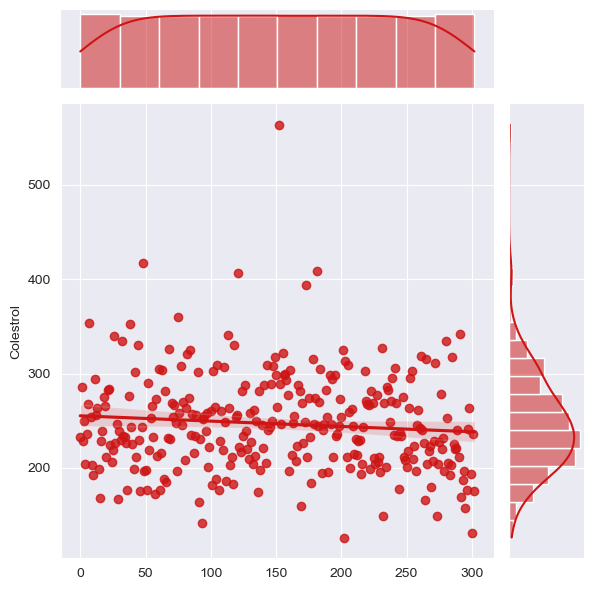

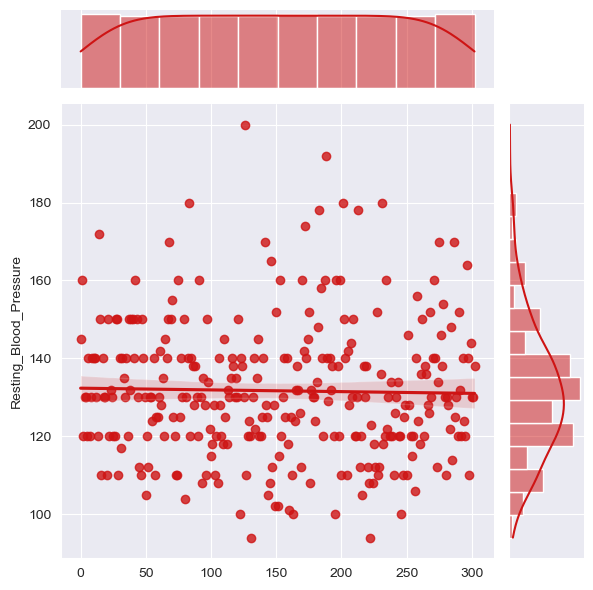

In [18]:
pd.crosstab(data.Chest_Pain,data.Target).plot(kind="bar",figsize=(15,6),color=['#11A5AA','#AA1190',
                                                                               '#BB6666','#DAF7A6','#FF5733'])
plt.title('Heart Disease Frequency According To Chest Pain Type')
plt.xlabel('Chest Pain Type')
plt.xticks(rotation = 0)
plt.legend(["No Disease", "Disease #1", "Disease #2", "Disease #3", "Disease #4"])
plt.ylabel('Frequency')
plt.show()

# rest_ecg_count = data['Rest_ECG'].value_counts()
# plt.bar(rest_ecg_count.index, rest_ecg_count.values)
# plt.title('Resting ECG Results Distribution')
# plt.xlabel('Rest ECG Results')
# plt.ylabel('Number of Patients')
# plt.xticks(rest_ecg_count.index) # ['ST-T Wave Abnormally', 'normal', 'left ventricular hypertrophy']
# plt.show()

restecg_target = data.groupby(['Rest_ECG', 'Target']).size().unstack().fillna(0)
restecg_target.plot(kind='bar', stacked=True)
plt.title('Resting ECG Results vs Target')
plt.xlabel('Rest ECG Results')
plt.ylabel('Number of Patients')
plt.xticks(ticks=[0,1,2], labels=['normal', 'ST-T wave abnormality', 'left hypertrophy'], rotation=0)
plt.show()

cp_target = data.groupby(['Chest_Pain', 'Target']).size().unstack().fillna(0)
cp_target.plot(kind='bar', stacked=True)
plt.title('Chest Pain Type vs Target')
plt.xlabel('Chest Pain Type')
plt.ylabel('Number of Patients')
plt.xticks(ticks=[0,1,2,3], labels=['typical angina', 'atypical angina', 'non-anginal pain', 'asymptomatic'], rotation=0)
plt.show()

ca_target = ds_clean.groupby(['Major_Vessels', 'Target']).size().unstack().fillna(0)
ca_target.plot(kind='bar', stacked=True)
plt.title('Number of Major Vessels vs Target')
plt.xlabel('Number of Major Vessels')
plt.ylabel('Number of Patients')
plt.xticks(rotation=0)
plt.show()

sns.boxplot(x='Chest_Pain', y='Resting_Blood_Pressure', data=data)
plt.title('Resting Blood Pressure for Different Chest Pain Types')
plt.xlabel('Chest Pain Type')
plt.ylabel('Resting Blood Pressure')
plt.xticks(ticks=[0,1,2,3], labels=['typical angina', 'atypical angina', 'non-anginal pain', 'asymptomatic'])
plt.show()

# sns.jointplot(x.loc[:,'concavity_worst'], x.loc[:,'concave points_worst'], kind="regg", color="#ce1414")
sns.jointplot(data.loc[:,'Chest_Pain'], kind="reg", color="#ce1414")
# ValueError: `kind` must be one of ['scatter', 'hist', 'hex', 'kde', 'reg', 'resid'], but 'regg' was passed.
plt.show()

sns.jointplot(data.loc[:,'Colestrol'], kind="reg", color="#ce1414")
plt.show()

sns.jointplot(data.loc[:,'Resting_Blood_Pressure'], kind="reg", color="#ce1414")
plt.show()


### Scatter Plots

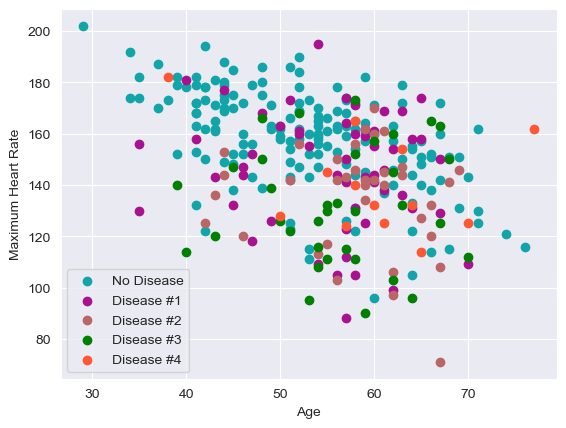

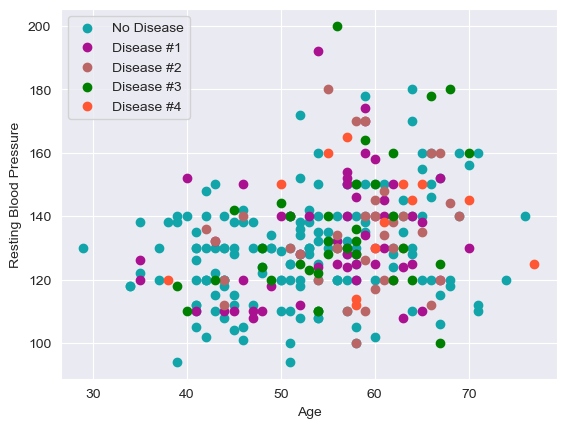

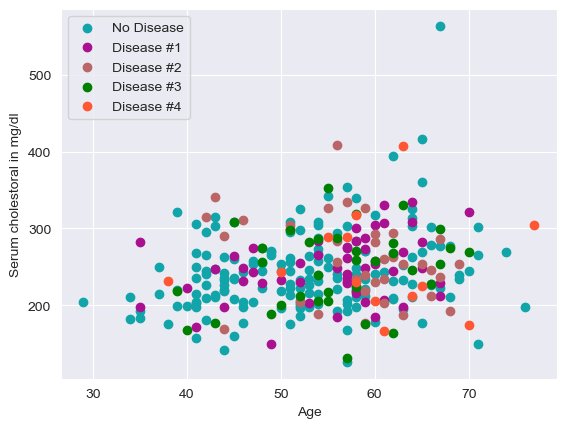

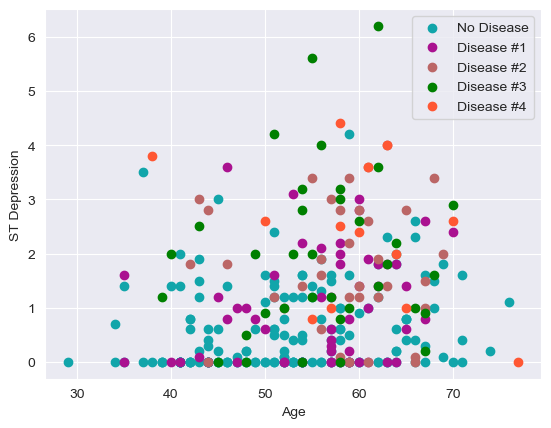

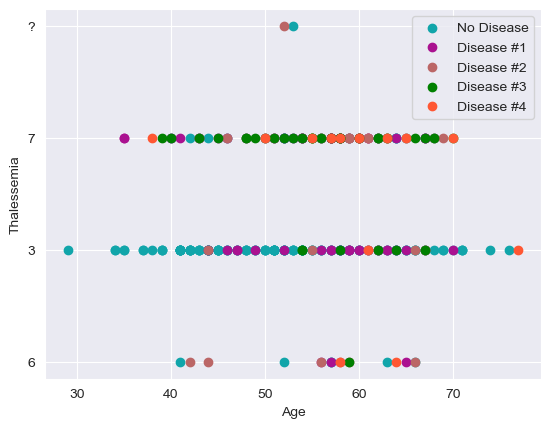

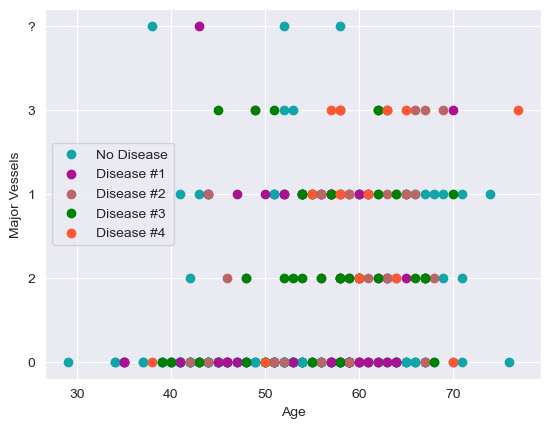

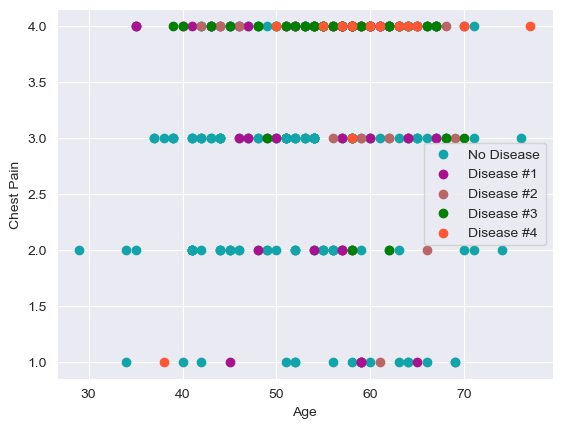

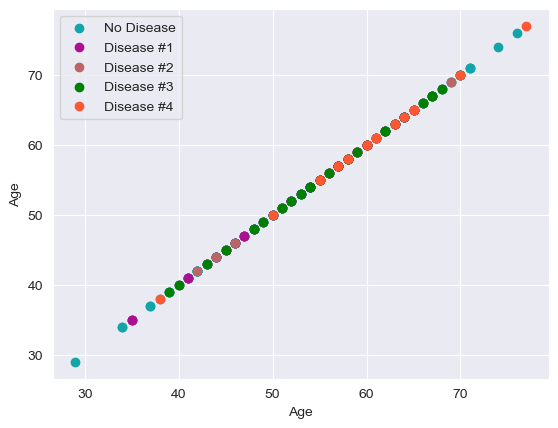

In [19]:
colors = ['#11A5AA','#AA1190','#BB6666','green','#FF5733']

# Maximum Heart Rate and Age
for i, cols in enumerate(colors):
#     print(i)    
    plt.scatter(x=data.Age[data.Target==i], y=data.MAX_Heart_Rate[(data.Target==i)], c=cols)
plt.legend(["No Disease", "Disease #1", "Disease #2", "Disease #3", "Disease #4"])
plt.xlabel("Age")
plt.ylabel("Maximum Heart Rate")
plt.show()

# Resting Blood Pressure and Age
for i, cols in enumerate(colors):
    plt.scatter(x=data.Age[data.Target==i], y=data.Resting_Blood_Pressure[(data.Target==i)], c=cols)
plt.legend(["No Disease", "Disease #1", "Disease #2", "Disease #3", "Disease #4"])
plt.xlabel("Age")
plt.ylabel("Resting Blood Pressure")
plt.show()

# Serum cholestroral and Age
for i, cols in enumerate(colors):
    plt.scatter(x=data.Age[data.Target==i], y=data.Colestrol[(data.Target==i)], c=cols)
plt.legend(["No Disease", "Disease #1", "Disease #2", "Disease #3", "Disease #4"])
plt.xlabel("Age")
plt.ylabel("Serum cholestoral in mg/dl")
plt.show()

# ST Depression and Age
for i, cols in enumerate(colors):
    plt.scatter(x=data.Age[data.Target==i], y=data.ST_Depression[(data.Target==i)], c=cols)
plt.legend(["No Disease", "Disease #1", "Disease #2", "Disease #3", "Disease #4"])
plt.xlabel("Age")
plt.ylabel("ST Depression")
plt.show()

# Thalessemia and Age
for i, cols in enumerate(colors):
    plt.scatter(x=data.Age[data.Target==i], y=data.Thalessemia[(data.Target==i)], c=cols)
plt.legend(["No Disease", "Disease #1", "Disease #2", "Disease #3", "Disease #4"])
plt.xlabel("Age")
plt.ylabel("Thalessemia")
plt.show()

# Major Vessels and Age
for i, cols in enumerate(colors):
    plt.scatter(x=data.Age[data.Target==i], y=data.Major_Vessels[(data.Target==i)], c=cols)
plt.legend(["No Disease", "Disease #1", "Disease #2", "Disease #3", "Disease #4"])
plt.xlabel("Age")
plt.ylabel("Major Vessels")
plt.show()

# Chest Pain and Age
for i, cols in enumerate(colors):
    plt.scatter(x=data.Age[data.Target==i], y=data.Chest_Pain[(data.Target==i)], c=cols)
plt.legend(["No Disease", "Disease #1", "Disease #2", "Disease #3", "Disease #4"])
plt.xlabel("Age")
plt.ylabel("Chest Pain")
plt.show()

# Age and Age
for i, cols in enumerate(colors):
    plt.scatter(x=data.Age[data.Target==i], y=data.Age[(data.Target==i)], c=cols)
plt.legend(["No Disease", "Disease #1", "Disease #2", "Disease #3", "Disease #4"])
plt.xlabel("Age")
plt.ylabel("Age")
plt.show()


### DistPlots

Text(0.5, 1.0, 'Resting Blood Pressure Interval')

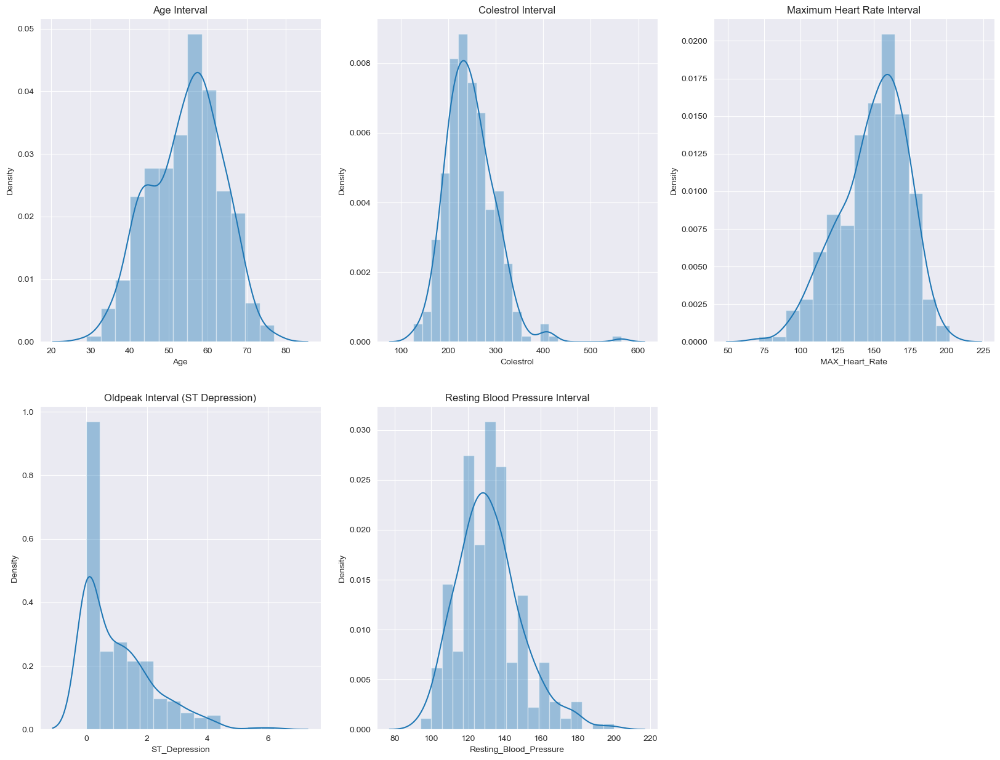

In [20]:
plt.figure(figsize=(20,15))

plt.subplot(2,3,1)
sns.distplot(data['Age']).set_title('Age Interval')

plt.subplot(2,3,2)
sns.distplot(data['Colestrol']).set_title('Colestrol Interval')

plt.subplot(2,3,3)
sns.distplot(data['MAX_Heart_Rate']).set_title('Maximum Heart Rate Interval')

plt.subplot(2,3,4)
sns.distplot(data['ST_Depression']).set_title('Oldpeak Interval (ST Depression)')

plt.subplot(2,3,5)
sns.distplot(data['Resting_Blood_Pressure']).set_title('Resting Blood Pressure Interval')


### BarPlots

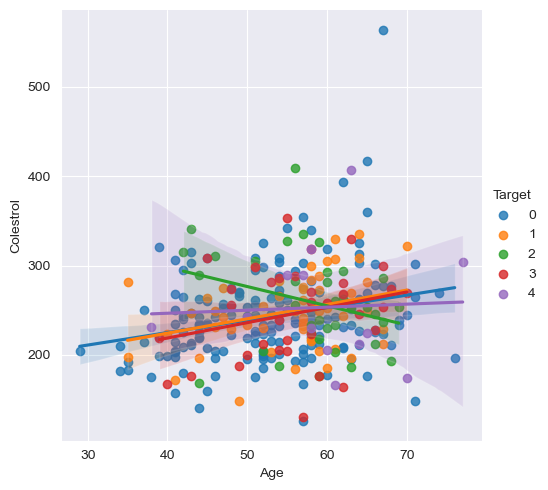

In [21]:
sns.lmplot(x='Age', y='Colestrol', hue='Target', data=data)


### PairPlot
It will require some minutes to complete the rendering. It's a large matrix of subplots that contains the all possible pairs of plot. 

Some minutes has to be waited for this rendering!


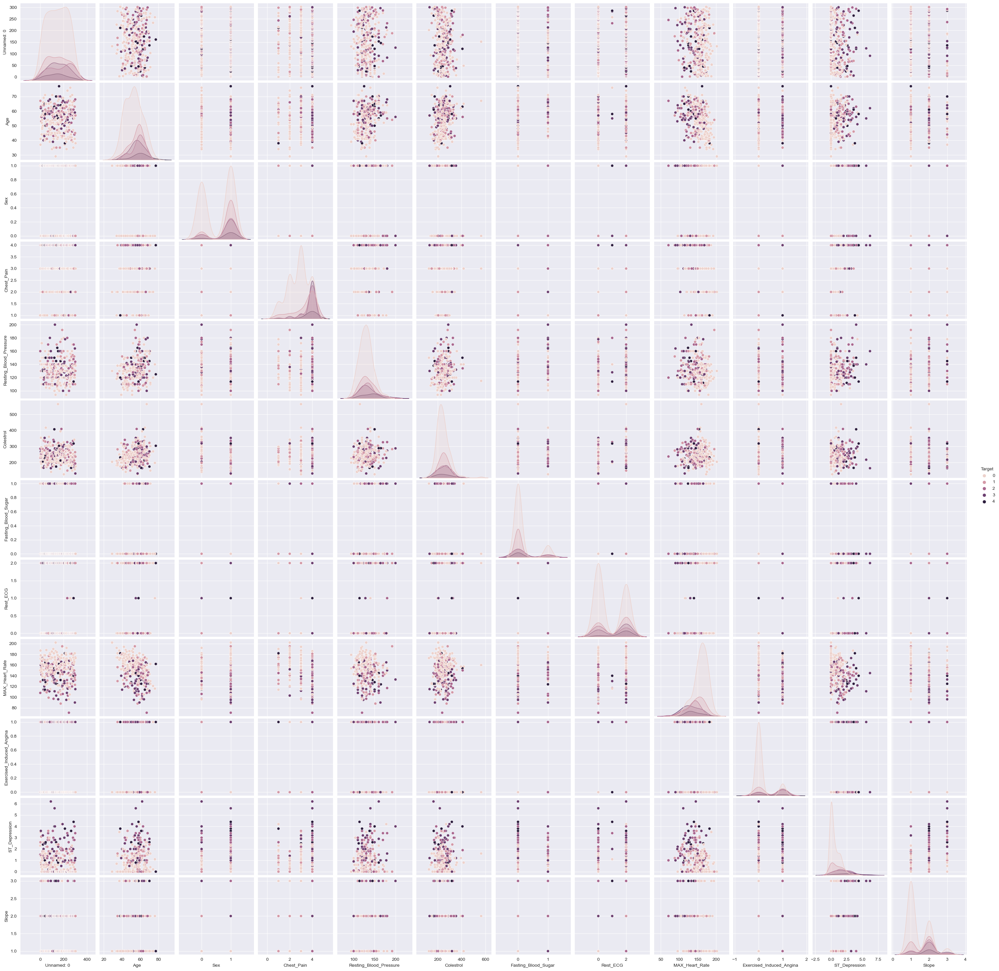

In [22]:
print("Some minutes has to be waited for this rendering!")
sns.pairplot(data=data, hue="Target")


Next, we can explore correlations between different features.

## Correlation
### Heatmap

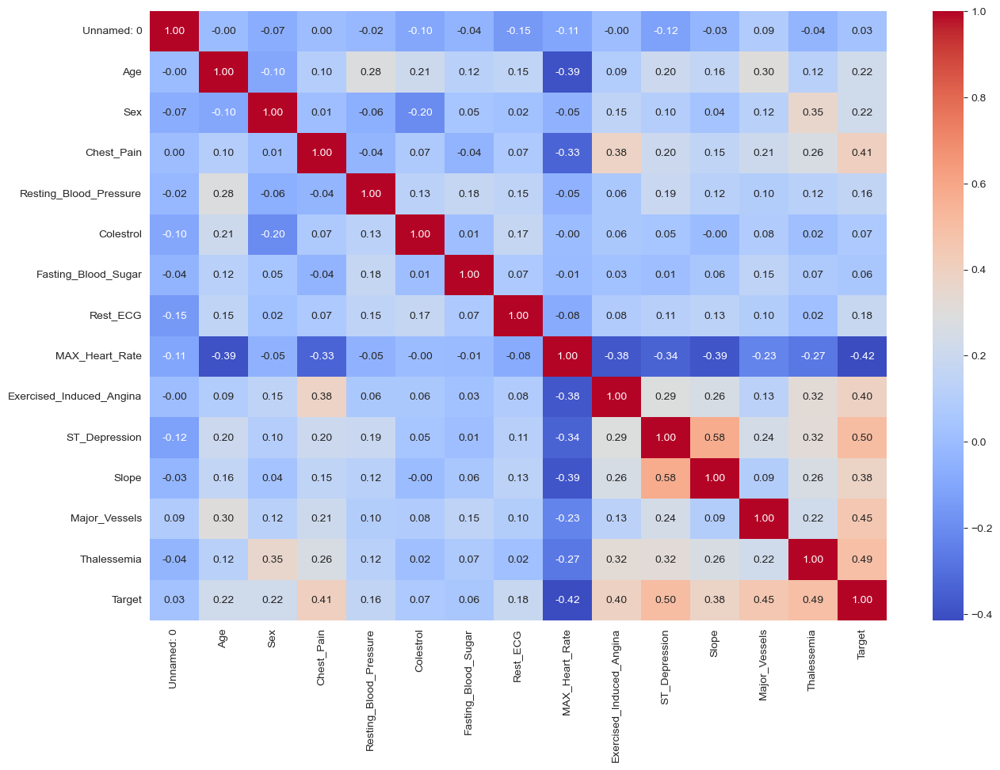

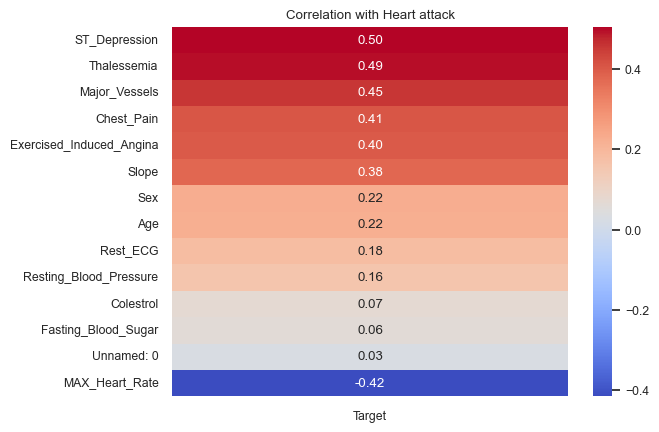

In [23]:
# Graph I
# Converting categorical variables into numerical format for correlation analysis
df_encoded = data.copy()
for col in df_encoded.select_dtypes(include=['object']):
    df_encoded[col] = df_encoded[col].astype('category').cat.codes

# Calculating the correlations
correlations = df_encoded.corr()

# Plotting the correlations in a heatmap
plt.figure(figsize=(15,10))
sns.heatmap(correlations, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.show()

#Graph II
corr = df_encoded.corr()
target_corr = corr['Target'].drop('Target')

# Sort correlation values in descending order
target_corr_sorted = target_corr.sort_values(ascending=False)

# Create a heatmap of the correlations with the target column
sns.set(font_scale=0.8)
sns.set_style("white")
sns.set_palette("PuBuGn_d")
sns.heatmap(target_corr_sorted.to_frame(), cmap="coolwarm", annot=True, fmt='.2f')
plt.title('Correlation with Heart attack')
plt.show()


The heatmap above shows the correlations between different features in the dataset. Values range from -1 to 1, where -1 indicates a perfect negative correlation, 1 indicates a perfect positive correlation, and 0 indicates no correlation.

Here are some notable correlations:

1. `Slope` and `ST_Depression` are highly positively correlated (0.58). 
2. `Target` has a moderate positive correlation with `Exercised_Induced_Angina` (0.40), `ST_Depression` (0.50), `Slope` (0.38), `Major_Vessels` (0.45) and `Thalessemia` (0.49). It has also a moderate negative correlation with `MAX_Heart_Rate` (-0.42). 
3. `Age` has a moderate positive correlation with `Resting_Blood_Pressure` (0.28), `Colestrol` (0.21), `ST_Depression` (0.20) and `Major_Vessels` (0.30), indicating that these conditions are more common in age categories.
4. `Age` has a moderate negative correlation with `MAX_Heart_Rate`(-0.39), indicating that these conditions are more common in age categories.


## EXTRA PLOTS
### Another Heatmap

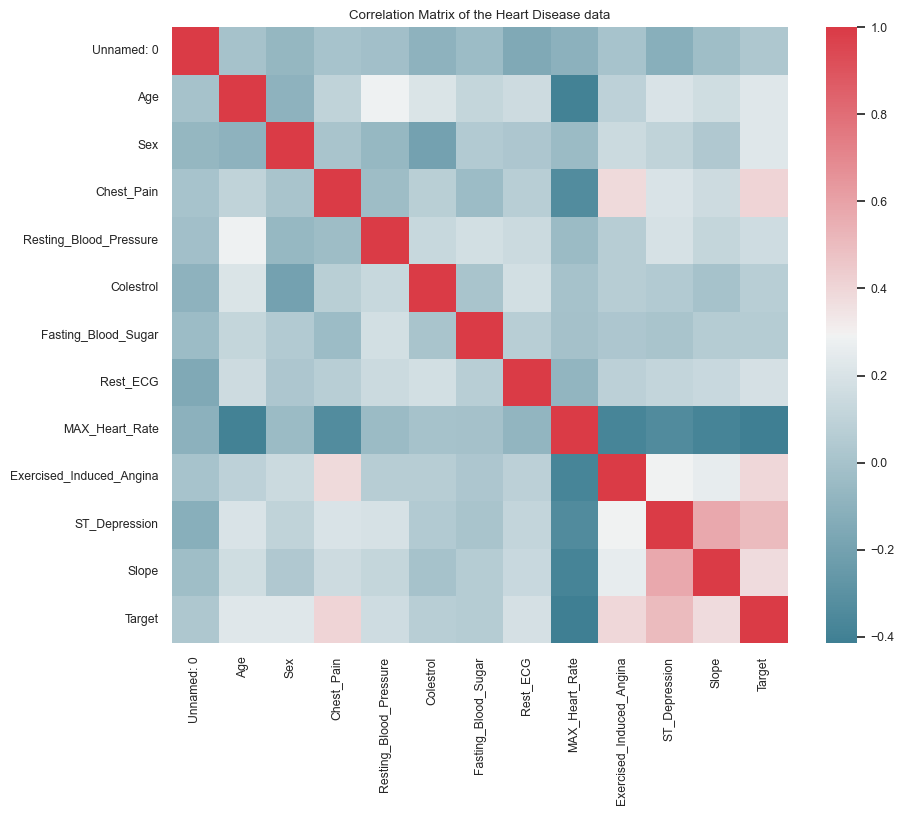

In [24]:
f, ax = plt.subplots(figsize=(10, 8))
ax.title.set_text('Correlation Matrix of the Heart Disease data')
corr = data.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=int), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax);


Data shows the correlation between indicators from the table. So, negatively most correlated values were max heart rate achieved and age, which suggests that the maximum pressure indicators are highly dependent of a person's age.

The most meaningful connection is observed in Diagnosis of heart disease and such values as the presence or absence of detected angina (exang), angina ST indicators (oldpeak), as well as thalassemia (thal) and peak exercise ST segment (slope).

This means that the diagnosis of a particular type of heart disease depends on the above indicators, the sum of the results of which gives an idea of the type of human disease (diagnosis of the type of disease is directly related to the symptoms).


### Pairwise scatter plots for continuous features

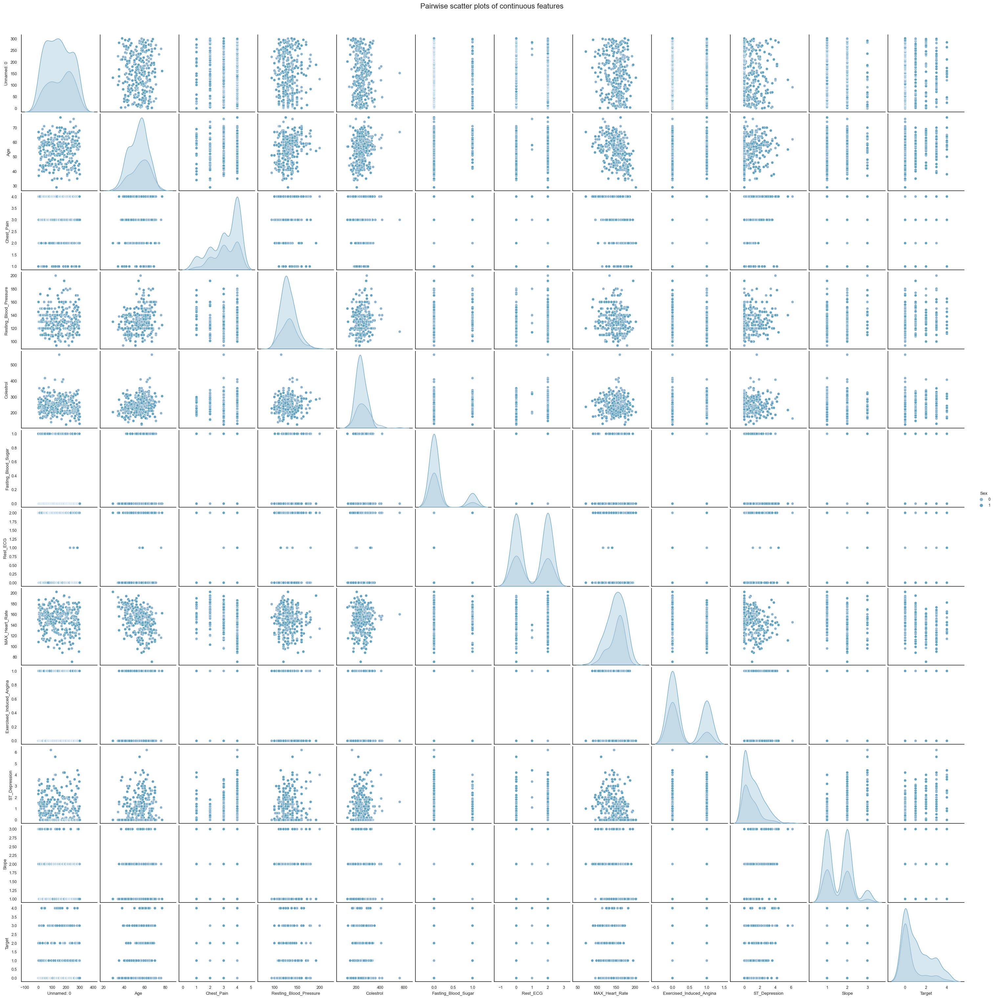

In [25]:
g= sns.pairplot(data=data, hue="Sex")
g.fig.suptitle("Pairwise scatter plots of continuous features", y=1.02, fontsize=16);


This plots shows the correlation of values to each other. So, for example, deviating indicators for Serum Cholestero are observed in people over 60

Also, Resting blood pressure is fairly uniform with an increase in the Max heart rate

The most frequent indicators of Resting blood pressure are observed at 3-4 ST depression types induced by exercise relative to rest, which suggests a general increase in angina pectoris in these types of diagnostics

this graph shows the distribution of all indicators for heart disease relative to comparison by gender (1(orange) - men, 0(blue) - women)

For example, the Serum Cholestero score is generally lower in men than in women. Also, mostly men are subjected to typical angina, and women - to non-anginal pain

Interesting that only the second 'num' type has an ST-T wave abnormality in a woman, because the rest of the types are manifested in men

Also interesting that any kind of sloping with resting blood pressure is observed in men on average, and in deviating (low and high) values are more typical for women


### Boxplot

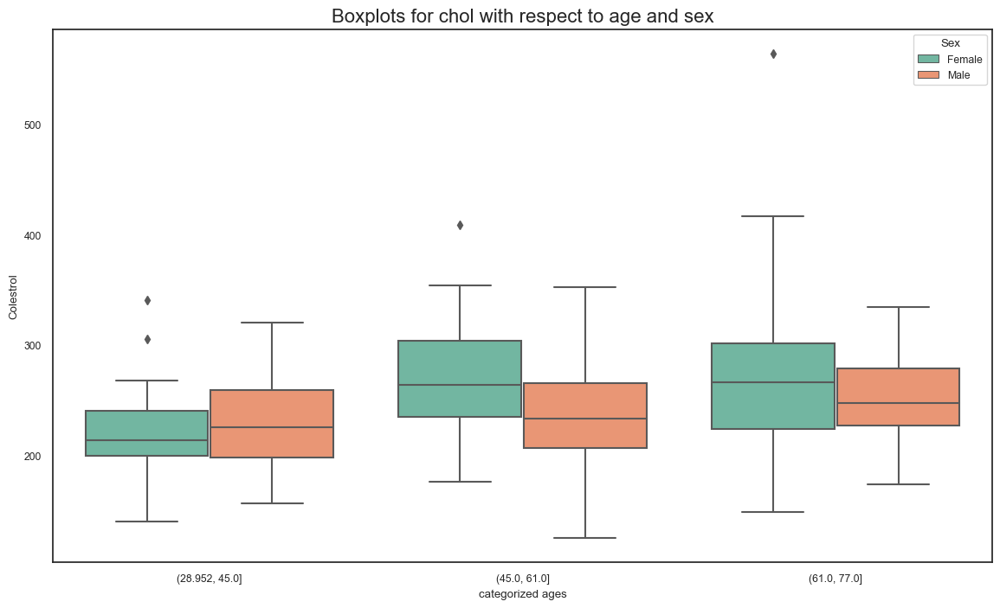

In [26]:
data["categorized ages"] = pd.cut(data["Age"], 3)

fig, ax = plt.subplots(figsize=(14,8))

f = sns.boxplot(x="categorized ages", y="Colestrol", data=data, hue="Sex", palette="Set2");

f.legend_.texts[1].set_text("Male")
f.legend_.texts[0].set_text("Female")
f.axes.set_title("Boxplots for chol with respect to age and sex", fontsize=16)
plt.show()

### Jointplot

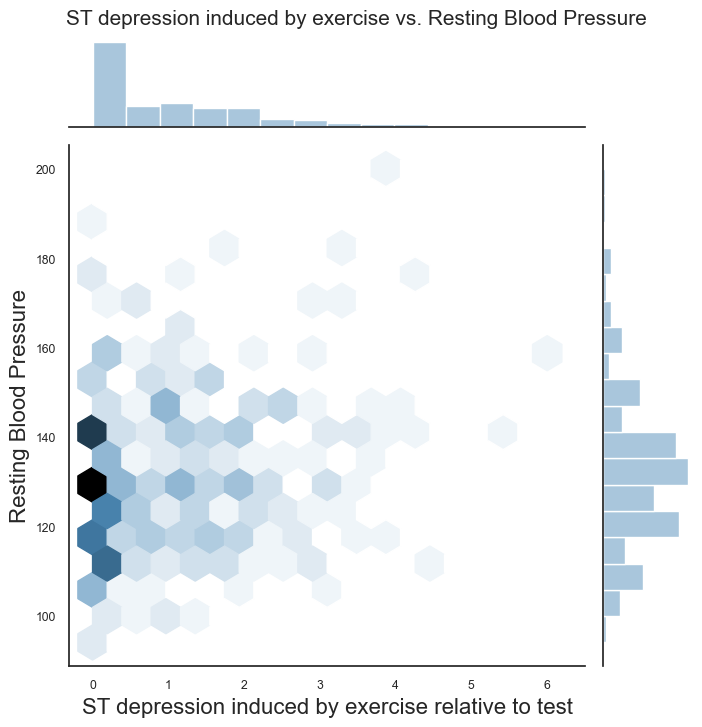

In [27]:
g = sns.jointplot(x='ST_Depression',y='Resting_Blood_Pressure',data=data, height=7,kind='hex')
g.set_axis_labels('ST depression induced by exercise relative to test', 'Resting Blood Pressure', fontsize=16)
g.fig.suptitle("ST depression induced by exercise vs. Resting Blood Pressure", y=1.02, fontsize=15);



The most common value that appeared for people with low angina at rest is 130-135 mmHg (strange, that the normal pressure is lower like 120 or smth like that)

As the risk of high resting blood pressure increased, the number of people who had these symptoms decreased.

For example, there were cases of high (180-200 mmHg) blood pressure, but the number of people with these indicators was small

It's in general indicates a low risk of oldpick and ST depression with a normal average of blood pressure


### LMPLOT

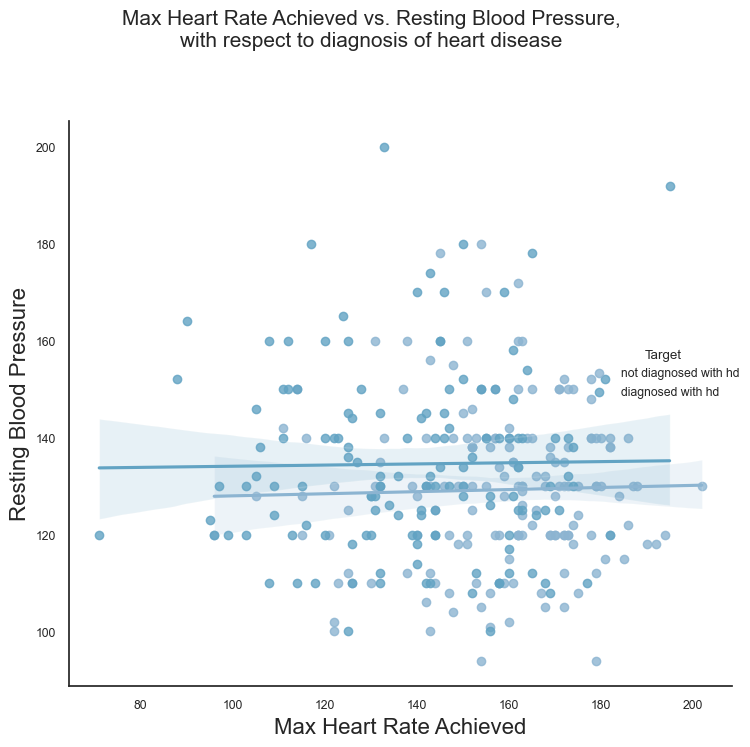

In [28]:
data_vis = data['Target'].replace([1, 2, 3, 4], 1)
data_dropped = data.drop('Target', axis=1)
data_dropped['Target']= data_vis

f = sns.lmplot(x='MAX_Heart_Rate', y='Resting_Blood_Pressure', data=data_dropped, hue='Target', height=7)

new_labels = ['not diagnosed with hd', 'diagnosed with hd']
for t, l in zip(f._legend.texts, new_labels): t.set_text(l)

f.set_axis_labels('Max Heart Rate Achieved', 'Resting Blood Pressure', fontsize=16)
f.fig.suptitle("Max Heart Rate Achieved vs. Resting Blood Pressure,\nwith respect to diagnosis of heart disease", y=1.06, fontsize=15)
plt.tight_layout();

This plot shows that healthy people have an increasing in Resting blood pressure, that provokes Max heart rate, while diagnostic unhealthy patients have this value decreased, which indicates abnormaliries in the heart system


### BOXPLOT

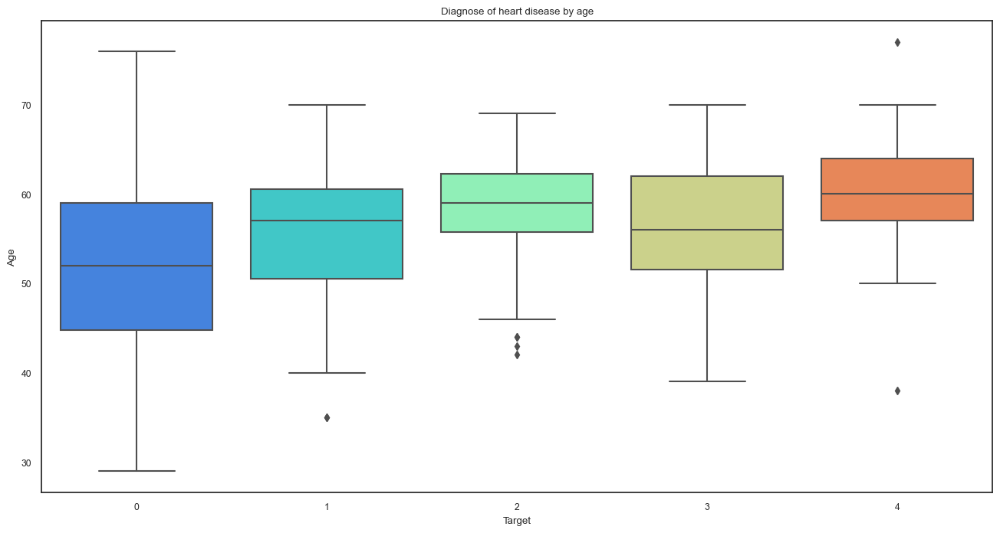

In [29]:
fig, ax = plt.subplots(figsize=(16,8))
ax.title.set_text('Diagnose of heart disease by age')
sns.boxplot(x="Target", y="Age", data=data, palette='rainbow');


On the boxplot, values for the diagnosis of heart treatment and age indicators are presented. The greatest scatter of values is observed in representatives with no diseases and an average age of about 52 years.

the most densely grouped category is contained in 2 diagnostics, where people of 56-60 years old are concentrated with a small number of point emissions by the age of 70 and 45 years.

Obviously, the most common average age for heart disease in any of the diagnoses is 55-57 years. In most diagnostics, the 25% quartile is a larger age range than the upper 75%, which is the basis for the conclusion that when the average age of incidence is reached, there is a greater risk and the number of cases remains in a small age range.

### VIOLINPLOT

[Text(0, 0, 'Typical Angina'),
 Text(1, 0, 'Atypical Angina'),
 Text(2, 0, 'Non-anginal Pain'),
 Text(3, 0, 'Asymptotic')]

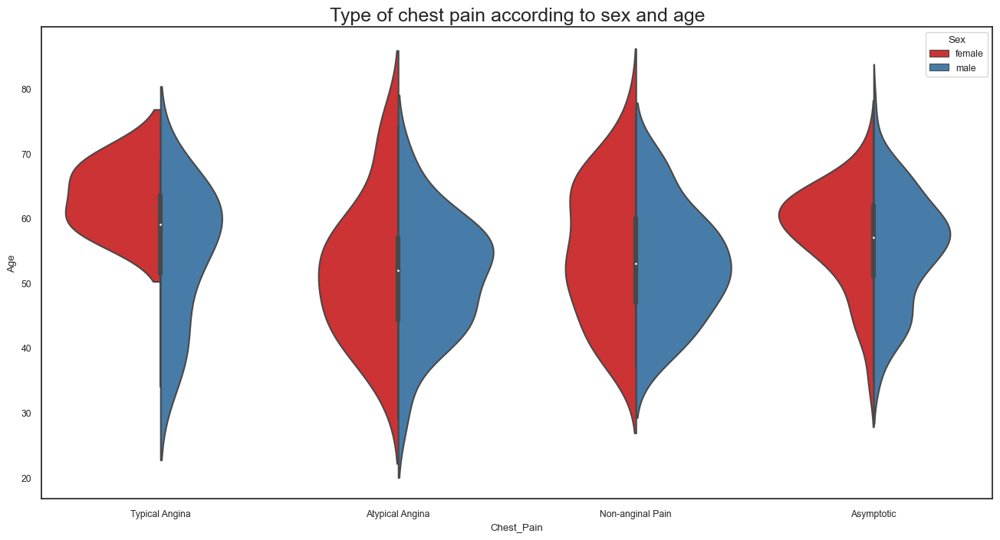

In [30]:
fig, ax = plt.subplots(figsize=(16,8))
f = sns.violinplot(x="Chest_Pain", y="Age", data=data, hue='Sex', split=True, palette='Set1')
f.legend_.texts[1].set_text("male")
f.legend_.texts[0].set_text("female")
ax.set_title("Type of chest pain according to sex and age", size=18)
ax.set_xticklabels(['Typical Angina','Atypical Angina','Non-anginal Pain','Asymptotic'])


women practically do not get a typical angina, but they are more susceptible

to serious diseases compared to men (the most likely disease is 50-60 years)

Men are highly prone to anginal pain closer to 45 y.o

### STRIPPLOT

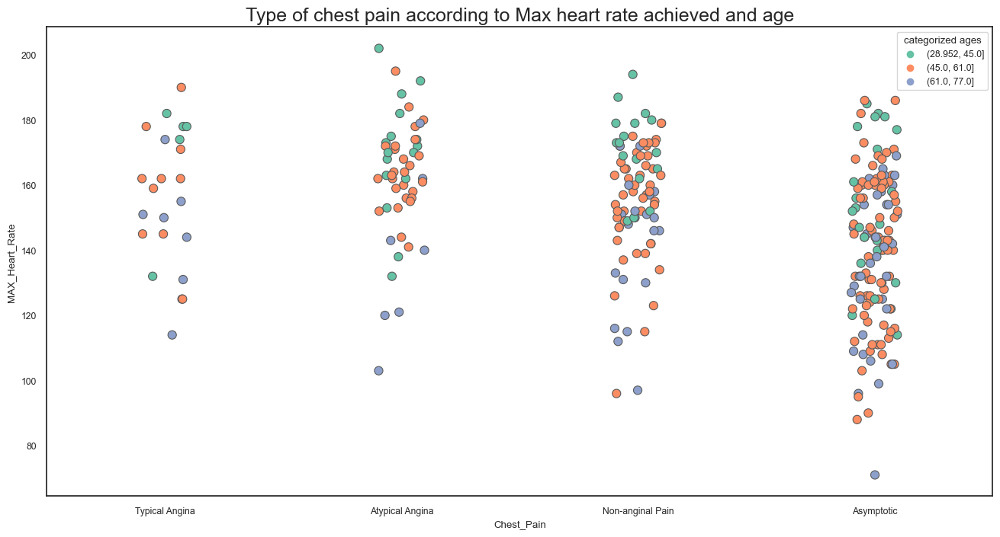

In [31]:
fig, ax = plt.subplots(figsize=(16,8))
sns.stripplot(data=data,x="Chest_Pain", y="MAX_Heart_Rate", hue="categorized ages", linewidth=0.8, palette="Set2", size=8)
ax.set_title("Type of chest pain according to Max heart rate achieved and age", size=18)
ax.set_xticklabels(['Typical Angina','Atypical Angina','Non-anginal Pain','Asymptotic']);


in people with asymptotic, on average, a lower Max heart rate is achieve

In case of atypical angina this indicator is the highest

### BARPLOT

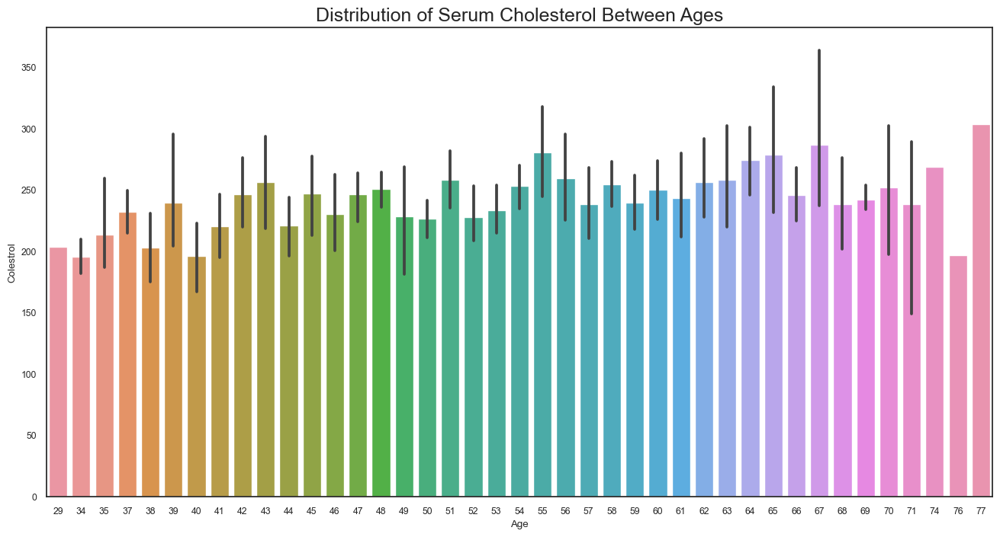

In [32]:
fig, ax = plt.subplots(figsize=(16,8))
# data["Age"] = data["Age"].astype(int)
sns.barplot(data=data, x="Age", y="Colestrol")
ax.set_title("Distribution of Serum Cholesterol Between Ages", size=18);


This graph shows n the patient's age and the amount of Serum Cholestero in mg / dl. Visualization showed that the highest indicator is observed at 55 years old, after which there is a gradual decrease until reaching 67-77 years old, where the indicators grow again

The general trend shows that the number of Serum Cholestero on average increases due to age, despite deviating cases when this indicator reaches the norm (or even below the norm) at the age of over 50


### JOINTPLOT

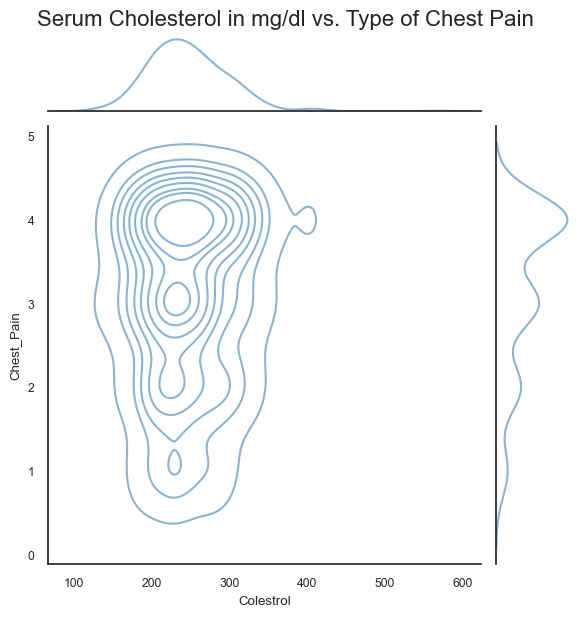

In [33]:
g = sns.jointplot(x="Colestrol", y="Chest_Pain", data=data, kind='kde')
g.fig.suptitle("Serum Cholesterol in mg/dl vs. Type of Chest Pain", y=1.02, fontsize=16);


cp. Type of chest pain. (1 = typical angina, 2 = atypical angina, 3 = non — anginal pain, 4 = asymptotic). chol. Serum Cholestero in mg/dl.

This plot shows the correlation between the type of chest pain and the amount of Serum Cholestero in mg / dl

According to the data obtained as a result of plotting the picture, it can be seen that the most frequent indicator of normal Serum Cholestero in the concentration of cases is manifested in asymptotic angina, which is much less common for, for example, typical angina.

Deviations in the direction of decreasing and increasing Serum Cholestero are most often observed in asymptotic and non-anginal pain, which indicates an even distribution of data, where the most frequent cases are with asymptotic disease and more rare with common typical angina.

# Data Cleaning and Preprocessing
As next step, we have illustrated: 
- the description of overall preprocessing phases with examples; 
- t-SNE exploratory analysis of the data.

After these points, the core part begins, we have built a compact code from data loading, preprocessing and model development with the required evaluation and comparison at the end.

## Checking for missing values again

In [34]:
# Data loading
data = pd.read_csv('Correct_Dataset.csv')

# Checking for missing values again
missing_values = data.isnull().sum()

missing_values


Unnamed: 0                  0
Age                         0
Sex                         0
Chest_Pain                  0
Resting_Blood_Pressure      0
Colestrol                   0
Fasting_Blood_Sugar         0
Rest_ECG                    0
MAX_Heart_Rate              0
Exercised_Induced_Angina    0
ST_Depression               0
Slope                       0
Major_Vessels               0
Thalessemia                 0
Target                      0
dtype: int64

In [35]:
import statistics 
from statistics import mode 
from statistics import median


for feature in numerical_cols:
    mode_value= mode(data[feature])
    
    data[feature] = data[feature].replace('?',mode_value)
    
for feature in categorical_cols:
    median_value = median(data[feature])
    
    data[feature] = data[feature].replace('?',median_value)
    

The dataset does not contain any missing values. This is great as it simplifies the data cleaning process.

Next, let's proceed with encoding categorical variables. 

## Encoding and custom feature selection

Machine Learning is based on mathematical equations and does not work usually with categorical (usually Object type) values (like column with String variables). In such scenarios, encoding is applied which converts categorical values into numerical values. There are different types of encoding methodologies, some of them are:

- **Ordinal Encoding**: If the categories have a clear ranking or order (e.g., '0', '1', '2' and '3'), we can convert these into ordered numbers (e.g., 1, 2, 3). This type of encoding is known as ordinal encoding.

- **One Hot Encoding** — This is the most popular method in which each category of a vector is mapped to 0 or 1 denoting if the feature is present or not. It generally produces the same amount of columns in output as categories the end product. E.g. For Regression, we encode N-1 (dropping the first or last column) columns and for Classification all N columns are encoded for e.g. tree-based algorithm. We can also say that with this type of encoding, if the categories do not have an order or priority, we can create separate columns for each category which are either true or false.

- **Label Encoding** — For a N number of categories in a feature, this method assigns a value from 1 to N for each category. No order is maintained between the categories in the method and very loose relationship can be derived by carefully observation.

With encoding, the machine learning algorithm works better and the accuracy of the used models will be higher. If we don't do the encoding that includes the removal of outlier value `?` inside `Major_Vessels` and `Thalessemia`, and if we remove that outlier by ourself, the accuracy of the models will be lower.
We'll use only ordinal because `Major_Vessels` and `Thalessemia` have a clear ranking: 
- number of major vessels that can be equal to 0, 1, 2 or 3; 
- blood disorder thalassemia that can be normal (3), fixed defect (6), and reversable defect(7)).

<!-- It can be good the encoding also for numerical variables. -->

Trying the One-Hot Encoding we confirmed that is not suitable for this categorical variables because we obtained error during the scaling.

Let's continue with these encodings.

In [36]:
# ENCODING OF CATEGORICAL VARIABLES (object type)
# With encoding, the machine learning algorithm works better, accuracy is higher!

# Columns for ordinal encoding
ordinal_cols = ["Major_Vessels", "Thalessemia"]

# Perform ordinal encoding
ordinal_encoder = OrdinalEncoder()
data[ordinal_cols] = ordinal_encoder.fit_transform(data[ordinal_cols])
data = data.drop('Unnamed: 0',axis=1) # unnamed feature remove

feat_rem_arr = ['Age', "Sex","Resting_Blood_Pressure", "Colestrol", "Fasting_Blood_Sugar",
                 "Rest_ECG"]

for feat_rem in feat_rem_arr:
    data = data.drop(feat_rem,axis=1) # feature remove

# data["Unnamed: 0"] = data["Unnamed: 0"]


# # Class label from 5 values to 2 (binary)
# data["Target"] = data["Target"].replace([1, 2, 3, 4], 1) # trasformation of class 1,2,3 and 4 in 1

data.head()


,Chest_Pain,MAX_Heart_Rate,Exercised_Induced_Angina,ST_Depression,Slope,Major_Vessels,Thalessemia,Target
0,1,150,0,2.3,3,0.0,1.0,0
1,4,108,1,1.5,2,3.0,0.0,2
2,4,129,1,2.6,2,2.0,2.0,1
3,3,187,0,3.5,3,0.0,0.0,0
4,2,172,0,1.4,1,0.0,0.0,0


## Class label from 5 values (tupla) to 2 (binary): No disease present (0), disease present (1)

In [37]:
# Class label from 5 values to 2 (binary)
data["Target"] = data["Target"].replace([1, 2, 3, 4], 1) # trasformation of class 1,2,3 and 4 in 1

data.head()

,Chest_Pain,MAX_Heart_Rate,Exercised_Induced_Angina,ST_Depression,Slope,Major_Vessels,Thalessemia,Target
0,1,150,0,2.3,3,0.0,1.0,0
1,4,108,1,1.5,2,3.0,0.0,1
2,4,129,1,2.6,2,2.0,2.0,1
3,3,187,0,3.5,3,0.0,0.0,0
4,2,172,0,1.4,1,0.0,0.0,0


## Splitting Dataset
Generally, data is divided into two sets — Training and test. Sometimes, an intermediate set called ‘Dev or Cross-validation set’ is also created.
Each data set needs to have different characteristics like -

- Firstly, the **training set** should consists of diversified, all use cases covered sample data as it is used in training the model (fit method in machine learning). The training set is fed to the learning algorithm in loop teaching about the hidden features/patters in the data, understand the relationship and improve the prediction.
- **Cross-validation set** as the name suggests is used to validate the model performance, helps in minimizing the error and gives a chance to tune the hyperparameters and configurations a little more. For e.g. degree of polynomial in regression. One of the benefit of this set is that it prevents overfitting ( a term used to describe not able to make accurate predictions on the data not seen before).
- **Test set** is used to test the model after completing the training providing an accurate, unbiased model performance.

Splitting the data into the above 3 sets depends on the number of samples present and type of data present. Usually 60–20–20 percentage policy is followed i.e. 60% goes to Training set, 20 % to Dev set and remaining on the test set. But it could also be done in different proportions depending on the model, how long/much you want to train, be careful not overfit the data and also on the size of the data.

Some of the care/tips followed in data splitting are :
- Either training nor dev set should not have little or huge data, so we do not end up in biased towards specific trends.
- Dev set is directly proportional to number of hyper parameters to tune
- All sets should be statistically distributed.

In [38]:
# Split of dataset
y = data["Target"] # class label
X = data.drop('Target',axis=1) # features label

# Splitting
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 0) # example
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size=0.10, random_state = 0) # example

# rows = number of instances, col = number of features
# 80/20
print("Train/Test = 80/20%")
print("X_train size: ", X_train.size, "-> X_train shape: ", X_train.shape) 
print("X_test size: ", X_test.size, "-> X_test shape: ", X_test.shape)
print("y_train size: ", y_train.size, "-> y_train shape: ", y_train.shape)
print("y_test size: ", y_test.size, "-> y_test shape: ", y_test.shape)

# 90/10
print("\nTrain/Test = 90/10%")
print("X_train2 size: ", X_train2.size, "-> X_train2 shape: ", X_train2.shape) 
print("X_test2 size: ", X_test2.size, "-> X_test2 shape: ", X_test2.shape)
print("y_train2 size: ", y_train2.size, "-> y_train2 shape: ", y_train2.shape)
print("y_test2 size: ", y_test2.size, "-> y_test2 shape: ", y_test2.shape)


Train/Test = 80/20%
X_train size:  1694 -> X_train shape:  (242, 7)
X_test size:  427 -> X_test shape:  (61, 7)
y_train size:  242 -> y_train shape:  (242,)
y_test size:  61 -> y_test shape:  (61,)

Train/Test = 90/10%
X_train2 size:  1904 -> X_train2 shape:  (272, 7)
X_test2 size:  217 -> X_test2 shape:  (31, 7)
y_train2 size:  272 -> y_train2 shape:  (272,)
y_test2 size:  31 -> y_test2 shape:  (31,)


The dataset has been successfully encoded. Categorical variables have been converted into a numerical format that can be used for machine learning:
- The ordinal variable have been replaced with ordinal numbers.
- The binary variables have been one-hot encoded (no needed in this case).

<!-- - The ordinal variables `General_Health`, `Checkup`, and `Age_Category` have been replaced with ordinal numbers.
- The binary variables `Exercise`, `Heart_Disease`, `Skin_Cancer`, `Other_Cancer`, `Depression`, `Arthritis`, `Sex`, `Smoking_History` have been one-hot encoded. The `Diabetes` variable, which had more than two categories, has also been one-hot encoded. -->

Next, let's scale the numerical variables to a standard range. 

## Scaling/Normalization
**Scaling is important for many machine learning models, as it can help the models converge faster and can prevent certain features from dominating due to their scale.**

Standardization is the most common form of feature scaling. Normalization is the simplest method of scaling where the features are rescaled to a given range. It comes in two techniques, 1st can be seen in two different scaling, while the second is only one: 
- **a.1) Min-Max Normalization**: Also called as Min-Max Scale, this transforms data i.e. each feature individually to fall between zero and one. Examples of an algorithm which uses is K-nearest neighbors (KNN).
- **a.2) Robust Scaler**: As per sklearn, this type of normalization transforms the vector by subtracting the median and scales the data between the 1st quartile (25% value) and 3rd quartile (75% value).
- **b) Standardization**: This is the most common form of feature scaling applied to many learning algorithms. Standardization results in a distribution that has a standard deviation of 1 and mean of 0. Example of algorithm that uses are SVM, logistics regression and neural networks. 

*Note: Not all machine learning models require Scaling. e.g. tree-based algorithms like Decision tree.* 

**Which type of Feature Scaling to use**: A simple way to decide which method to pick depends on: *Normalization* is used when distribution of data does not follow Gaussian distribution like neural networks and *Standardization* is applied when gaussian distribution is followed e.g. *Principal Component Analysis (PCA)*. *MinMaxScaler* is used to have a light touch on features and *RobustScaler* is used to reduce the influence of outliers.

We'll use standard scaling, which transforms the variables to have a mean of 0 and a standard deviation of 1.

In [39]:
# Columns for scaling
# scale_cols = ["Major_Vessels", "Thalessemia"]

# scale_cols = ["Age", "Sex", "Chest_Pain", "Resting_Blood_Pressure", 
#               "Colestrol", "Fasting_Blood_Sugar", "Rest_ECG", "MAX_Heart_Rate", "Exercised_Induced_Angina", "ST_Depression", 
#               "Slope","Major_Vessels", "Thalessemia"]

scale_cols = ["Chest_Pain", "MAX_Heart_Rate", "Exercised_Induced_Angina", "ST_Depression", 
              "Slope","Major_Vessels", "Thalessemia"]

# Perform scaling
scaler = StandardScaler()
# scaler = MinMaxScaler()
# k-fold
# X = scaler.fit_transform(X)
X_norm = scaler.fit_transform(X)

# Scaling of splitted
# 80/20
X_train_norm = scaler.fit_transform(X_train) # example
X_test_norm = scaler.transform(X_test) # example
# 90/10
X_train_norm2 = scaler.fit_transform(X_train2) # example
X_test_norm2 = scaler.transform(X_test2) # example


# Scaling of the overall dataset
data[scale_cols] = scaler.fit_transform(data[scale_cols]) # example

data.head()


,Chest_Pain,MAX_Heart_Rate,Exercised_Induced_Angina,ST_Depression,Slope,Major_Vessels,Thalessemia,Target
0,-2.251775,0.017197,-0.696631,1.087338,2.274579,-0.711131,0.176225,0
1,0.877985,-1.821905,1.435481,0.397182,0.649113,2.504881,-0.870759,1
2,0.877985,-0.902354,1.435481,1.346147,0.649113,1.432877,1.223208,1
3,-0.165268,1.637359,-0.696631,2.122573,2.274579,-0.711131,-0.870759,0
4,-1.208521,0.980537,-0.696631,0.310912,-0.976352,-0.711131,-0.870759,0


The numerical variables `Unnamed`, `Age`, `Sex`, `Chest_Pain`, `Resting_Blood_Pressure`, `Colestrol`, `Fasting_Blood_Sugar`, `Rest_ECG`, `MAX_Heart_Rate`, `Exercised_Induced_Angina`, `ST_Depression` (the only float64), `Slope`, `Target` have been scaled using standard scaling. They now have a mean of 0 and a standard deviation of 1.

The data cleaning and preprocessing steps are now complete. The dataset is ready for the next steps, which include feature selection/engineering, model development, model evaluation, and model optimization. Before we proceed, it would be helpful to know which variable we are trying to predict or which question we are trying to answer.

---

The target variable for our machine learning models will be one of the four target values `0`,`1`,`2`,`3`,`4`.

In [40]:
# After scaling/normalization
data.describe().T


,count,mean,std,min,25%,50%,75%,max
Chest_Pain,303.0,-1.670831e-16,1.001654,-2.251775,-0.165268,-0.165268,0.877985,0.877985
MAX_Heart_Rate,303.0,-1.172513e-16,1.001654,-3.442067,-0.705307,0.148562,0.717808,2.294182
Exercised_Induced_Angina,303.0,-9.086974e-17,1.001654,-0.696631,-0.696631,-0.696631,1.435481,1.435481
ST_Depression,303.0,2.345026e-17,1.001654,-0.896862,-0.896862,-0.206705,0.483451,4.451851
Slope,303.0,1.436328e-16,1.001654,-0.976352,-0.976352,0.649113,0.649113,2.274579
Major_Vessels,303.0,-4.690051e-17,1.001654,-0.711131,-0.711131,-0.711131,0.360873,2.504881
Thalessemia,303.0,1.289764e-16,1.001654,-0.870759,-0.870759,-0.870759,1.223208,1.223208
Target,303.0,4.587459e-01,0.499120,0.000000,0.000000,0.000000,1.000000,1.000000


## Clustering analysis with T-distributed Stochastic Neighbor Embedding (t-SNE)

Must be done after Encoding and Scaling.
The technique has become widespread in the field of machine learning, since it has an almost magical ability to create compelling two-dimensonal “maps” from data with hundreds or even thousands of dimensions. The goal is to take a set of points in a high-dimensional space and find a faithful representation of those points in a lower-dimensional space, typically the 2D plane. The algorithm is non-linear and adapts to the underlying data, performing different transformations on different regions. Those differences can be a major source of confusion. 
A second feature of t-SNE is a tuneable parameter, “perplexity,” which says (loosely) how to balance attention between local and global aspects of your data. The parameter is, in a sense, a guess about the number of close neighbors each point has. The perplexity value has a complex effect on the resulting pictures. The original paper says, *“The performance of SNE is fairly robust to changes in the perplexity, and typical values are between 5 and 50.”* But the story is more nuanced than that. Getting the most from t-SNE may mean analyzing multiple plots with different perplexities.

Consider a set of points that trace a link or a knot in three dimensions. Once again, looking at multiple perplexity values gives the most complete picture. Low perplexity values give two completely separate loops; high ones show a kind of global connectivity. 

This exploratoy analysis is usually done on the overall dataset but also it can be done with subsets of the original (i.e. train and test).

In [41]:
# !pip install bokeh


In [42]:
from bokeh.io import output_notebook
from bokeh.models import ColumnDataSource, HoverTool
from bokeh.plotting import figure, show


# Assuming you have the following variables and dataset
# X: your data (features) for t-SNE
# data: your DataFrame containing the data

# Perform t-SNE
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X)

# Add the t-SNE components to your DataFrame
data['X_tsne'] = X_tsne[:, 0]
data['Y_tsne'] = X_tsne[:, 1]


# Set up the Bokeh plot
output_notebook()

source = ColumnDataSource(data=dict(
    x=data['X_tsne'],
    y=data['Y_tsne'],
    x2=data['X_tsne']/2,
#     x2 = x2[0:(len(x2)/2)],
    y2=data['Y_tsne']/2,
#     x2=X_tsne[0:(len(int(data['X_tsne']))/2), 0],
#     y2=X_tsne[0:(len(int(data['Y_tsne']))/2), 1],
    cluster_colors=data['Target'],  # Replace 'color' with the actual column name for colors
    # Other columns you want to use for tooltips or additional information
    # For example:
    # label=data['clusters'].apply(lambda l: top_labels[l]),
    # msize=data['marker_size'],
    # topic_key=data['clusters'],
    # title=data['Title'],
    # content=data['Text_Rep']
))

title = 'T-SNE visualization of topics'

plot_lda = figure(width=1000, height=600,
                  title=title, tools="pan,wheel_zoom,box_zoom,reset,hover,save",
                  x_axis_type=None, y_axis_type=None, min_border=1)

plot_lda.scatter(x='x', y='y', source=source, alpha=0.8, size=10)
plot_lda.scatter(x='x2', y='y2', color="red", source=source, alpha=0.8, size=10)

# Hover tools
hover = HoverTool()
hover.tooltips = [("Content", "Title: @title, KeyWords: @content - Topic: @topic_key")]
plot_lda.add_tools(hover)

plot_lda.legend.location = "top_left"

show(plot_lda)


Loading BokehJS ...

In [43]:
# Assuming you have the following variables and dataset
# X: your data (features) for t-SNE
# data: your DataFrame containing the data

# Perform t-SNE
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(X)
length = int(len(X_tsne)/2)

# Add the t-SNE components to your DataFrame
data['X_tsne'] = X_tsne[:, 0]
data['Y_tsne'] = X_tsne[:, 1]
X_tsne_edit = X_tsne[0:length, 0]
X_tsne_edit = np.append(X_tsne[0:length+1, 0], np.zeros(length))
data['X_tsne2'] = X_tsne_edit[:]
data['Y_tsne2'] = X_tsne[:, 1]

# Set up the Bokeh plot
output_notebook()

source = ColumnDataSource(data=dict(
    x=data['X_tsne'],
    y=data['Y_tsne'],
    x2=data['X_tsne2'],
#     x2 = x2[0:(len(x2)/2)],
    y2=data['Y_tsne2'],
#     x2=X_tsne[0:(len(int(data['X_tsne']))/2), 0],
#     y2=X_tsne[0:(len(int(data['Y_tsne']))/2), 1],
    cluster_colors=data['Target'],  # Replace 'color' with the actual column name for colors
    # Other columns you want to use for tooltips or additional information
    # For example:
    # label=data['clusters'].apply(lambda l: top_labels[l]),
    # msize=data['marker_size'],
    # topic_key=data['clusters'],
    # title=data['Title'],
    # content=data['Text_Rep']
))

title = 'T-SNE visualization of topics'

plot_lda = figure(width=1000, height=600,
                  title=title, tools="pan,wheel_zoom,box_zoom,reset,hover,save",
                  x_axis_type=None, y_axis_type=None, min_border=1)

plot_lda.scatter(x='x', y='y', source=source, alpha=0.8, size=10)
plot_lda.scatter(x='x2', y='y2', color="red", source=source, alpha=0.8, size=10)

# Hover tools
hover = HoverTool()
hover.tooltips = [("Content", "Title: @title, KeyWords: @content - Topic: @topic_key")]
plot_lda.add_tools(hover)

plot_lda.legend.location = "top_left"

show(plot_lda)

Loading BokehJS ...

In [44]:
# Compute t-SNE
n_iter = 5000
metric = "euclidean" # another can be "precomputed"

# perplexity_arr = [2, 5, 10, 15, 25, 50, 75, 100] # 2 is the minimum number, usually better result with low perplexity number
                                                 # 100 is the maximum number [from the web-site paper]

# perplexity_arr = np.arange(20, 25, 1)
# perplexity_arr = [2, 5, 8, 10, 12, 15, 22]
perplexity_arr = [2, 22]

# t-SNE for k-folds
for i, perplexity in enumerate(perplexity_arr):
    # TSNE requires a certain number of neighbors which depends on the
    # perplexity parameter.
    # Add one since we include each sample as its own neighbor.
    n_neighbors = int(3.0 * perplexity + 1) + 1
    # n_neighbors = 100

    # t-SNE parameters dictionary
    tsne_params = dict(
        init="random",  # pca not supported for sparse matrices
        perplexity=perplexity,
        method="barnes_hut",
        random_state=42,
        n_iter=n_iter,
#         learning_rate="auto", # also called "Epsilon"
        learning_rate=100, # also called "Epsilon"

    )

    # Input data of t-SNE
#     X = data.drop('Target', axis=1).values  # dropping the target column
#     y = data['Target'].values  # the target column

    # t-SNE computation
    # tsne = TSNE(n_components=2, random_state=42)
    tsne = TSNE(metric=metric, **tsne_params)
#     X_tsne = tsne.fit_transform(X)
    X_tsne = tsne.fit_transform(X) 

    # Create a new DataFrame for the two-dimensional t-SNE representation
    df_tsne = pd.DataFrame(data = X_tsne, columns = ['Component 1', 'Component 2'])
    df_tsne['Target'] = y

    # Visualize with Plotly
    fig = px.scatter(df_tsne, x='Component 1', y='Component 2', color='Target', 
                     title='2 Component t-SNE, Perplexity = ' + str(perplexity) + 
                     ", Number of Iter = " + str(n_iter) + ", Number of Neighbors = " + str(n_neighbors) +
                     ", k-folds case", 
                     template='plotly')
    fig.show()

# Train/test 80/20 and 90/10    
# perplexity_arr2 = [2, 5, 6, 7, 8, 9, 10]
# perplexity_arr2 = [2, 5]

# for i, perplexity in enumerate(perplexity_arr2):
#     # TSNE requires a certain number of neighbors which depends on the
#     # perplexity parameter.
#     # Add one since we include each sample as its own neighbor.
#     n_neighbors = int(3.0 * perplexity + 1) + 1
#     # n_neighbors = 100

#     # t-SNE parameters dictionary
#     tsne_params = dict(
#         init="random",  # pca not supported for sparse matrices
#         perplexity=perplexity,
#         method="barnes_hut",
#         random_state=42,
#         n_iter=n_iter,
#         learning_rate="auto", # also called "Epsilon"
#     )

#     # Input data of t-SNE (we already have)
# #     X = data.drop('Target', axis=1).values  # dropping the target column
# #     y = data['Target'].values  # the target column

#     # t-SNE computation
#     # tsne = TSNE(n_components=2, random_state=42)
#     tsne_norm = TSNE(metric=metric, **tsne_params)
# #     X_tsne = tsne.fit_transform(X)
#     X_tsne_norm = tsne_norm.fit_transform(X_train_norm) 
#     X_tsne_norm2 = tsne_norm.fit_transform(X_train_norm2) 
    
#     # 80/20
#     # Create a new DataFrame for the two-dimensional t-SNE representation
#     df_tsne_norm = pd.DataFrame(data = X_tsne_norm, columns = ['Component 1', 'Component 2'])
#     df_tsne_norm['Target'] = y_train

#     # Visualize with Plotly
#     fig = px.scatter(df_tsne_norm, x='Component 1', y='Component 2', color='Target', 
#                      title='2 Component t-SNE, Perplexity = ' + str(perplexity) + 
#                      ", Number of Iter = " + str(n_iter) + ", Number of Neighbors = " + str(n_neighbors) +
#                      ", train/test = 80/20 % case", 
#                      template='plotly')
#     fig.show()
    
#     # 90/10
#     # Create a new DataFrame for the two-dimensional t-SNE representation
#     df_tsne_norm2 = pd.DataFrame(data = X_tsne_norm2, columns = ['Component 1', 'Component 2'])
#     df_tsne_norm2['Target'] = y_train

#     # Visualize with Plotly
#     fig = px.scatter(df_tsne_norm2, x='Component 1', y='Component 2', color='Target', 
#                      title='2 Component t-SNE, Perplexity = ' + str(perplexity) + 
#                      ", Number of Iter = " + str(n_iter) + ", Number of Neighbors = " + str(n_neighbors) + 
#                      ", train/test = 90/10 % case", 
#                      template='plotly')
#     fig.show()


In [45]:
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
import plotly.express as px

# Define the perplexity values
perplexity_arr = np.arange(50, 51, 1)

# Compute t-SNE for each perplexity value
for perplexity in perplexity_arr:
    # TSNE requires a certain number of neighbors which depends on the perplexity parameter.
    # Add one since we include each sample as its own neighbor.
    n_neighbors = int(3.0 * perplexity + 1) + 1

    # t-SNE parameters dictionary
    tsne_params = dict(
        init="random",  # PCA not supported for sparse matrices
        perplexity=perplexity,
        method="barnes_hut",
        random_state=42,
        n_iter=5000,
        learning_rate=1000, # Also called "Epsilon"
    )

    # t-SNE computation
    tsne = TSNE(metric="euclidean", **tsne_params)
    X_tsne = tsne.fit_transform(X)

    # Create a new DataFrame for the two-dimensional t-SNE representation
    df_tsne = pd.DataFrame(data=X_tsne, columns=['Component 1', 'Component 2'])
    df_tsne['Target'] = y

    # Visualize with Plotly
    fig = px.scatter(df_tsne, x='Component 1', y='Component 2', color='Target', 
                     title=f'2 Component t-SNE, Perplexity = {perplexity}, Number of Neighbors = {n_neighbors}',
                     template='plotly')
    fig.show()

From the first plot, the most clear one, we can observe the following:

1. **Clusters** : The points on the plot seem to form distinct clusters, which could suggest that there are groups of patients with similar characteristics inside dataset. These characteristics could be a combination of the variables listed, such as age, sex, chest pain type, resting blood pressure, serum cholesterol, fasting blood sugar, resting electrocardiographic results, maximum heart rate achieved, exercise-induced angina, ST depression induced by exercise relative to rest, the slope of the peak exercise ST segment, number of major vessels colored by fluoroscopy, and thalessemia results.

2. **Color Gradient** : The color gradient, which represents the 'Target' (output) or diagnosis of heart disease, shows a clear pattern across the clusters. This suggests that the diagnosis of heart disease varies within each cluster, indicating that the clusters might represent different risk groups for heart disease. For example, one cluster might represent patients with high risk of heart disease, while another might represent patients with low risk.

3. **Outliers** : From the provided image, it's hard to determine if there are any clear outliers in the plot. Outliers would be points that are far away from the rest, suggesting that these patients have unique characteristics compared to the rest of the dataset.

To clarify, the axes in a t-SNE plot don't correspond to specific variables in the data, so it's not straightforward to say what characteristics define each cluster. Further analysis would be needed to understand what the clusters represent in terms of the original variables inside dataset.


## Feature Selection with Linear Discriminant Analysis (LDA)
PCA vs LDA: What's the Difference?
LDA is a linear transformation technique (like Principal Component Analysis (PCA)) and it can be also used to build a Machine Learning classifier model. However, PCA is an **unsupervised** while LDA is a **supervised** dimensionality reduction technique.

PCA has no concern with the class labels. In simple words, PCA summarizes the feature set without relying on the output. PCA tries to find the directions of the maximum variance in the dataset. In a large feature set, there are many features that are merely duplicate of the other features or have a high correlation with the other features. Such features are basically redundant and can be ignored. The role of PCA is to find such highly correlated or duplicate features and to come up with a new feature set where there is minimum correlation between the features or in other words feature set with maximum variance between the features. Since the variance between the features doesn't depend upon the output, therefore PCA doesn't take the output labels into account.

Unlike PCA, LDA tries to reduce dimensions of the feature set while retaining the information that discriminates output classes. LDA tries to find a decision boundary around each cluster of a class. It then projects the data points to new dimensions in a way that the clusters are as separate from each other as possible and the individual elements within a cluster are as close to the centroid of the cluster as possible. The new dimensions are ranked on the basis of their ability to maximize the distance between the clusters and minimize the distance between the data points within a cluster and their centroids. These new dimensions form the linear discriminants of the feature set.

In [46]:
# LDA feature selection
lda_sel = LinearDiscriminantAnalysis(n_components=1)

# LDA feature selection, k-fold case
X = lda_sel.fit_transform(X, y)
X_norm = lda_sel.fit_transform(X_norm, y)
# X = lda_sel.transform(X) # cannot work, this is for the test

# LDA feature selection, 80/20
X_train_norm = lda_sel.fit_transform(X_train_norm, y_train)
X_test_norm = lda_sel.transform(X_test_norm)

# LDA feature selection, 90/10
X_train_norm2 = lda_sel.fit_transform(X_train_norm2, y_train2)
X_test_norm2 = lda_sel.transform(X_test_norm2)


In the script above the LinearDiscriminantAnalysis class is imported as LDA. We have to pass the value for the **n_components** parameter of the LDA (same it can be done with PCA), which refers to the number of *linear discriminates that we want to retrieve*. In this case we set the n_components to 1, since we first want to check the performance of our classifier with a single linear discriminant. Finally we execute the fit and transform methods to actually retrieve the linear discriminants.

Notice, in case of LDA, the transform method takes two parameters: the X_train and the y_train. However in the case of PCA, the transform method only requires one parameter i.e. X_train. This reflects the fact that LDA takes the output class labels into account while selecting the linear discriminants, while PCA doesn't depend upon the output labels.


# Model Development
Experiments are done **without and with Normalize data**, and with three different type of **validation**:

- **k-fold cross validation** - is a superior technique to validate the performance of our model. It evaluates the model using different chunks of the data set as the validation set. We divide our data set into K-folds. K represents the number of folds into which you want to split your data. If we use 5-folds, the data set divides into five sections. In different iterations, one part becomes the validation set. Thanks to `sklrean` library and the its function `cross_validate`, it's easy to implement because it contains automatic splitting, automatic fitting, and the evaluation (as output). It can be done using training and validation test (k-chunks), and/or using training, test, and validation test (k-chunks). The validation test is created on the training set dividing it into chunks.
    - Challenges with **training-test (validation) split**: In order to train the model for optimal performance, the hyperparameters are tweaked appropriately to achieve good model performance with the test data (as validation). However, this technique results in the risk of overfitting the test (as validation) set. This is because the parameters can be tweaked until the estimator performs optimally. This way, knowledge about the test set can “leak” into the model, and evaluation metrics no longer report on generalization performance.
    - Challenges with **training-validation-test split**: In order to take care of the above issue, there are three splits that get created. They are training, validation, and test split. The model hyperparameters get tuned using a training and validation set. And, finally, the model generalization performance is determined using a test data split. However, this technique also has shortcomings. By partitioning the data into three sets, the number of samples which can be used for learning the model gets reduced. The results depend on a particular random choice for the pair of (train, validation) sets.
    
    **For this project, we chose *training-test (validation) split* approch**.

- **Training/test = 80/20%**;
- **Training/test = 90/10%**.


<!-- Let's split the data into a training set and a test set. We'll use the training set to train our models and the test set to evaluate their performance. We built models in two experiments, one with Training/test = 80/20% and one with Training/test = 90/10%. The same experiments we made without and with Normalize data.  -->
To have a compact code, the overall steps are done again to manage easily, i.e.:

1. **Data Loading**;
2. **Exploratory data analysis (EDA) (data visualization)**;
3. **Encoding**;
4. **Splitting the Data**;
5. **Scaling: Normalization**; 
6. **t-SNE**;
7. **Feature selection with LinearDiscriminantAnalysis (LDA)** (as linear dimensionality reduction transformation technique);
8. **Model Training**;
9. **Model Evaluation**;
10. **Model Comparison**.

The goal is to predict the presence of heart disease (angiographic disease status) in the patient based on these features.
For the task of predicting heart disease (a classification problem), there are several machine learning models that we could use like:

- **KNeighborsClassifier**: K-Nearest Neighbour Classifier;
- **LinearDiscriminantAnalysis**: Linear Discriminant Analysis (LDA) (as a classifier);
- **PLSRegression**: Partial Least Squares (PLS) - Discriminant Analysis (PLS-DA);
- **MLPClassifier**: Artificial Feed-Foward Neural Network (ANN): Multi-Layer Perceptrons (MLP) (Classifier case).

## Define of usefull functions

In [47]:
# Define function to do faster the experiment
def model_classifier(model, X_train, X_test, y_train, y_test):
#     model_knn = 'K-NeighborsClassifier'
#     knn = KNeighborsClassifier(n_neighbors=n_neighbors)
    model.fit(X_train, y_train) # fit must be done over training
    model_predicted = model.predict(X_test) # prediction must be done over test
    model_conf_matrix = confusion_matrix(y_test, model_predicted)
    model_acc_score = accuracy_score(y_test, model_predicted)
    return model_predicted, model_conf_matrix, model_acc_score

def print_score(model_name, model_predicted, model_conf_matrix, model_acc_score, y_test):
    print("Confusion matrix")
    print(model_conf_matrix)
    print("-------------------------------------------")
    print("Accuracy of "+ model_name + ":",model_acc_score*100,'\n')
    print("-------------------------------------------")
    print(classification_report(y_test,model_predicted))

def rmse_comparison(pred, pred_norm, y_test, y_test_norm):
    rmse = []
    arr = [pred, pred_norm]
    
    for i in range(len(arr)):
        rmse.append(np.sqrt(mean_squared_error(y_test,pred)))
        
    df_model = pd.DataFrame({'RMSE': rmse}, index=['Original', 'Scaled'])
#     df_model = pd.DataFrame({'RMSE': rmse, index=['Original', 'Normalized', 'Standardized']})
    print(df_model)
    

In [48]:
# Define function for k-fold cross validation
        
# K-Fold Cross-Validation
def cross_validation(model, _X, _y, _cv=5):
      '''Function to perform 5 Folds Cross-Validation
       Parameters
       ----------
      model: Python Class, default=None
              This is the machine learning algorithm to be used for training.
      _X: array
           This is the matrix of features.
      _y: array
           This is the target variable.
      _cv: int, default=5
          Determines the number of folds for cross-validation.
       Returns
       -------
       The function returns a dictionary containing the metrics 'accuracy', 'precision',
       'recall', 'f1' for both training set and validation set.
      '''
      _scoring = ['accuracy', 'precision', 'recall', 'f1']
      results = cross_validate(estimator=model,
                               X=_X,
                               y=_y,
                               cv=_cv,
                               scoring=_scoring,
                               return_train_score=True)
        
      
      return {"Training Accuracy scores": results['train_accuracy'],
              "Mean Training Accuracy": results['train_accuracy'].mean()*100,
              "Max Training Accuracy": results['train_accuracy'].max()*100,
              "Validation Accuracy scores": results['test_accuracy'],
              "Mean Validation Accuracy": results['test_accuracy'].mean()*100,
              "Max Validation Accuracy": results['test_accuracy'].max()*100,
              }
    
    
# Grouped Bar Chart for both training and validation data
def plot_result(x_label, y_label, plot_title, train_data, val_data, k_folds):
        '''Function to plot a grouped bar chart showing the training and validation
          results of the ML model in each fold after applying K-fold cross-validation.
         Parameters
         ----------
         x_label: str, 
            Name of the algorithm used for training e.g 'K-NN'
          
         y_label: str, 
            Name of metric being visualized e.g 'Accuracy'
         plot_title: str, 
            This is the title of the plot e.g 'Accuracy Plot'
         
         train_result: list, array
            This is the list containing either training precision, accuracy, or f1 score.
        
         val_result: list, array
            This is the list containing either validation precision, accuracy, or f1 score.
         Returns
         -------
         The function returns a Grouped Barchart showing the training and validation result
         in each fold.
        '''
        
        # Set size of plot
        plt.figure(figsize=(8,6))
        labels = []
        for i in range(1, k_folds+1):
            if i == 1:
                labels.append(str(i) + "st Fold")
            elif i == 2:
                labels.append(str(i) + "nd Fold")
            elif i == 3:
                labels.append(str(i) + "rd Fold")
            else:
                labels.append(str(i) + "th Fold")
                
#         labels = ["1st Fold", "2nd Fold", "3rd Fold", "4th Fold", "5th Fold"]
            
        X_axis = np.arange(len(labels))
#         ax = plt.gca()
        sns.set_style('darkgrid')
#         plt.ylim(0.40000, 1)
        plt.bar(X_axis-0.2, train_data, 0.4, color='blue', label='Training')
        plt.bar(X_axis+0.2, val_data, 0.4, color='red', label='Validation')
        plt.title(plot_title, fontsize=15)
        plt.xticks(X_axis, labels)
        plt.xlabel(x_label, fontsize=14)
        plt.ylabel(y_label, fontsize=14)
        plt.legend()
        plt.grid(True)
        plt.show()
        
# function for k tuning
def k_fold_cv_tuning(model, X_data, y_data, k_iterations):
    # model
    # X_data, features of dataset
    # y_data, feature class label (or target, output) of dataset
    # range of k to tune it 
    
    # Scaling
    scaler = StandardScaler()
#     scaler = MinMaxScaler()
    X_norm = scaler.fit_transform(X)
    min_k_fold = 2 # minimum k fold is 2
    
    print("\n ######### k-fold Cross Validation - k Tuning #########")
    res_train = [] 
    res_val = []
    res_norm_train = []
    res_norm_val = []
    labels = []
    max_k_fold_val_acc = 0
    max_k_fold_val_acc_norm = 0
    
    for k_fold in range(min_k_fold, k_iterations+1):
        
        labels.append("k="+str(k_fold))
        
        _result = cross_validation(model, X, y, k_fold)   
        _result_norm = cross_validation(model, X_norm, y, k_fold)
        
        res_train.append(_result['Max Training Accuracy'])
        res_val.append(_result['Max Validation Accuracy'])
        res_norm_train.append(_result_norm['Max Training Accuracy'])
        res_norm_val.append(_result_norm['Max Validation Accuracy'])
        
        print("\n###### k = " + str(k_fold) + " ######")
        print("###### Not normalized data in input ######")
        print("Max Training Accuracy", _result['Max Training Accuracy'])
        print("Max Validation Accuracy", _result['Max Validation Accuracy'])
#         max_k_fold_val_acc = _result['Max Validation Accuracy']
#         if max_k_fold_val_acc == _result['Max Validation Accuracy']: # code to say "if is not empty"
#             k_max = k_fold
#         else:
#             continue
            
        if _result['Max Validation Accuracy'] > max_k_fold_val_acc:
            max_k_fold_val_acc = _result['Max Validation Accuracy']
            k_max = k_fold
        
        print("\n###### Normalized data in input ######")
        print("Max Training Accuracy", _result_norm['Max Training Accuracy'])
        print("Max Validation Accuracy", _result_norm['Max Validation Accuracy'])
#         max_k_fold_val_acc_norm = _result_norm['Max Validation Accuracy']
#         if max_k_fold_val_acc_norm == _result_norm['Max Validation Accuracy']:
#             k_norm_max = k_fold
#         else:
#             continue
            
        if _result_norm['Max Validation Accuracy'] > max_k_fold_val_acc_norm:
            max_k_fold_val_acc_norm = _result_norm['Max Validation Accuracy']
            k_norm_max = k_fold
        
    # Set size of plot
    plt.figure(figsize=(8,6)) 
    X_axis = np.arange(len(labels))
#     ax = plt.gca()
    sns.set_style('darkgrid')
    plt.bar(X_axis-0.15, res_train, 0.4, color='blue', label='Training')
    plt.bar(X_axis+0.15, res_val, 0.4, color='red', label='Validation')
    plt.bar(X_axis-0.25, res_norm_train, 0.4, color='cyan', label='Train_norm')
    plt.bar(X_axis+0.25, res_norm_val, 0.4, color='purple', label='Val_norm')
    plt.xticks(X_axis, labels, fontsize=11)
    plt.xlabel("Number of used k in input", fontsize=14)
    plt.ylabel("Max Accuracy per each used k", fontsize=14)    
    plt.title("k-fold cv: k Tuning", fontsize=15)
    plt.legend()
    plt.grid(True)
    plt.show()
    
    plt.figure(figsize=(8,6)) 
    plt.plot(X_axis, res_train, lw=4, color='blue', label='Training')
    plt.plot(X_axis, res_val, lw=4, color='red', label='Validation')
    plt.plot(X_axis, res_norm_train, color='cyan', label='Train_norm')
    plt.plot(X_axis, res_norm_val, color='hotpink', label='Val_norm')
    plt.xticks(X_axis, labels, fontsize=11)
    plt.xlabel("Number of used k in input", fontsize=14)
    plt.ylabel("Max Accuracy per each used k", fontsize=14)    
    plt.title("k-fold cv: k Tuning", fontsize=15)
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return max_k_fold_val_acc, k_max, max_k_fold_val_acc_norm, k_norm_max

def scaler_optimization(X, y, model):
    
    # Define the scalers
    scaler_standard = StandardScaler()
    scaler_minmax = MinMaxScaler()
    
    # Perform k-fold cross-validation using StandardScaler
    print("\nResults with StandardScaler:")
    X_scaled_standard = scaler_standard.fit_transform(X)
    scores_standard = cross_val_score(model, X_scaled_standard, y, cv=5)
    print("Accuracy scores for each fold:", scores_standard)
    print("Mean accuracy:", np.mean(scores_standard))
    print("Max accuracy:", np.max(scores_standard))

    # Perform k-fold cross-validation using MinMaxScaler
    print("\nResults with MinMaxScaler:")
    X_scaled_minmax = scaler_minmax.fit_transform(X)
    scores_minmax = cross_val_score(model, X_scaled_minmax, y, cv=5)
    print("Accuracy scores for each fold:", scores_minmax)
    print("Mean accuracy:", np.mean(scores_minmax))
    print("Max accuracy:", np.max(scores_minmax))
       
    if np.mean(scores_standard) >= np.mean(scores_minmax):
        print("Choose Standard Scaler")
        scaler = StandardScaler()
        # scaler = MinMaxScaler()
    else:
        print("Choose MinMax (Normalization) Scaler")
#         scaler = StandardScaler()
        scaler = MinMaxScaler()
    
    return scaler

## Model Development: start

In [49]:
# Data loading
data = pd.read_csv('Correct_Dataset.csv')

# Checking for missing values again
missing_values = data.isnull().sum()

# Inizialization of a variable for the overall accuracies of the all Machine Learning Models
accuracies = {} 

# Encoding (possible encoders: OrdinalEncoder, One-HotEncoder, LabelEncoder)
# Columns for ordinal encoding
ordinal_cols = ["Major_Vessels", "Thalessemia"]
# Perform ordinal encoding
ordinal_encoder = OrdinalEncoder()
# ordinal_encoder = LabelEncoder()
data[ordinal_cols] = ordinal_encoder.fit_transform(data[ordinal_cols])

data = data.drop('Unnamed: 0',axis=1) # unnamed feature remove

feat_rem_arr = ['Age', "Sex","Resting_Blood_Pressure", "Colestrol", "Fasting_Blood_Sugar",
                 "Rest_ECG"]

for feat_rem in feat_rem_arr:
    data = data.drop(feat_rem,axis=1) # feature remove

# Class label from 5 values to 2 (binary)
data["Target"] = data["Target"].replace([1, 2, 3, 4], 1) # trasformation of class 1,2,3 and 4 in 1

print(data["Target"])    
# Split of dataset features and target (class label)
y = data["Target"] # target label
X = data.drop('Target',axis=1) # features label
# y=y.values.ravel()

# Split od dataset for NO normalized values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 0) # experiment #1
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size=0.10, random_state = 0) # experiment #2

# Split od dataset for normalized values
X_train_norm, X_test_norm, y_train_norm, y_test_norm = train_test_split(X, y, test_size = 0.2,random_state=0) # experiment #1    
X_train_norm2, X_test_norm2, y_train_norm2, y_test_norm2 = train_test_split(X, y, test_size = 0.1,random_state=0) # experiment #2


0      0
1      1
2      1
3      0
4      0
      ..
298    1
299    1
300    1
301    1
302    0
Name: Target, Length: 303, dtype: int64


In [50]:
# (Extra step) Check which Scaler is better
# k-nn
print("\nk-NN")
knn_scal = KNeighborsClassifier(n_neighbors=5)
scaler_knn = scaler_optimization(X, y, knn_scal)
# lda
print("\nLDA")
lda_scal = LinearDiscriminantAnalysis()
scaler_lda = scaler_optimization(X, y, knn_scal)
# pls-da
print("\nPLS-DA")
plsda_scal = PLSRegression()
scaler_plsda = scaler_optimization(X, y, knn_scal)
# ann - mlpc
print("\nMLPC")
ann_mlpc_scal = MLPClassifier()
scaler_mlpc = scaler_optimization(X, y, knn_scal)

# Columns for scaling
# scale_cols = ["Major_Vessels", "Thalessemia"]

# scale_cols = ["Age", "Sex", "Chest_Pain", "Resting_Blood_Pressure", 
#               "Colestrol", "Fasting_Blood_Sugar", "Rest_ECG", "MAX_Heart_Rate", "Exercised_Induced_Angina", "ST_Depression", 
#               "Slope","Major_Vessels", "Thalessemia"]

scale_cols = ["Chest_Pain", "MAX_Heart_Rate", "Exercised_Induced_Angina", "ST_Depression", 
              "Slope","Major_Vessels", "Thalessemia"]

# Perform scaling
# scaler = StandardScaler()
scaler = MinMaxScaler()
# k-fold
# X = scaler.fit_transform(X)
X_norm = scaler.fit_transform(X)

# Scaling of splitted
# 80/20
X_train_norm = scaler.fit_transform(X_train) # example
X_test_norm = scaler.transform(X_test) # example
# 90/10
X_train_norm2 = scaler.fit_transform(X_train2) # example
X_test_norm2 = scaler.transform(X_test2) # example



k-NN

Results with StandardScaler:
Accuracy scores for each fold: [0.83606557 0.91803279 0.78688525 0.78333333 0.78333333]
Mean accuracy: 0.8215300546448088
Max accuracy: 0.9180327868852459

Results with MinMaxScaler:
Accuracy scores for each fold: [0.81967213 0.91803279 0.83606557 0.81666667 0.81666667]
Mean accuracy: 0.8414207650273223
Max accuracy: 0.9180327868852459
Choose MinMax (Normalization) Scaler

LDA

Results with StandardScaler:
Accuracy scores for each fold: [0.83606557 0.91803279 0.78688525 0.78333333 0.78333333]
Mean accuracy: 0.8215300546448088
Max accuracy: 0.9180327868852459

Results with MinMaxScaler:
Accuracy scores for each fold: [0.81967213 0.91803279 0.83606557 0.81666667 0.81666667]
Mean accuracy: 0.8414207650273223
Max accuracy: 0.9180327868852459
Choose MinMax (Normalization) Scaler

PLS-DA

Results with StandardScaler:
Accuracy scores for each fold: [0.83606557 0.91803279 0.78688525 0.78333333 0.78333333]
Mean accuracy: 0.8215300546448088
Max accuracy: 0.918

In [51]:
# Compute t-SNE
n_iter = 5000
metric = "euclidean" # another can be "precomputed"
perplexity = 5 # 2 is the minimum number, usually better result with low perplexity number
               # 100 is the maximum number [from the web-site paper]
# perplexity_arr2 = np.arange(2, 15, 1)
perplexity_arr2 = [2, 12]
for perplexity in perplexity_arr2:    
    # TSNE requires a certain number of neighbors which depends on the
    # perplexity parameter.
    # Add one since we include each sample as its own neighbor.
    n_neighbors = int(3.0 * perplexity + 1) + 1

    # t-SNE parameters dictionary
    tsne_params = dict(
        init="random",  # pca not supported for sparse matrices
        perplexity=perplexity,
        method="barnes_hut",
        random_state=42,
        n_iter=n_iter,
        learning_rate="auto", # also called "Epsilon"
    )

    # Input data of t-SNE
    # X = data.drop('Target', axis=1).values  # dropping the target column
    # y = data['Target'].values  # the target column

    # t-SNE computation
    # tsne = TSNE(n_components=2, random_state=42)
    tsne_norm = TSNE(metric=metric, **tsne_params)
    X_tsne = tsne_norm.fit_transform(X_norm)
    X_tsne_norm = tsne_norm.fit_transform(X_train_norm) 
    X_tsne_norm2 = tsne_norm.fit_transform(X_train_norm2) 

    # k-fold case
    # Create a new DataFrame for the two-dimensional t-SNE representation
    df_tsne = pd.DataFrame(data = X_tsne, columns = ['Component 1', 'Component 2'])
    df_tsne['Target'] = y

    # Visualize with Plotly
    fig = px.scatter(df_tsne, x='Component 1', y='Component 2', color='Target', 
                     title='2 Component t-SNE, Perplexity = ' + str(perplexity) + 
                     ", Number of Iter = " + str(n_iter) + ", Number of Neighbors = " + str(n_neighbors) +
                     ", k-folds case", 
                     template='plotly')
    fig.show()
    
# # 80/20 case
# # Create a new DataFrame for the two-dimensional t-SNE representation
# df_tsne_norm = pd.DataFrame(data = X_tsne_norm, columns = ['Component 1', 'Component 2'])
# df_tsne_norm['Target'] = y_train_norm

# # Visualize with Plotly
# fig = px.scatter(df_tsne_norm, x='Component 1', y='Component 2', color='Target', 
#                  title='2 Component t-SNE, Perplexity = ' + str(perplexity) + 
#                  ", Number of Iter = " + str(n_iter) + ", Number of Neighbors = " + str(n_neighbors) +
#                  ", train/test = 80/20 % case", 
#                  template='plotly')
# fig.show()
    
# # 90/10 case
# # Create a new DataFrame for the two-dimensional t-SNE representation
# df_tsne_norm2 = pd.DataFrame(data = X_tsne_norm2, columns = ['Component 1', 'Component 2'])
# df_tsne_norm2['Target'] = y_train_norm2

# # Visualize with Plotly
# fig = px.scatter(df_tsne_norm2, x='Component 1', y='Component 2', color='Target', 
#                  title='2 Component t-SNE, Perplexity = ' + str(perplexity) + 
#                  ", Number of Iter = " + str(n_iter) + ", Number of Neighbors = " + str(n_neighbors) + 
#                  ", train/test = 90/10 % case", 
#                  template='plotly')
# fig.show()


### (Extra) T-SNE: perplexity from 15 to 50

In [52]:
# n_comp = 1 # ValueError: n_components cannot be larger than min(n_features, n_classes - 1) => max 2
# lda_sel = LinearDiscriminantAnalysis(n_components=n_comp)

# # LDA feature selection of normalized data
# # k-folds
# X_norm = lda_sel.fit_transform(X_norm, y)

# Compute t-SNE
n_iter = 5000
metric = "euclidean" # another can be "precomputed"
perplexity = 5 # 2 is the minimum number, usually better result with low perplexity number
               # 100 is the maximum number [from the web-site paper]
# perplexity_arr2 = np.arange(15, 30, 1)
perplexity_arr2 = [20, 35, 50]

for perplexity in perplexity_arr2:    
    # TSNE requires a certain number of neighbors which depends on the
    # perplexity parameter.
    # Add one since we include each sample as its own neighbor.
    n_neighbors = int(3.0 * perplexity + 1) + 1

    # t-SNE parameters dictionary
    tsne_params = dict(
        init="random",  # pca not supported for sparse matrices
        perplexity=perplexity,
        method="barnes_hut",
        random_state=42,
        n_iter=n_iter,
        learning_rate="auto", # also called "Epsilon"
    )

    # Input data of t-SNE
    # X = data.drop('Target', axis=1).values  # dropping the target column
    # y = data['Target'].values  # the target column

    # t-SNE computation
    # tsne = TSNE(n_components=2, random_state=42)
    tsne_norm = TSNE(metric=metric, **tsne_params)
    X_tsne = tsne_norm.fit_transform(X_norm)
    X_tsne_norm = tsne_norm.fit_transform(X_train_norm) 
    X_tsne_norm2 = tsne_norm.fit_transform(X_train_norm2) 

    # k-fold case
    # Create a new DataFrame for the two-dimensional t-SNE representation
    df_tsne = pd.DataFrame(data = X_tsne, columns = ['Component 1', 'Component 2'])
    df_tsne['Target'] = y

    # Visualize with Plotly
    fig = px.scatter(df_tsne, x='Component 1', y='Component 2', color='Target', 
                     title='2 Component t-SNE, Perplexity = ' + str(perplexity) + 
                     ", Number of Iter = " + str(n_iter) + ", Number of Neighbors = " + str(n_neighbors) +
                     ", k-folds case", 
                     template='plotly')
    fig.show()
    

In [53]:
# Re-assign of variables
# X_norm = X_tsne
# X_train_norm = X_tsne_norm
# X_train_norm2 = X_tsne_norm2

# LDA feature selection of NO normalized data
# LDA
n_comp = 1 # ValueError: n_components cannot be larger than min(n_features, n_classes - 1) => max 2
lda_sel = LinearDiscriminantAnalysis(n_components=n_comp)

# # k-folds
# X = lda_sel.fit_transform(X, y)

# # 80/20
# X_train = lda_sel.fit_transform(X_train, y_train)
# X_test = lda_sel.transform(X_test)

# # 90/10
# X_train2 = lda_sel.fit_transform(X_train2, y_train2)
# X_test2 = lda_sel.transform(X_test2)

# LDA feature selection of normalized data
# k-folds
X_norm = lda_sel.fit_transform(X_norm, y)

# 80/20
X_train_norm = lda_sel.fit_transform(X_train_norm, y_train_norm)
X_test_norm = lda_sel.transform(X_test_norm)

# 90/10
X_train_norm2 = lda_sel.fit_transform(X_train_norm2, y_train_norm2)
X_test_norm2 = lda_sel.transform(X_test_norm2)


### T-SNE: After LDA selection

In [54]:
# Compute t-SNE
n_iter = 5000
metric = "euclidean" # another can be "precomputed"
perplexity = 5 # 2 is the minimum number, usually better result with low perplexity number
               # 100 is the maximum number [from the web-site paper]
# perplexity_arr2 = np.arange(15, 30, 1)
perplexity_arr2 = [50, 80,100]

for perplexity in perplexity_arr2:    
    # TSNE requires a certain number of neighbors which depends on the
    # perplexity parameter.
    # Add one since we include each sample as its own neighbor.
    n_neighbors = int(3.0 * perplexity + 1) + 1

    # t-SNE parameters dictionary
    tsne_params = dict(
        init="random",  # pca not supported for sparse matrices
        perplexity=perplexity,
        method="barnes_hut",
        random_state=42,
        n_iter=n_iter,
        learning_rate="auto", # also called "Epsilon"
    )

    # Input data of t-SNE
    # X = data.drop('Target', axis=1).values  # dropping the target column
    # y = data['Target'].values  # the target column

    # t-SNE computation
    # tsne = TSNE(n_components=2, random_state=42)
    tsne_norm = TSNE(metric=metric, **tsne_params)
    X_tsne = tsne_norm.fit_transform(X_norm)
    X_tsne_norm = tsne_norm.fit_transform(X_train_norm) 
    X_tsne_norm2 = tsne_norm.fit_transform(X_train_norm2) 

    # k-fold case
    # Create a new DataFrame for the two-dimensional t-SNE representation
    df_tsne = pd.DataFrame(data = X_tsne, columns = ['Component 1', 'Component 2'])
    df_tsne['Target'] = y

    # Visualize with Plotly
    fig = px.scatter(df_tsne, x='Component 1', y='Component 2', color='Target', 
                     title='2 Component t-SNE, Perplexity = ' + str(perplexity) + 
                     ", Number of Iter = " + str(n_iter) + ", Number of Neighbors = " + str(n_neighbors) +
                     ", k-folds case", 
                     template='plotly')
    fig.show()
    

## Precoding data for k-fold cross validation

In [55]:
# Encoding already done
# ---
# Split of dataset not for k-fold cv train-validation-set case
# ---

# Scaling of the entire dataset, only for this case
# scaler = StandardScaler()
# # scaler = MinMaxScaler()
# X_norm = scaler.fit_transform(X)

# Parameter settings
k_folds = 7
k_iterations = 12

# # not for k-folds purposes
# n_comp
# n_components


The custom function `cross_validation` dosen't work properly with training-validation-test split case;
also LDA feature selection in preprocessing step cannot be done because it needs train and test dataset.

## K-Near Neighbors (K-NN) Classifier


### Create the model

In [56]:
model_knn = 'K-NeighborsClassifier'
knn = KNeighborsClassifier(n_neighbors=8)


### K-NN Validation: k-fold cross validation and tuning of k-folds


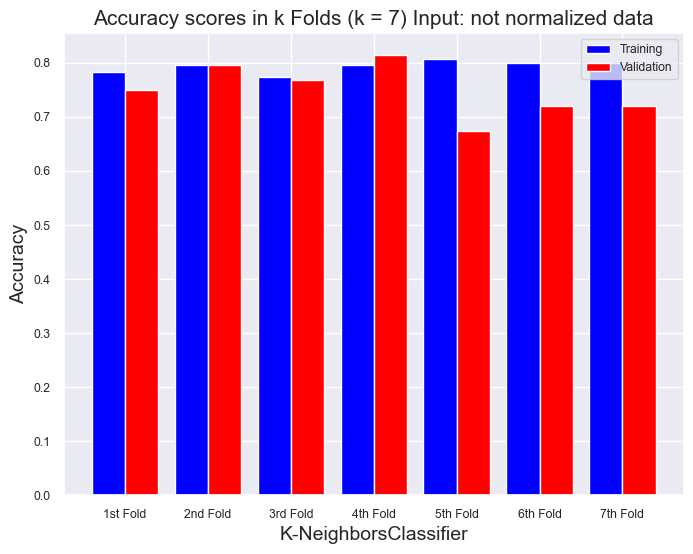

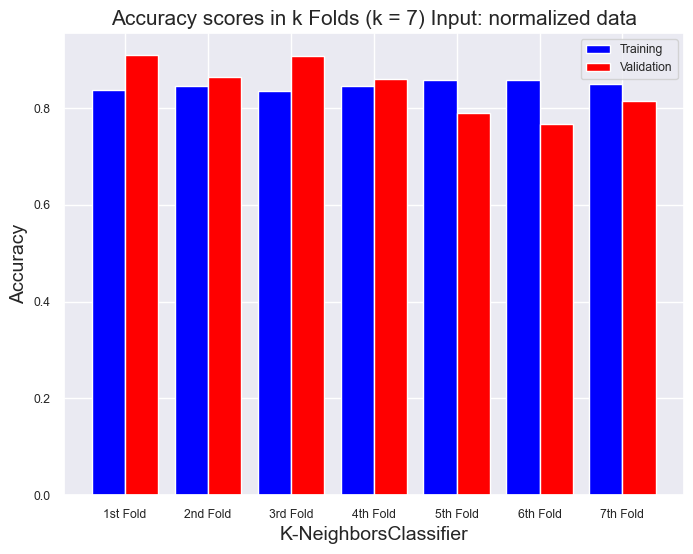

###### Not normalized data in input ######
Max Training Accuracy 80.76923076923077
Max Validation Accuracy 81.3953488372093

###### Normalized data in input ######
Max Training Accuracy 85.76923076923076
Max Validation Accuracy 90.9090909090909

 ######### k-fold Cross Validation - k Tuning #########

###### k = 2 ######
###### Not normalized data in input ######
Max Training Accuracy 77.63157894736842
Max Validation Accuracy 73.68421052631578

###### Normalized data in input ######
Max Training Accuracy 88.81578947368422
Max Validation Accuracy 88.1578947368421

###### k = 3 ######
###### Not normalized data in input ######
Max Training Accuracy 79.70297029702971
Max Validation Accuracy 76.23762376237624

###### Normalized data in input ######
Max Training Accuracy 86.63366336633663
Max Validation Accuracy 85.14851485148515

###### k = 4 ######
###### Not normalized data in input ######
Max Training Accuracy 80.1762114537445
Max Validation Accuracy 80.26315789473685

###### Normalized

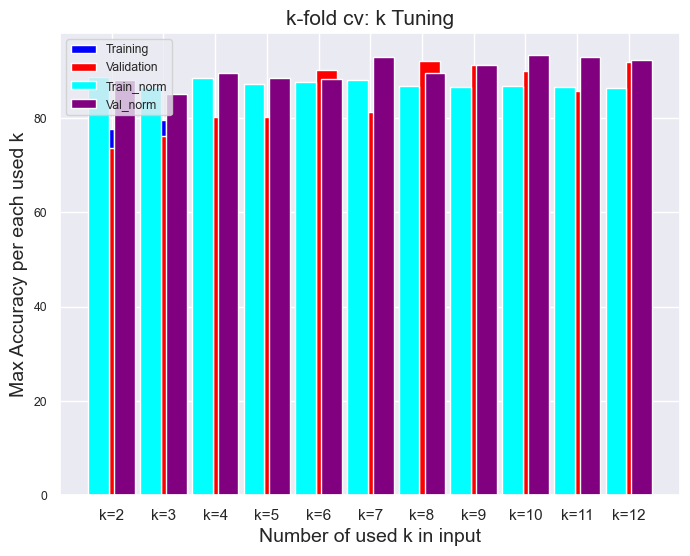

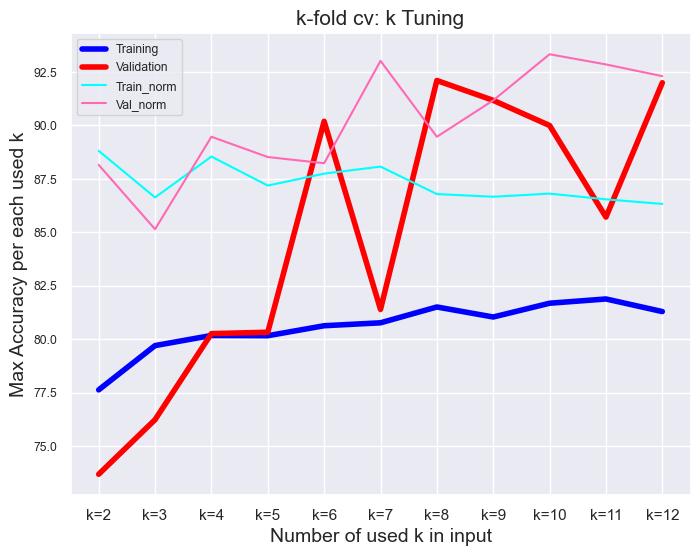

In [57]:
# k-fold cv
# k_folds = 7
# X_norm = X

# training-test split case 
# The custom function cross_validation dosen't work properly with training-validation-test split case;
# So also LDA feature selection in preprocessing step cannot be done because it need train and test dataset.
_result = cross_validation(knn, X, y, k_folds) # custom function that contains scklearn function cross_validate
_result_norm = cross_validation(knn, X_norm, y, k_folds) # custom function that contains scklearn function cross_validate

# print(_result)

# Plot Accuracy Result - not normalized
model_name = model_knn
plot_result(model_name,
            "Accuracy",
            "Accuracy scores in k Folds (k = " + str(k_folds) + ") Input: not normalized data",
            _result["Training Accuracy scores"],
            _result["Validation Accuracy scores"],
           k_folds)

# Plot Accuracy Result - normalized data
plot_result(model_name,
            "Accuracy",
            "Accuracy scores in k Folds (k = " + str(k_folds) + ") Input: normalized data",
            _result_norm["Training Accuracy scores"],
            _result_norm["Validation Accuracy scores"],
           k_folds)

print("###### Not normalized data in input ######")
print("Max Training Accuracy", _result['Max Training Accuracy'])
print("Max Validation Accuracy", _result['Max Validation Accuracy'])

print("\n###### Normalized data in input ######")
print("Max Training Accuracy", _result_norm['Max Training Accuracy'])
print("Max Validation Accuracy", _result_norm['Max Validation Accuracy'])

# k - tuning        
# k_iterations = 15       
max_k_fold_val_acc_knn, k_knn_max, max_k_fold_val_acc_knn_norm, k_knn_norm_max = k_fold_cv_tuning(knn, X, y, k_iterations)


### K-NN Validation: Training/Test one 80/20% and one 90/10%

In [58]:
# K-NN
print("######## Training/test = 80/20% ########")
# model_knn = 'K-NeighborsClassifier'
# knn = KNeighborsClassifier(n_neighbors=8)
knn_predicted, knn_conf_matrix, knn_acc_score = model_classifier(knn, X_train, X_test, y_train, y_test)
print_score(model_knn, knn_predicted, knn_conf_matrix, knn_acc_score, y_test)
# y_proba = knn.predict_proba(X_test) # array with col = to number of different classes (in this case Target=5)
#                                     # each value is the probabily of X_test instances to enter in that class 
# print(y_proba)

print("######## Training/test = 90/10% ########")
knn_predicted2, knn_conf_matrix2, knn_acc_score2 = model_classifier(knn, X_train2, X_test2, y_train2, y_test2)
print_score(model_knn, knn_predicted2, knn_conf_matrix2, knn_acc_score2, y_test2)

print("######## Training/test = 80/20%, Normalized data ########")
# model_knn = 'K-NeighborsClassifier'
knn = KNeighborsClassifier(n_neighbors=8)
knn_predicted_norm, knn_conf_matrix_norm, knn_acc_score_norm = model_classifier(knn, X_train_norm, X_test_norm,
                                                                                y_train_norm, y_test_norm)
print_score(model_knn, knn_predicted_norm, knn_conf_matrix_norm, knn_acc_score_norm, y_test_norm)

print("----------------")
rmse_comparison(knn_predicted, knn_predicted_norm, y_test, y_test_norm)

print("######## Training/test = 90/10%, Normalized data ########")
knn_predicted_norm2, knn_conf_matrix_norm2, knn_acc_score_norm2 = model_classifier(knn, X_train_norm2, X_test_norm2,
                                                                                   y_train_norm2, y_test_norm2)
print_score(model_knn, knn_predicted_norm2, knn_conf_matrix_norm2, knn_acc_score_norm2, y_test_norm2)

print("----------------")
rmse_comparison(knn_predicted2, knn_predicted_norm2, y_test2, y_test_norm2)


######## Training/test = 80/20% ########
Confusion matrix
[[28  7]
 [14 12]]
-------------------------------------------
Accuracy of K-NeighborsClassifier: 65.57377049180327 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.67      0.80      0.73        35
           1       0.63      0.46      0.53        26

    accuracy                           0.66        61
   macro avg       0.65      0.63      0.63        61
weighted avg       0.65      0.66      0.64        61

######## Training/test = 90/10% ########
Confusion matrix
[[14  2]
 [ 6  9]]
-------------------------------------------
Accuracy of K-NeighborsClassifier: 74.19354838709677 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.88      0.78        16
           1       0.82      0.60      0.69        15

    accuracy                           0.74        31
   macro avg   

### K-NN - Hyperparameters Tuning without GridSearchCV

######## Training/test = 80/20% ########


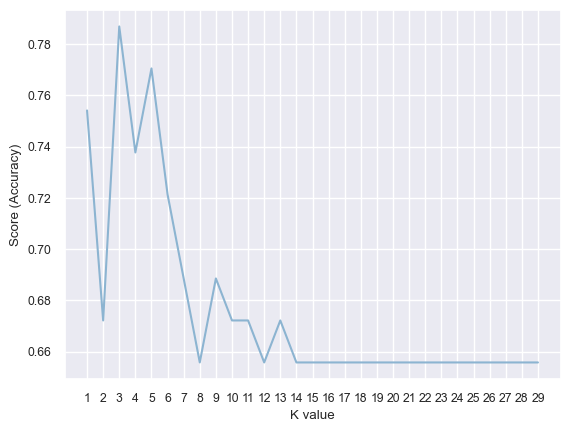

Maximum KNN Score is 78.69%

######## Training/test = 90/10% ########


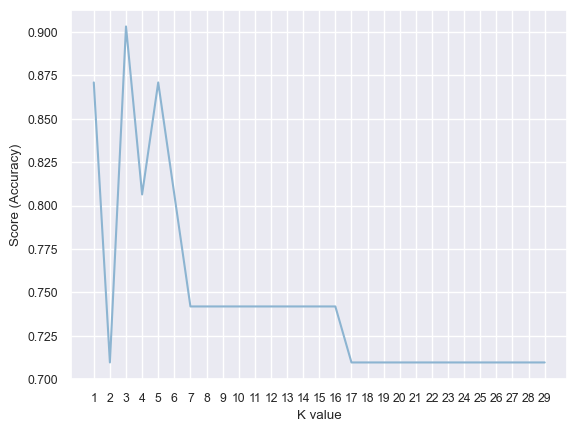

Maximum KNN Score is 90.32%
######## Training/test = 80/20%, Normalized data ########


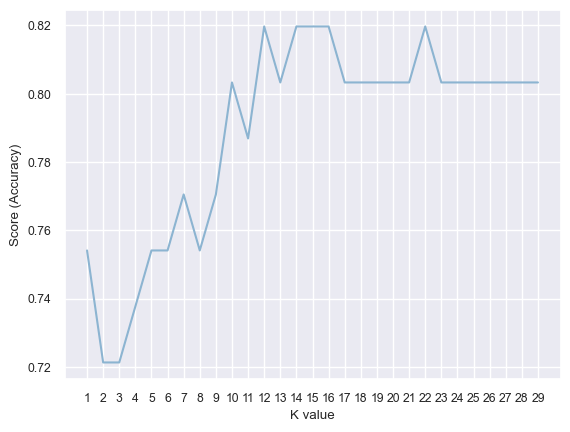

Maximum KNN Score is 81.97%
######## Training/test = 90/10%, Normalized data ########


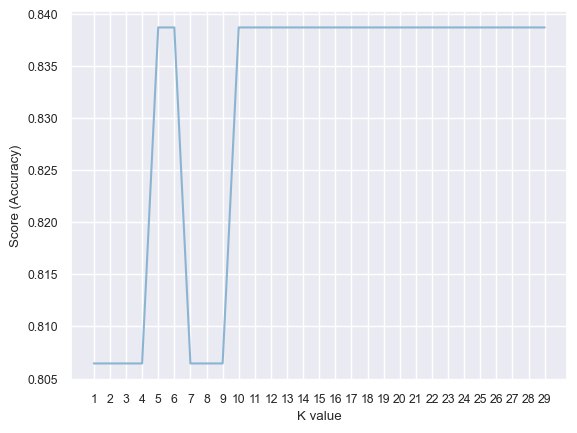

Maximum KNN Score is 83.87%


In [59]:
# try ro find best k value
scoreList = []
scoreList2 = []
scoreList3 = []
scoreList4 = []
maxRange = 30 # tested values: 20, 30, 50 and 100 (acc increased after 50) (Expected n_neighbors <= n_samples, so max 242)

print("######## Training/test = 80/20% ########")
for i in range(1,maxRange):
    knn2 = KNeighborsClassifier(n_neighbors = i)  # n_neighbors means k
    knn_predicted2, knn_conf_matrix2, knn_acc_score2 = model_classifier(knn2, X_train, X_test, y_train, y_test)
    scoreList.append(knn2.score(X_test, y_test))
    
plt.plot(range(1,maxRange), scoreList)
plt.xticks(np.arange(1,maxRange,1))
plt.xlabel("K value")
plt.ylabel("Score (Accuracy)")
plt.show()

acc = max(scoreList)*100
accuracies['KNN-80/20'] = acc
print("Maximum KNN Score is {:.2f}%".format(acc))

print("\n######## Training/test = 90/10% ########")
for i in range(1,maxRange):
    knn3 = KNeighborsClassifier(n_neighbors = i)  # n_neighbors means k
    knn_predicted3, knn_conf_matrix3, knn_acc_score3 = model_classifier(knn3, X_train2, X_test2, y_train2, y_test2)
    scoreList2.append(knn3.score(X_test2, y_test2))
    
plt.plot(range(1,maxRange), scoreList2)
plt.xticks(np.arange(1,maxRange,1))
plt.xlabel("K value")
plt.ylabel("Score (Accuracy)")
plt.show()

acc2 = max(scoreList2)*100
accuracies['KNN-90/10'] = acc2
print("Maximum KNN Score is {:.2f}%".format(acc2))

print("######## Training/test = 80/20%, Normalized data ########")
for i in range(1,maxRange):
    knn4 = KNeighborsClassifier(n_neighbors = i)  # n_neighbors means k
    knn_predicted4, knn_conf_matrix4, knn_acc_score4 = model_classifier(knn4, X_train_norm, X_test_norm,
                                                                        y_train_norm, y_test_norm)
    scoreList3.append(knn4.score(X_test_norm, y_test_norm))
    
plt.plot(range(1,maxRange), scoreList3)
plt.xticks(np.arange(1,maxRange,1))
plt.xlabel("K value")
plt.ylabel("Score (Accuracy)")
plt.show()

acc3 = max(scoreList3)*100
accuracies['KNN-80/20'] = acc3
print("Maximum KNN Score is {:.2f}%".format(acc3))

print("######## Training/test = 90/10%, Normalized data ########")
for i in range(1,maxRange):
    knn5 = KNeighborsClassifier(n_neighbors = i)  # n_neighbors means k
    knn_predicted5, knn_conf_matrix5, knn_acc_score5 = model_classifier(knn5, X_train_norm2, X_test_norm2,
                                                                        y_train_norm2, y_test_norm2)
    scoreList4.append(knn5.score(X_test_norm2, y_test_norm2))
    
plt.plot(range(1,maxRange), scoreList4)
plt.xticks(np.arange(1,maxRange,1))
plt.xlabel("K value")
plt.ylabel("Score (Accuracy)")
plt.show()

acc4 = max(scoreList4)*100
accuracies['KNN-90/10'] = acc4
print("Maximum KNN Score is {:.2f}%".format(acc4))


### K-NN - Hyperparameters Tuning with GridSearchCV

In [60]:
def gridsearch_knn_tuning(knn, X_train, y_train, X_test, y_test):
    model_knn = 'K-NeighborsClassifier'
    # Definition of k-values that have to be tested
    param_grid = {'n_neighbors': [ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
           18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29]}

    # Esecution of GridSearchCV for hyperparameter tuning
    grid_search_knn = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
    grid_search_knn.fit(X_train, y_train)

    # best hyperparameter
    best_params_knn = grid_search_knn.best_params_

    # Training of classifier with best parameters
    best_knn = KNeighborsClassifier(n_neighbors=best_params_knn['n_neighbors'])
    best_knn.fit(X_train, y_train)

    # Evaluation of optimazed model
    accuracy_knn = best_knn.score(X_test, y_test)
    print("Best hyperparameter for k-NN: ", best_knn)
    print("Accuracy " + model_knn + ":", accuracy_knn)
    return best_knn
    

In [61]:
print("######## Training/test = 80/20% ########")
best_knn = gridsearch_knn_tuning(knn, X_train, y_train, X_test, y_test)

print("\n######## Training/test = 90/10% ########")
best_knn = gridsearch_knn_tuning(knn, X_train2, y_train2, X_test2, y_test2)

print("\n######## Training/test = 80/20%, Normalized data ########")
best_knn = gridsearch_knn_tuning(knn, X_train_norm, y_train_norm, X_test_norm, y_test_norm)

print("\n######## Training/test = 90/10%, Normalized data ########")
best_knn = gridsearch_knn_tuning(knn, X_train_norm2, y_train_norm2, X_test_norm2, y_test_norm2)


######## Training/test = 80/20% ########
Best hyperparameter for k-NN:  KNeighborsClassifier(n_neighbors=3)
Accuracy K-NeighborsClassifier: 0.7868852459016393

######## Training/test = 90/10% ########
Best hyperparameter for k-NN:  KNeighborsClassifier()
Accuracy K-NeighborsClassifier: 0.8709677419354839

######## Training/test = 80/20%, Normalized data ########
Best hyperparameter for k-NN:  KNeighborsClassifier(n_neighbors=11)
Accuracy K-NeighborsClassifier: 0.7868852459016393

######## Training/test = 90/10%, Normalized data ########
Best hyperparameter for k-NN:  KNeighborsClassifier(n_neighbors=25)
Accuracy K-NeighborsClassifier: 0.8387096774193549


### K-NN - Hyperparameters Tuning with RandomizedSearchCV

In [62]:
# Dictionary of hyperparameter for KNN Classifier
knn_params = {
    'n_neighbors': [1, 3, 5, 7, 9, 11, 13, 15],  # Esempi di valori da provare, puoi aggiungere altri valori a seconda delle tue esigenze
    'weights': ['uniform', 'distance'],
    'p': [1, 2],
}

# RandomizedSearchCV for KNN Classifier
knn_model = KNeighborsClassifier()
knn_random = RandomizedSearchCV(knn_model, knn_params, n_iter=10, cv=5, random_state=42)
knn_random.fit(X_train_norm, y_train_norm)
knn_model = knn_random.best_estimator_
print("Best Parameter for k-NN: ", knn_random.best_estimator_)

# Re-assign of variable
knn = knn_model
# knn = best_knn # doesn't work

# K-NN
print("######## Training/test = 80/20% ########")
# model_knn = 'K-NeighborsClassifier'
# knn = KNeighborsClassifier(n_neighbors=8)
knn_predicted, knn_conf_matrix, knn_acc_score = model_classifier(knn, X_train, X_test, y_train, y_test)
print_score(model_knn, knn_predicted, knn_conf_matrix, knn_acc_score, y_test)
# y_proba = knn.predict_proba(X_test) # array with col = to number of different classes (in this case Target=5)
#                                     # each value is the probabily of X_test instances to enter in that class 
# print(y_proba)

print("######## Training/test = 90/10% ########")
knn_predicted2, knn_conf_matrix2, knn_acc_score2 = model_classifier(knn, X_train2, X_test2, y_train2, y_test2)
print_score(model_knn, knn_predicted2, knn_conf_matrix2, knn_acc_score2, y_test2)

print("######## Training/test = 80/20%, Normalized data ########")
# model_knn = 'K-NeighborsClassifier'
knn = KNeighborsClassifier(n_neighbors=8)
knn_predicted_norm, knn_conf_matrix_norm, knn_acc_score_norm = model_classifier(knn, X_train_norm, X_test_norm,
                                                                                y_train_norm, y_test_norm)
print_score(model_knn, knn_predicted_norm, knn_conf_matrix_norm, knn_acc_score_norm, y_test_norm)

print("----------------")
rmse_comparison(knn_predicted, knn_predicted_norm, y_test, y_test_norm)

print("######## Training/test = 90/10%, Normalized data ########")
knn_predicted_norm2, knn_conf_matrix_norm2, knn_acc_score_norm2 = model_classifier(knn, X_train_norm2, X_test_norm2,
                                                                                   y_train_norm2, y_test_norm2)
print_score(model_knn, knn_predicted_norm2, knn_conf_matrix_norm2, knn_acc_score_norm2, y_test_norm2)

print("----------------")
rmse_comparison(knn_predicted2, knn_predicted_norm2, y_test2, y_test_norm2)


Best Parameter for k-NN:  KNeighborsClassifier(n_neighbors=13, p=1)
######## Training/test = 80/20% ########
Confusion matrix
[[29  6]
 [12 14]]
-------------------------------------------
Accuracy of K-NeighborsClassifier: 70.49180327868852 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.71      0.83      0.76        35
           1       0.70      0.54      0.61        26

    accuracy                           0.70        61
   macro avg       0.70      0.68      0.69        61
weighted avg       0.70      0.70      0.70        61

######## Training/test = 90/10% ########
Confusion matrix
[[13  3]
 [ 4 11]]
-------------------------------------------
Accuracy of K-NeighborsClassifier: 77.41935483870968 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.76      0.81      0.79        16
           1       0.79      0.73      0.76        15

 

### K-NN: ROC Curve and F1 score (only for normalized data)

In [63]:
def roc_curve_storage(lb, y_test_bin, y_probabilities):
    # Calculate ROC curve and ROC AUC score for each class
    fpr_model = dict()
    tpr_model = dict()
    thresholds = dict()
    roc_auc_model = dict()
    for i in range(len(lb.classes_)):
    #     fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_probabilities[:, i])
    #     roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_probabilities[:, i])
        fpr_model[i], tpr_model[i], thresholds = roc_curve(y_test_bin[:, 0], y_probabilities[:, i])
        roc_auc_model[i] = roc_auc_score(y_test_bin[:, 0], y_probabilities[:, i])
        
    return fpr_model, tpr_model, roc_auc_model


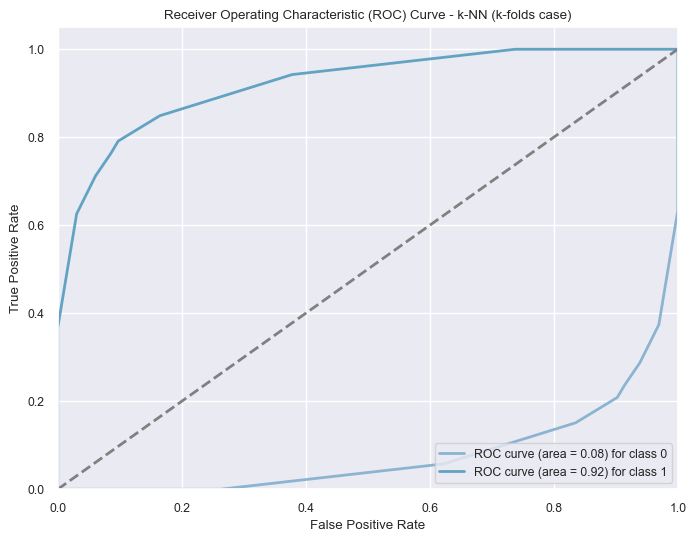

Average ROC AUC score: 0.5
Micro-average F1 score: 0.8448844884488449


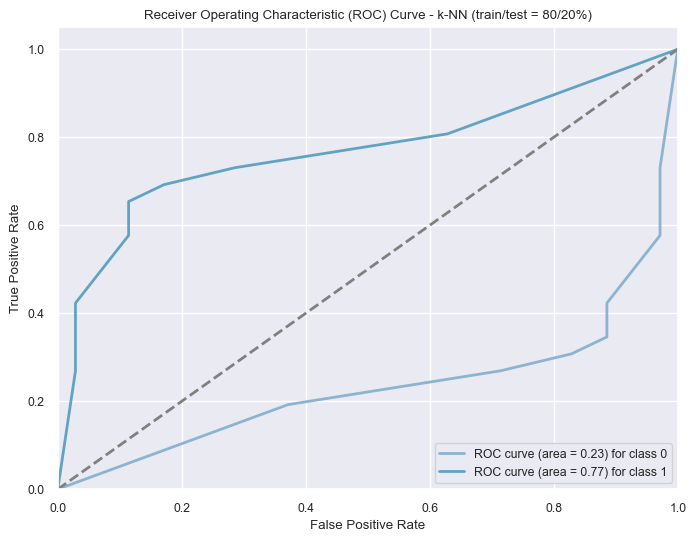

Average ROC AUC score: 0.5000000000000001
Micro-average F1 score: 0.7540983606557377


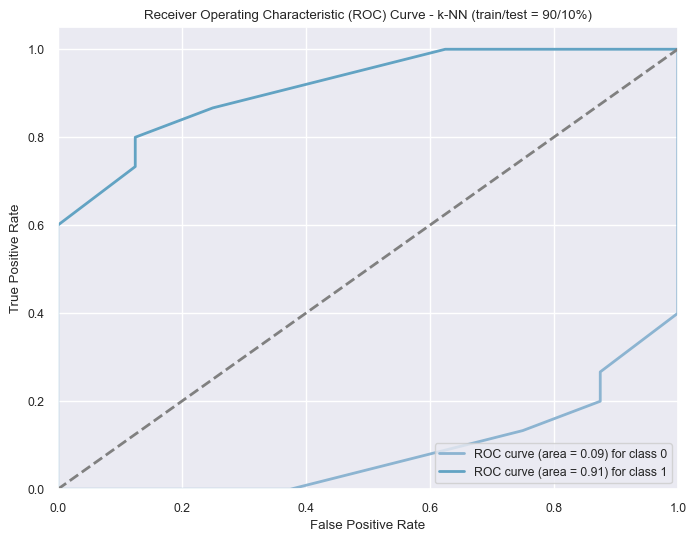

Average ROC AUC score: 0.5
Micro-average F1 score: 0.8064516129032258


In [64]:
# # Data loading
# data = pd.read_csv('Correct_Dataset.csv')

# # Encoding
# ordinal_cols = ["Major_Vessels", "Thalessemia"]
# ordinal_encoder = OrdinalEncoder()
# data[ordinal_cols] = ordinal_encoder.fit_transform(data[ordinal_cols])

# # Split of dataset features and target (class label)
# y = data["Target"]
# X = data.drop('Target', axis=1)

# # Split data into training and test sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# # Define the K-NN model
# knn = KNeighborsClassifier(n_neighbors=5)

# # Standardize the features
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)

# k-folds
# Train the model
knn.fit(X_norm, y)

# Convert the multiclass labels to binary format (one-vs-rest)
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y)
# y_test_bin[:,0] use this to plot roc curve

# Predict the probabilities for ROC curve
y_probabilities = knn.predict_proba(X_norm)

# Calculate ROC curve and ROC AUC score for each class
fpr = dict()
tpr = dict()
thresholds = dict()
roc_auc = dict()
for i in range(len(lb.classes_)):
#     fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_probabilities[:, i])
#     roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_probabilities[:, i])
    fpr[i], tpr[i], thresholds = roc_curve(y_test_bin[:, 0], y_probabilities[:, i])
    roc_auc[i] = roc_auc_score(y_test_bin[:, 0], y_probabilities[:, i])
    
fpr_0, tpr_0, thresholds = roc_curve(y_test_bin[:, 0], y_probabilities[:, 0])
roc_auc_0 = roc_auc_score(y_test_bin[:, 0], y_probabilities[:, 0])

fpr_kf_knn, tpr_kf_knn, roc_auc_kf_knn = roc_curve_storage(lb, y_test_bin, y_probabilities)

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(lb.classes_)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {lb.classes_[i]}')

# plt.plot(tpr_0, fpr_0, lw=2, label=f'ROC curve (area = {roc_auc_0:.2f}) for class {lb.classes_[0]}') # 
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - k-NN (k-folds case)')
plt.legend(loc="lower right")
plt.show()

# Print average ROC AUC score
print("Average ROC AUC score:", np.mean(list(roc_auc.values())))

# Convert the multiclass labels to binary format (one-vs-rest)
y_pred_bin = lb.transform(knn.predict(X_norm))

# Calculate micro-average F1 score
f1_micro = f1_score(y_test_bin, y_pred_bin, average='micro')

# Print micro-average F1 score
print("Micro-average F1 score:", f1_micro)


# 80/20
# Train the model
knn.fit(X_train_norm, y_train_norm)

# Convert the multiclass labels to binary format (one-vs-rest)
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y_test_norm)

# Predict the probabilities for ROC curve
y_probabilities = knn.predict_proba(X_test_norm)

# Calculate ROC curve and ROC AUC score for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(lb.classes_)):
#     fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_probabilities[:, i])
#     roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_probabilities[:, i])
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, 0], y_probabilities[:, i])
    roc_auc[i] = roc_auc_score(y_test_bin[:, 0], y_probabilities[:, i])

fpr_80_20_knn, tpr_80_20_knn, roc_auc_80_20_knn = roc_curve_storage(lb, y_test_bin, y_probabilities)

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(lb.classes_)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {lb.classes_[i]}')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - k-NN (train/test = 80/20%)')
plt.legend(loc="lower right")
plt.show()

# Print average ROC AUC score
print("Average ROC AUC score:", np.mean(list(roc_auc.values())))

# Convert the multiclass labels to binary format (one-vs-rest)
y_pred_bin = lb.transform(knn.predict(X_test_norm))

# Calculate micro-average F1 score
f1_micro = f1_score(y_test_bin, y_pred_bin, average='micro')

# Print micro-average F1 score
print("Micro-average F1 score:", f1_micro)

# 90/10
# Train the model
knn.fit(X_train_norm2, y_train_norm2)

# Convert the multiclass labels to binary format (one-vs-rest)
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y_test_norm2)

# Predict the probabilities for ROC curve
y_probabilities = knn.predict_proba(X_test_norm2)

# Calculate ROC curve and ROC AUC score for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(len(lb.classes_)):
#     fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_probabilities[:, i])
#     roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_probabilities[:, i])
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, 0], y_probabilities[:, i])
    roc_auc[i] = roc_auc_score(y_test_bin[:, 0], y_probabilities[:, i])

fpr_90_10_knn, tpr_90_10_knn, roc_auc_90_10_knn = roc_curve_storage(lb, y_test_bin, y_probabilities)

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(lb.classes_)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {lb.classes_[i]}')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - k-NN (train/test = 90/10%)')
plt.legend(loc="lower right")
plt.show()

# Print average ROC AUC score
print("Average ROC AUC score:", np.mean(list(roc_auc.values())))

# Convert the multiclass labels to binary format (one-vs-rest)
y_pred_bin = lb.transform(knn.predict(X_test_norm2))

# Calculate micro-average F1 score
f1_micro = f1_score(y_test_bin, y_pred_bin, average='micro')

# Print micro-average F1 score
print("Micro-average F1 score:", f1_micro)


### K-NN: Scores Biplot

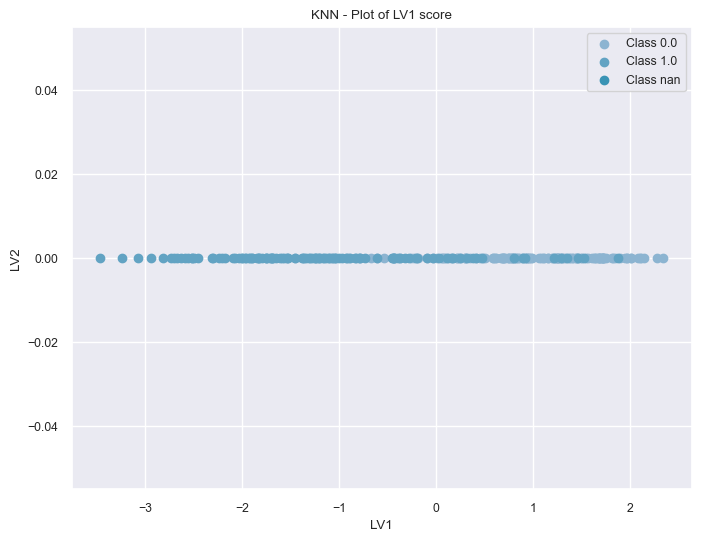

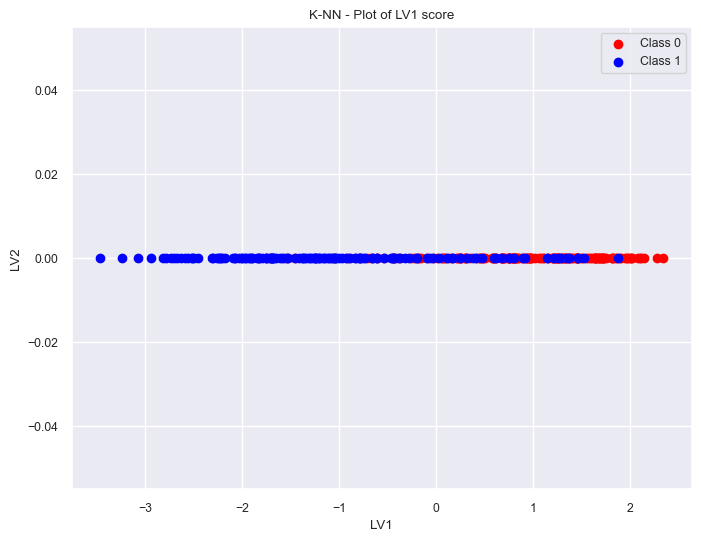

In [65]:
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

# Perform LDA transformation to get scores of the first principal component
lda = LDA(n_components=1)
X_train_lda = lda.fit_transform(X_norm, y)

# Create a DataFrame with the score and class labels
df_scores = pd.DataFrame(data=X_train_lda, columns=['LV1'])
df_scores['Target'] = y_train_norm

# Plot the LV1 score with different colors for each class
plt.figure(figsize=(8, 6))
targets = df_scores['Target'].unique()
for target in targets:
    plt.scatter(df_scores[df_scores['Target'] == target]['LV1'],
                np.zeros_like(df_scores[df_scores['Target'] == target]['LV1']), # Create a column of zeros for LV2
                label=f'Class {target}')
plt.xlabel('LV1')
plt.ylabel('LV2')
plt.title('KNN - Plot of LV1 score')
plt.legend()
plt.grid(True)
plt.show()

# Define colors based on class labels
colors = ["red", "blue", "green"]  # Add more colors as needed for each class

# Perform LDA transformation to get scores of the first principal component
lda = LDA(n_components=1)
X_train_lda = lda.fit_transform(X_norm, y)

# Create a DataFrame with the score and class labels
df_scores = pd.DataFrame(data=X_train_lda, columns=['LV1'])
df_scores['Target'] = y

# Map the colors to the class labels
colorlist = [colors[label] for label in y]

# Plot the LV1 score with different colors for each class
plt.figure(figsize=(8, 6))
targets = df_scores['Target'].unique()
for target in targets:
    plt.scatter(df_scores[df_scores['Target'] == target]['LV1'],
                np.zeros_like(df_scores[df_scores['Target'] == target]['LV1']), # Create a column of zeros for LV2
                c=colors[target], # Use the color mapping
                label=f'Class {target}')
plt.xlabel('LV1')
plt.ylabel('LV2')
plt.title('K-NN - Plot of LV1 score')
plt.legend()
plt.grid(True)
plt.show()



## Linear Discriminant Analysis (LDA)

### Create the model

In [66]:
model_lda = 'LinearDiscriminantAnalysis'
lda = LinearDiscriminantAnalysis(solver='svd', n_components=1) # n_components cannot be larger than min(n_features, n_classes - 1)


### LDA Validation: k-fold cross validation and tuning of k-folds

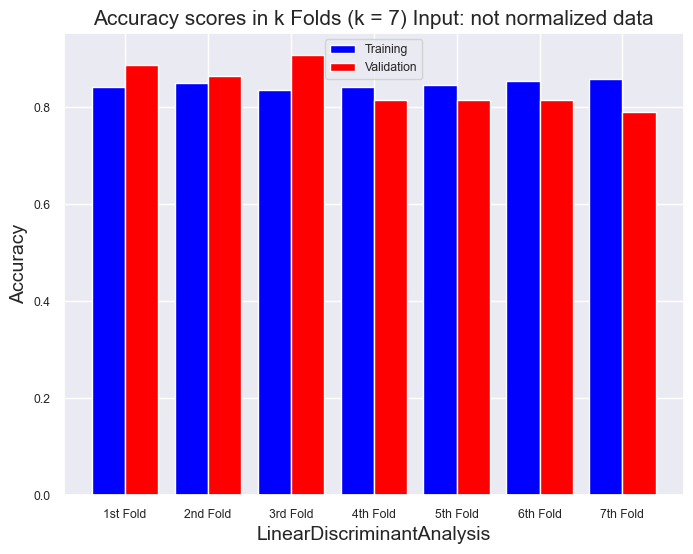

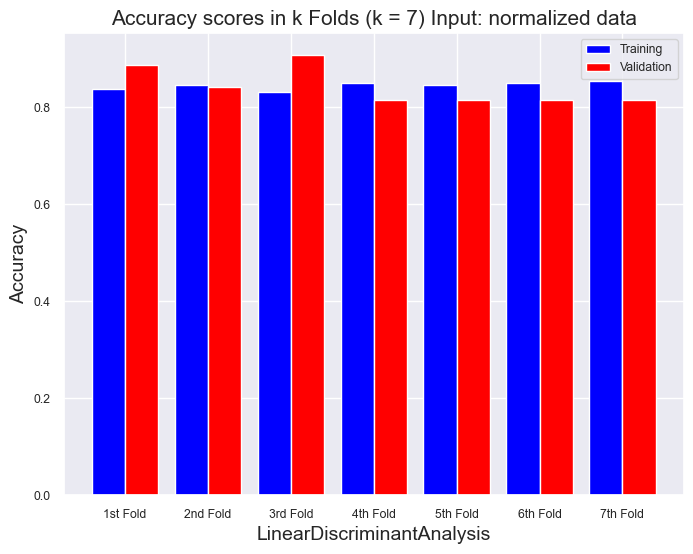

###### Not normalized data in input ######
Max Training Accuracy 85.76923076923076
Max Validation Accuracy 90.69767441860465

###### Normalized data in input ######
Max Training Accuracy 85.38461538461539
Max Validation Accuracy 90.69767441860465

 ######### k-fold Cross Validation - k Tuning #########

###### k = 2 ######
###### Not normalized data in input ######
Max Training Accuracy 88.1578947368421
Max Validation Accuracy 86.18421052631578

###### Normalized data in input ######
Max Training Accuracy 88.1578947368421
Max Validation Accuracy 86.18421052631578

###### k = 3 ######
###### Not normalized data in input ######
Max Training Accuracy 86.63366336633663
Max Validation Accuracy 87.12871287128714

###### Normalized data in input ######
Max Training Accuracy 86.63366336633663
Max Validation Accuracy 87.12871287128714

###### k = 4 ######
###### Not normalized data in input ######
Max Training Accuracy 86.40350877192982
Max Validation Accuracy 88.1578947368421

###### Normalize

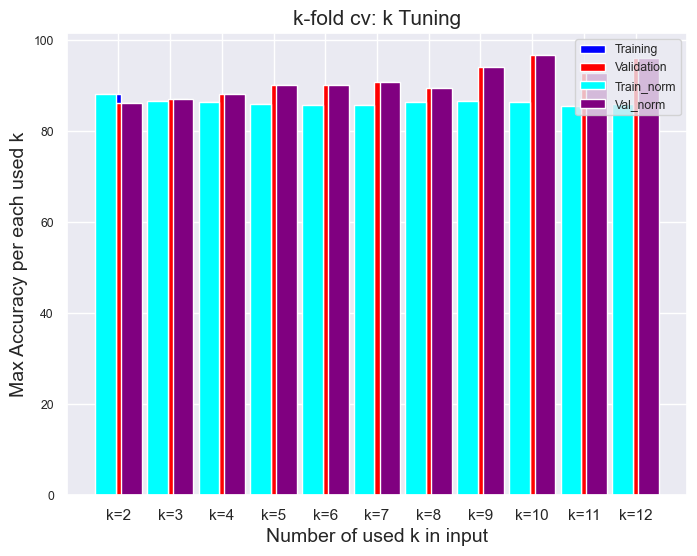

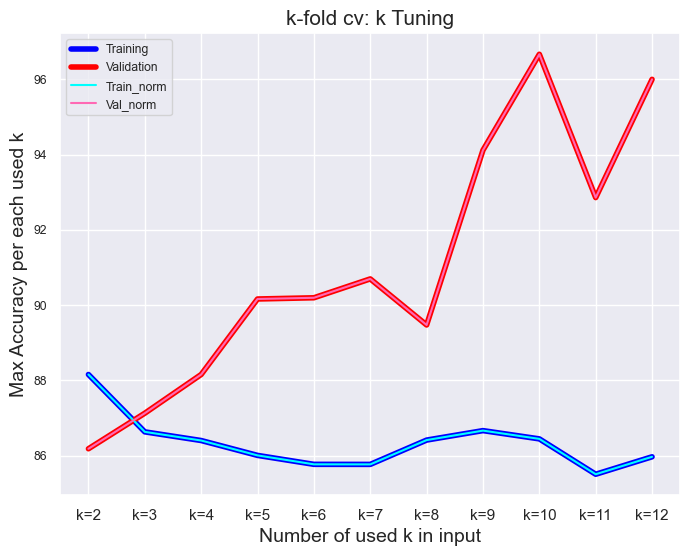

In [67]:
# k_folds = 7
_result = cross_validation(lda, X, y, k_folds) # custom function that contains scklearn function cross_validate
_result_norm = cross_validation(lda, X_norm, y, k_folds) # custom function that contains scklearn function cross_validate

# print(_result)

# Plot Accuracy Result - not normalized
model_name = model_lda
plot_result(model_name,
            "Accuracy",
            "Accuracy scores in k Folds (k = " + str(k_folds) + ") Input: not normalized data",
            _result["Training Accuracy scores"],
            _result["Validation Accuracy scores"],
           k_folds)

# Plot Accuracy Result - normalized data
plot_result(model_name,
            "Accuracy",
            "Accuracy scores in k Folds (k = " + str(k_folds) + ") Input: normalized data",
            _result_norm["Training Accuracy scores"],
            _result_norm["Validation Accuracy scores"],
           k_folds)

print("###### Not normalized data in input ######")
print("Max Training Accuracy", _result['Max Training Accuracy'])
print("Max Validation Accuracy", _result['Max Validation Accuracy'])

print("\n###### Normalized data in input ######")
print("Max Training Accuracy", _result_norm['Max Training Accuracy'])
print("Max Validation Accuracy", _result_norm['Max Validation Accuracy'])

# k - tuning        
# k_iterations = 15       
max_k_fold_val_acc_lda, k_lda_max, max_k_fold_val_acc_lda_norm, k_lda_norm_max = k_fold_cv_tuning(lda, X, y, k_iterations)


### LDA Validation: Training/Test one 80/20% and one 90/10%

In [68]:
print("######## Training/test = 80/20% ########")
# model_lda = 'LinearDiscriminantAnalysis'
# lda = LinearDiscriminantAnalysis(solver='svd', n_components=2) # n_components cannot be larger than min(n_features, n_classes - 1)
lda_predicted, lda_conf_matrix, lda_acc_score = model_classifier(lda, X_train, X_test, y_train, y_test)
print_score(model_lda, lda_predicted, lda_conf_matrix, lda_acc_score, y_test)

print("\n######## Training/test = 90/10% ########")
lda_predicted2, lda_conf_matrix2, lda_acc_score2 = model_classifier(lda, X_train2, X_test2, y_train2, y_test2)
print_score(model_lda, lda_predicted2, lda_conf_matrix2, lda_acc_score2, y_test2)

print("######## Training/test = 80/20%, Normalized data ########")
lda_predicted_norm, lda_conf_matrix_norm, lda_acc_score_norm = model_classifier(lda, X_train_norm, X_test_norm, 
                                                                                y_train_norm, y_test_norm)
print_score(model_lda, lda_predicted_norm, lda_conf_matrix_norm, lda_acc_score_norm, y_test_norm)

print("######## Training/test = 90/10%, Normalized data ########")
lda_predicted_norm2, lda_conf_matrix_norm2, lda_acc_score_norm2 = model_classifier(lda, X_train_norm2, X_test_norm2, 
                                                                                   y_train_norm2, y_test_norm2)
print_score(model_lda, lda_predicted_norm2, lda_conf_matrix_norm2, lda_acc_score_norm2, y_test_norm2)


######## Training/test = 80/20% ########
Confusion matrix
[[33  2]
 [ 9 17]]
-------------------------------------------
Accuracy of LinearDiscriminantAnalysis: 81.9672131147541 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.79      0.94      0.86        35
           1       0.89      0.65      0.76        26

    accuracy                           0.82        61
   macro avg       0.84      0.80      0.81        61
weighted avg       0.83      0.82      0.81        61


######## Training/test = 90/10% ########
Confusion matrix
[[14  2]
 [ 4 11]]
-------------------------------------------
Accuracy of LinearDiscriminantAnalysis: 80.64516129032258 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.78      0.88      0.82        16
           1       0.85      0.73      0.79        15

    accuracy                           0.81        31
   ma

### LDA - Hyperparameters Tuning with GridSearchCV

In [69]:
# Define the LDA model
# lda = LinearDiscriminantAnalysis()

# Define a hyperparameter grid to test
param_grid = {
    'n_components': [1, 2, 3, 4, 5],  # Try different values for the number of components
    'shrinkage': ['auto', None, 0.1, 0.2, 0.3]  # Try different options for shrinkage
}

# Perform k-fold cross-validation with GridSearchCV to find the best combination of hyperparameters
grid_search = GridSearchCV(lda, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_norm, y_train_norm)

# Display the tuning results
print("Best hyperparameter combination:")
print(grid_search.best_params_)
print("Best accuracy during k-fold cross-validation:")
print(grid_search.best_score_)

# Train the model with the best hyperparameters found
best_lda = grid_search.best_estimator_
best_lda.fit(X_train_norm, y_train_norm)

# Evaluate the model on the test set
accuracy = best_lda.score(X_test_norm, y_test_norm)
print("Accuracy on the test set with the best hyperparameters:", accuracy)


Best hyperparameter combination:
{'n_components': 1, 'shrinkage': None}
Best accuracy during k-fold cross-validation:
0.8555272108843537
Accuracy on the test set with the best hyperparameters: 0.819672131147541


### LDA - Hyperparameters Tuning with RandomizedSearchCV

In [70]:
# Dict. of hyperpar. for LDA Classifier
lda_params = {
    'solver': ['svd', 'lsqr', 'eigen'],
    'shrinkage': [None, 'auto', 0.0, 0.5, 1.0],
}

# RandomizedSearchCV for LDA Classifier
lda_model = LinearDiscriminantAnalysis()
lda_random = RandomizedSearchCV(lda_model, lda_params, n_iter=10, cv=5, random_state=42)
lda_random.fit(X_train_norm, y_train_norm)
lda_model = lda_random.best_estimator_
print("Best Parameter for LDA: ", lda_random.best_estimator_)

# Re-assign of variable
# lda = lda_model


Best Parameter for LDA:  LinearDiscriminantAnalysis(shrinkage=0.5, solver='eigen')


### LDA: ROC Curves and F1 score (only for normalized data)

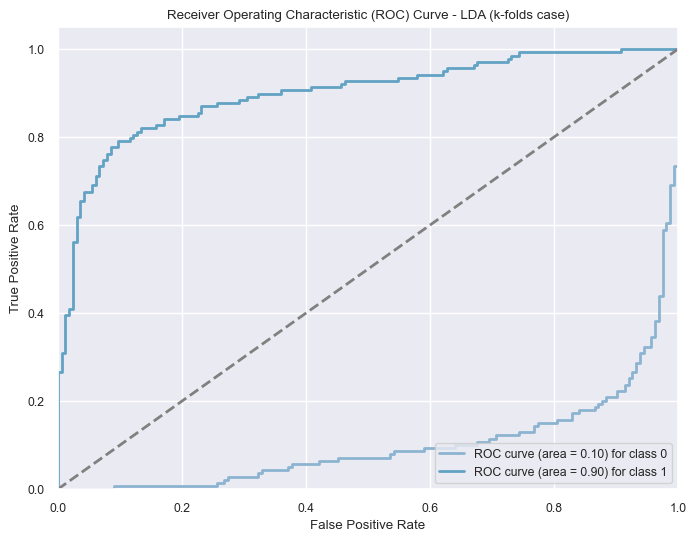

Average ROC AUC score - LDA: 0.5
Micro-average F1 score - LDA: 0.8448844884488449


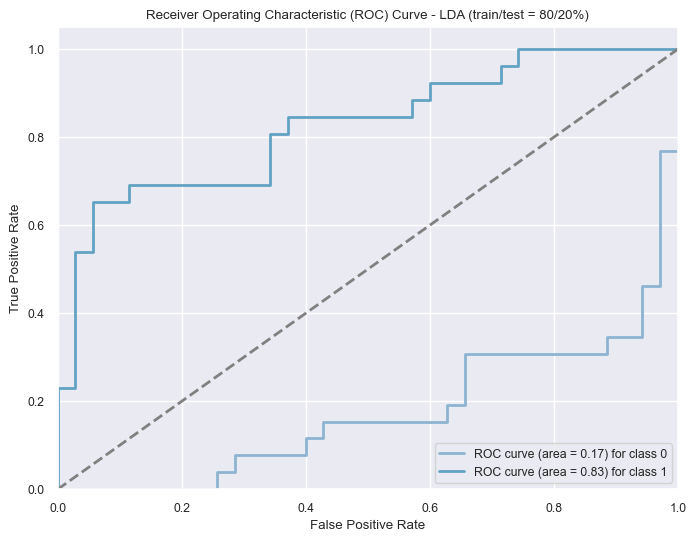

Average ROC AUC score - LDA: 0.5
Micro-average F1 score - LDA: 0.819672131147541


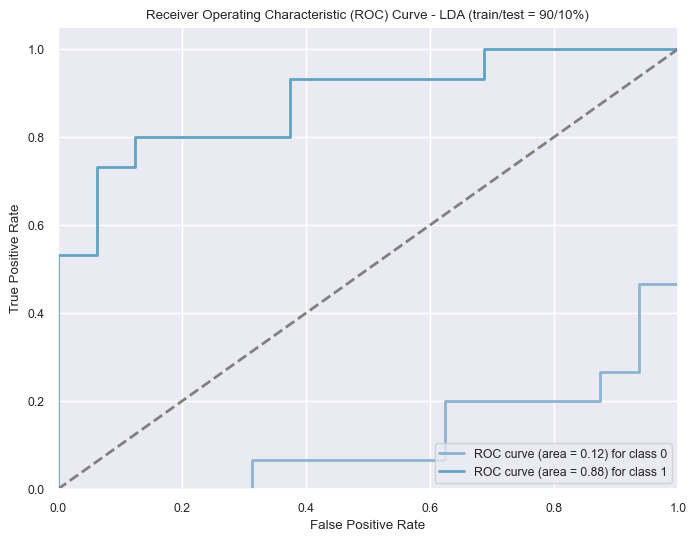

Average ROC AUC score - LDA: 0.5
Micro-average F1 score - LDA: 0.8064516129032258


In [71]:
# # Data loading
# data = pd.read_csv('Correct_Dataset.csv')

# # Encoding
# ordinal_cols = ["Major_Vessels", "Thalessemia"]
# ordinal_encoder = OrdinalEncoder()
# data[ordinal_cols] = ordinal_encoder.fit_transform(data[ordinal_cols])

# # Split of dataset features and target (class label)
# y = data["Target"]
# X = data.drop('Target', axis=1)

# # Split data into training and test sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# # Define the K-NN model
# knn = KNeighborsClassifier(n_neighbors=5)

# # Standardize the features
# scaler = StandardScaler()
# X_train_scaled = scaler.fit_transform(X_train)
# X_test_scaled = scaler.transform(X_test)

# k-fold case
lda.fit(X_norm, y)

# Convert the multiclass labels to binary format (one-vs-rest)
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y)

# Predict the probabilities for ROC curve
y_probabilities_lda = lda.predict_proba(X_norm)

# Calculate ROC curve and ROC AUC score for each class
fpr_lda = dict()
tpr_lda = dict()
roc_auc_lda = dict()
for i in range(len(lb.classes_)):
#     fpr_lda[i], tpr_lda[i], _ = roc_curve(y_test_bin[:, i], y_probabilities_lda[:, i])
#     roc_auc_lda[i] = roc_auc_score(y_test_bin[:, i], y_probabilities_lda[:, i])
    fpr_lda[i], tpr_lda[i], _ = roc_curve(y_test_bin[:, 0], y_probabilities_lda[:, i])
    roc_auc_lda[i] = roc_auc_score(y_test_bin[:, 0], y_probabilities_lda[:, i])

fpr_kf_lda, tpr_kf_lda, roc_auc_kf_lda = roc_curve_storage(lb, y_test_bin, y_probabilities_lda)

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(lb.classes_)):
    plt.plot(fpr_lda[i], tpr_lda[i], lw=2, label=f'ROC curve (area = {roc_auc_lda[i]:.2f}) for class {lb.classes_[i]}')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - LDA (k-folds case)')
plt.legend(loc="lower right")
plt.show()

# Print average ROC AUC score
print("Average ROC AUC score - LDA:", np.mean(list(roc_auc_lda.values())))

# Predict on test set
y_pred_lda = lda.predict(X_norm)

# Calculate micro-average F1 score
f1_micro_lda = f1_score(y, y_pred_lda, average='micro')

# Print micro-average F1 score
print("Micro-average F1 score - LDA:", f1_micro_lda)

# 80/20 case
# Define the LDA model
# lda = LinearDiscriminantAnalysis()

# Train the model
lda.fit(X_train_norm, y_train_norm)

# Convert the multiclass labels to binary format (one-vs-rest)
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y_test_norm)

# Predict the probabilities for ROC curve
y_probabilities_lda = lda.predict_proba(X_test_norm)

# Calculate ROC curve and ROC AUC score for each class
fpr_lda = dict()
tpr_lda = dict()
roc_auc_lda = dict()
for i in range(len(lb.classes_)):
#     fpr_lda[i], tpr_lda[i], _ = roc_curve(y_test_bin[:, i], y_probabilities_lda[:, i])
#     roc_auc_lda[i] = roc_auc_score(y_test_bin[:, i], y_probabilities_lda[:, i])
    fpr_lda[i], tpr_lda[i], _ = roc_curve(y_test_bin[:, 0], y_probabilities_lda[:, i])
    roc_auc_lda[i] = roc_auc_score(y_test_bin[:, 0], y_probabilities_lda[:, i])

fpr_80_20_lda, tpr_80_20_lda, roc_auc_80_20_lda = roc_curve_storage(lb, y_test_bin, y_probabilities_lda)

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(lb.classes_)):
    plt.plot(fpr_lda[i], tpr_lda[i], lw=2, label=f'ROC curve (area = {roc_auc_lda[i]:.2f}) for class {lb.classes_[i]}')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - LDA (train/test = 80/20%)')
plt.legend(loc="lower right")
plt.show()

# Print average ROC AUC score
print("Average ROC AUC score - LDA:", np.mean(list(roc_auc_lda.values())))

# Predict on test set
y_pred_lda = lda.predict(X_test_norm)

# Calculate micro-average F1 score
f1_micro_lda = f1_score(y_test_norm, y_pred_lda, average='micro')

# Print micro-average F1 score
print("Micro-average F1 score - LDA:", f1_micro_lda)

# 90/10 case
lda.fit(X_train_norm2, y_train_norm2)

# Convert the multiclass labels to binary format (one-vs-rest)
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y_test_norm2)

# Predict the probabilities for ROC curve
y_probabilities_lda = lda.predict_proba(X_test_norm2)

# Calculate ROC curve and ROC AUC score for each class
fpr_lda = dict()
tpr_lda = dict()
roc_auc_lda = dict()
for i in range(len(lb.classes_)):
#     fpr_lda[i], tpr_lda[i], _ = roc_curve(y_test_bin[:, i], y_probabilities_lda[:, i])
#     roc_auc_lda[i] = roc_auc_score(y_test_bin[:, i], y_probabilities_lda[:, i])
    fpr_lda[i], tpr_lda[i], _ = roc_curve(y_test_bin[:, 0], y_probabilities_lda[:, i])
    roc_auc_lda[i] = roc_auc_score(y_test_bin[:, 0], y_probabilities_lda[:, i])

fpr_90_10_lda, tpr_90_10_lda, roc_auc_90_10_lda = roc_curve_storage(lb, y_test_bin, y_probabilities_lda)

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(lb.classes_)):
    plt.plot(fpr_lda[i], tpr_lda[i], lw=2, label=f'ROC curve (area = {roc_auc_lda[i]:.2f}) for class {lb.classes_[i]}')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - LDA (train/test = 90/10%)')
plt.legend(loc="lower right")
plt.show()

# Print average ROC AUC score
print("Average ROC AUC score - LDA:", np.mean(list(roc_auc_lda.values())))

# Predict on test set
y_pred_lda = lda.predict(X_test_norm2)

# Calculate micro-average F1 score
f1_micro_lda = f1_score(y_test_norm2, y_pred_lda, average='micro')

# Print micro-average F1 score
print("Micro-average F1 score - LDA:", f1_micro_lda)


## Partial Least Squares (PLS) - Discriminant Analysis (PLS-DA)

### Definition of a function for k-fold in PLS-DA

In [72]:
def stratified_k_fold(k_folds, plsda, X, y):
    # k-fold cv
    skf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=42)
    # evaluation of k-fold cross validation
    y_pred = cross_val_predict(plsda, X, y, cv=skf)
#     y_pred_rounded = y_pred
#     print(y_pred)
    y_pred_rounded = np.where(y_pred < -0.5, 0, y_pred)
    y_pred_rounded = y_pred_rounded.round() # to avoid error in the next row
#     print("after\n", y_pred_rounded)
    # Accuracy
    accuracy = accuracy_score(y, y_pred_rounded) # ValueError: Classification metrics can't handle a 
                                                 # mix of multiclass and continuous target
    print("Accuracy:", accuracy)

    # Confusion matrix
    pls_conf_matrix_kf = confusion_matrix(y, y_pred_rounded)
    print("Confusion matrix")
    print(pls_conf_matrix_kf)
#     pls_conf_matrix_kf = pls_conf_matrix_kf[1:, 1:]
#     print("\nConfusion matrix")
#     print(pls_conf_matrix_kf)

    # report of classification
    class_report = classification_report(y, y_pred_rounded)
    print("\nClassification Report:")
    print(class_report)
    

### Create the model

In [73]:
n_components = 1
model_pls = 'PartialLeastSquaresDiscriminantAnalysis'
# plsda = make_pipeline(StandardScaler(), PLSRegression(n_components=n_components), LinearDiscriminantAnalysis())
plsda = PLSRegression(n_components=n_components, scale=False)



### PLS - DA Validation: k-fold cross validation and tuning of k-folds


In [74]:
# Generator of stratified folds for k-fold cv
# k_folds = 5
stratified_k_fold(k_folds, plsda, X, y) # custom function


Accuracy: 0.693069306930693
Confusion matrix
[[128  36]
 [ 57  82]]

Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.78      0.73       164
           1       0.69      0.59      0.64       139

    accuracy                           0.69       303
   macro avg       0.69      0.69      0.69       303
weighted avg       0.69      0.69      0.69       303




 ######### k-fold Cross Validation - k Tuning #########


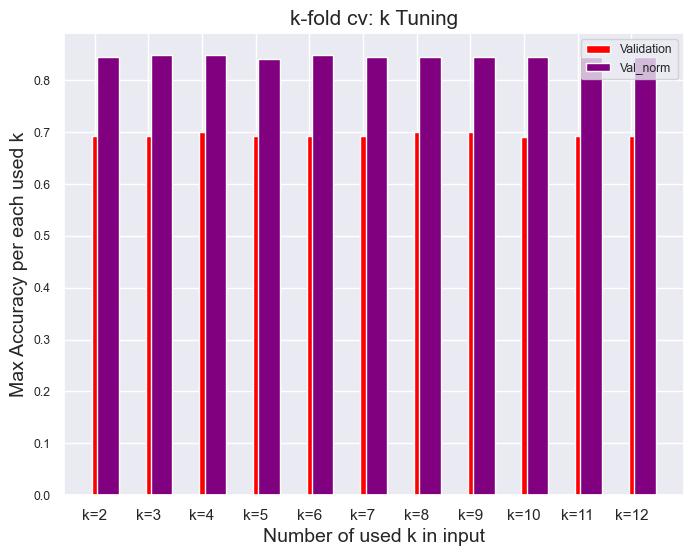

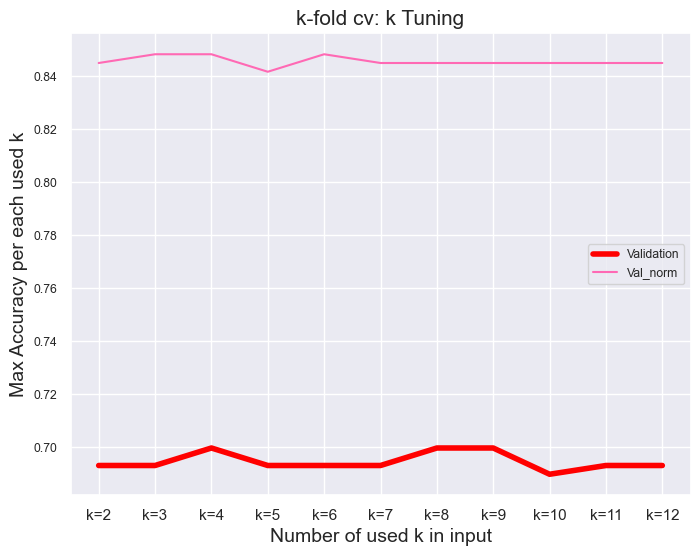

In [75]:
# k-fold tuning
print("\n ######### k-fold Cross Validation - k Tuning #########")
res_acc = []
res_acc_norm = []
labels = []
max_k_fold_val_acc_plsda = 0
max_k_fold_val_acc_plsda_norm = 0


min_k_fold = 2 # minimum k fold is 2

# k_iterations = 15
for k_fold in range(min_k_fold, k_iterations+1):

    labels.append("k="+str(k_fold))
    
    # k-fold cv
    skf = StratifiedKFold(n_splits=k_fold, shuffle=True, random_state=42)
    
    # evaluation of k-fold cross validation
    y_pred = cross_val_predict(plsda, X, y, cv=skf)
    y_pred_norm = cross_val_predict(plsda, X_norm, y, cv=skf)

#     y_pred_rounded = y_pred
    y_pred_rounded = y_pred.round() # to avoid error in the next row
    y_pred_norm_rounded = y_pred_norm.round()
    
    # Accuracy
    accuracy = accuracy_score(y, y_pred_rounded)
    acc_norm = accuracy_score(y, y_pred_norm_rounded)
                                                
    res_acc.append(accuracy)
    res_acc_norm.append(acc_norm)
    
    if np.max(res_acc) > max_k_fold_val_acc_plsda:
            max_k_fold_val_acc_plsda = np.max(res_acc) 
            k_plsda_max = k_fold
            
    if np.max(res_acc_norm)  > max_k_fold_val_acc_plsda_norm:
            max_k_fold_val_acc_plsda_norm = np.max(res_acc_norm)      
            k_plsda_norm_max = k_fold
    
# max_k_fold_val_acc_plsda = np.max(res_acc) 
# max_k_fold_val_acc_plsda_norm = np.max(res_acc_norm)     

# Set size of plot
plt.figure(figsize=(8,6)) 
X_axis = np.arange(len(labels))
#     ax = plt.gca()
sns.set_style('darkgrid')
#     plt.bar(X_axis-0.15, res_train, 0.4, color='blue', label='Training')
plt.bar(X_axis+0.15, res_acc, 0.4, color='red', label='Validation')
#     plt.bar(X_axis-0.25, res_norm_train, 0.4, color='cyan', label='Train_norm')
plt.bar(X_axis+0.25, res_acc_norm, 0.4, color='purple', label='Val_norm')
plt.xticks(X_axis, labels, fontsize=11)
plt.xlabel("Number of used k in input", fontsize=14)
plt.ylabel("Max Accuracy per each used k", fontsize=14)    
plt.title("k-fold cv: k Tuning", fontsize=15)
plt.legend()
plt.grid(True)
plt.show()
    
plt.figure(figsize=(8,6)) 
#     plt.plot(X_axis, res_train, lw=4, color='blue', label='Training')
plt.plot(X_axis, res_acc, lw=4, color='red', label='Validation')
#     plt.plot(X_axis, res_norm_train, color='cyan', label='Train_norm')
plt.plot(X_axis, res_acc_norm, color='hotpink', label='Val_norm')
plt.xticks(X_axis, labels, fontsize=11)
plt.xlabel("Number of used k in input", fontsize=14)
plt.ylabel("Max Accuracy per each used k", fontsize=14)    
plt.title("k-fold cv: k Tuning", fontsize=15)
plt.legend()
plt.grid(True)
plt.show()
        

### PLS - DA Validation: Training/Test one 80/20% and one 90/10%

In [76]:
def pls_da_classifier(pls, X_train, y_train, X_test, y_test):
    pls.fit(X_train, y_train)
    pls_predicted = pls.predict(X_test)
    pls_predicted = np.where(pls_predicted < -0.5, 0, pls_predicted) # values < -0.5 are rounded to 0 e not -1 that is not a value of target
    pls_predicted = pls_predicted.round()

    # Evaluation of model
    pls_conf_matrix = confusion_matrix(y_test, pls_predicted) # error
    pls_acc_score = accuracy_score(y_test, pls_predicted) # error
    print("Confusion matrix")
    print(pls_conf_matrix)
#     pls_conf_matrix = pls_conf_matrix[1:, 1:]
#     print("\nConfusion matrix")
#     print(pls_conf_matrix)
    print("-------------------------------------------")
    print("Accuracy of : PLS-DA Classifier",pls_acc_score*100,'\n')
    print("-------------------------------------------")
    print(classification_report(y_test,pls_predicted))
    
    return pls_predicted, pls_conf_matrix, pls_acc_score
    

In [77]:
print("######## Training/test = 80/20% ########")
model_pls = 'PartialLeastSquaresDiscriminantAnalysis'
pls = PLSRegression(n_components=n_components, scale=False)
pls_predicted, pls_conf_matrix, pls_acc_score = pls_da_classifier(pls, X_train, y_train, X_test, y_test)

print("\n######## Training/test = 90/10% ########")
pls_predicted2, pls_conf_matrix2, pls_acc_score2 = pls_da_classifier(pls, X_train2, y_train2, X_test2, y_test2)

print("######## Training/test = 80/20%, Normalized data ########")
pls_predicted_norm, pls_conf_matrix_norm, pls_acc_score_norm = pls_da_classifier(pls, X_train_norm, 
                                                                                 y_train_norm, X_test_norm, y_test_norm)

print("######## Training/test = 90/10%, Normalized data ########")
pls_predicted_norm2, pls_conf_matrix_norm2, pls_acc_score_norm2 = pls_da_classifier(pls, X_train_norm2, 
                                                                                 y_train_norm2, X_test_norm2, y_test_norm2)


######## Training/test = 80/20% ########
Confusion matrix
[[27  8]
 [14 12]]
-------------------------------------------
Accuracy of : PLS-DA Classifier 63.934426229508205 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.66      0.77      0.71        35
           1       0.60      0.46      0.52        26

    accuracy                           0.64        61
   macro avg       0.63      0.62      0.62        61
weighted avg       0.63      0.64      0.63        61


######## Training/test = 90/10% ########
Confusion matrix
[[12  4]
 [ 5 10]]
-------------------------------------------
Accuracy of : PLS-DA Classifier 70.96774193548387 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.71      0.75      0.73        16
           1       0.71      0.67      0.69        15

    accuracy                           0.71        31
   macro avg       

### PLS - DA - Hyperparameters Tuning with GridSearchCV


In [78]:
def gridsearch_plsda_tuning(plsda, X_train, y_train, X_test, y_test):
    # Def n_components
    param_grid_plsda = {'n_components': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]}

    # Esec. GridSearchCV tuning
    grid_search_plsda = GridSearchCV(plsda, param_grid_plsda, cv=5, scoring='accuracy')
    grid_search_plsda.fit(X_train, y_train)

    # Best parameters
    best_params_plsda = grid_search_plsda.best_params_

    # training
    best_plsda = PLSRegression(n_components=best_params_plsda['n_components'])
    best_plsda.fit(X_train, y_train)

    # evaluation 
    accuracy_plsda = best_plsda.score(X_test, y_test)
    print("Accuracy PLS-DA:", accuracy_plsda)
    

In [ ]:
plsda = pls

print("######## Training/test = 80/20% ########")
gridsearch_plsda_tuning(plsda, X_train, y_train, X_test, y_test)

print("\n######## Training/test = 90/10% ########")
gridsearch_plsda_tuning(plsda, X_train2, y_train2, X_test2, y_test2)

print("\n######## Training/test = 80/20%, Normalized data ########")
gridsearch_plsda_tuning(plsda, X_train_norm, y_train_norm, X_test_norm, y_test_norm)

print("\n######## Training/test = 90/10%, Normalized data ########")
gridsearch_plsda_tuning(plsda, X_train_norm2, y_train_norm2, X_test_norm2, y_test_norm2)


######## Training/test = 80/20% ########
Accuracy PLS-DA: 0.3127531830056387

######## Training/test = 90/10% ########
Accuracy PLS-DA: 0.4750565491661993

######## Training/test = 80/20%, Normalized data ########
Accuracy PLS-DA: 0.33684929269094555

######## Training/test = 90/10%, Normalized data ########
Accuracy PLS-DA: 0.4485058457616423


### PLS-DA - Hyperparameters Tuning with RandomizedSearchCV

In [80]:
# Dict. of hyperpar. for PLS-DA Classifier
plsda_params = {
    'n_components': [1, 2, 3, 4, 5],
}

# RandomizedSearchCV for PLS-DA Classifier
plsda_model = PLSRegression()
plsda_random = RandomizedSearchCV(plsda_model, plsda_params, n_iter=10, cv=5, random_state=42)
plsda_random.fit(X_train_norm, y_train_norm)
plsda_model = plsda_random.best_estimator_
print("Best Parameter for PLS-DA: ", plsda_random.best_estimator_)

# Re-assign of variable
plsda = plsda_model


Best Parameter for PLS-DA:  PLSRegression(n_components=1)


### PLS-DA: ROC Curve and F1 score (only for normalized data)

In [81]:
def roc_curve_plsda_storage(lb, y_test_bin, y_probs_logreg):
    # Calculate ROC curve and ROC AUC score for each class
    fpr_model = dict()
    tpr_model = dict()
    roc_auc_model = dict()
    
    # We'll check if y_probs_logreg has one or multiple dimensions
    if len(np.shape(y_probs_logreg)) == 1:
        fpr_model[0], tpr_model[0], _ = roc_curve(y_test_bin[:, 0], y_probs_logreg)
        roc_auc_model[0] = roc_auc_score(y_test_bin[:, 0], y_probs_logreg)
    else:
        for i in range(len(lb.classes_)):
    #         fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_probs_logreg[:, i])
    #         roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_probs_logreg[:, i])
            fpr_model[i], tpr_model[i], _ = roc_curve(y_test_bin[:, 0], y_probs_logreg[:, i])
            roc_auc_model[i] = roc_auc_score(y_test_bin[:, 0], y_probs_logreg[:, i])    
        
    return fpr_model, tpr_model, roc_auc_model


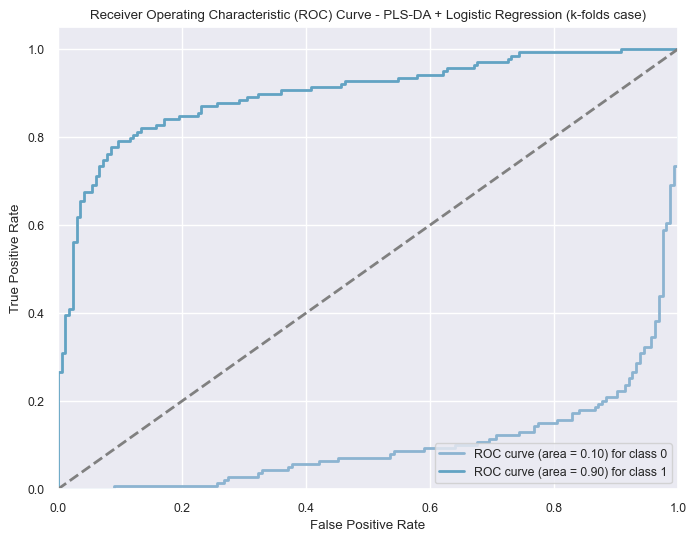

Average ROC AUC score - PLS-DA + Logistic Regression: 0.5
Micro-average F1 score - PLS-DA + Logistic Regression: 0.8415841584158416


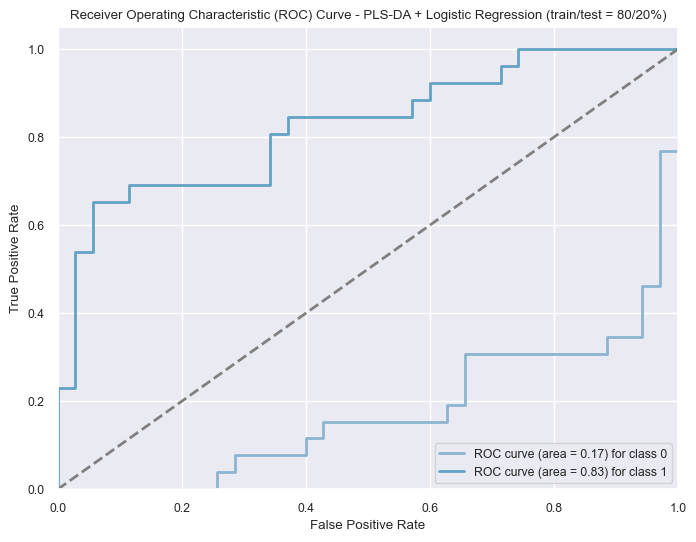

Average ROC AUC score - PLS-DA + Logistic Regression: 0.5
Micro-average F1 score - PLS-DA + Logistic Regression: 0.8032786885245902


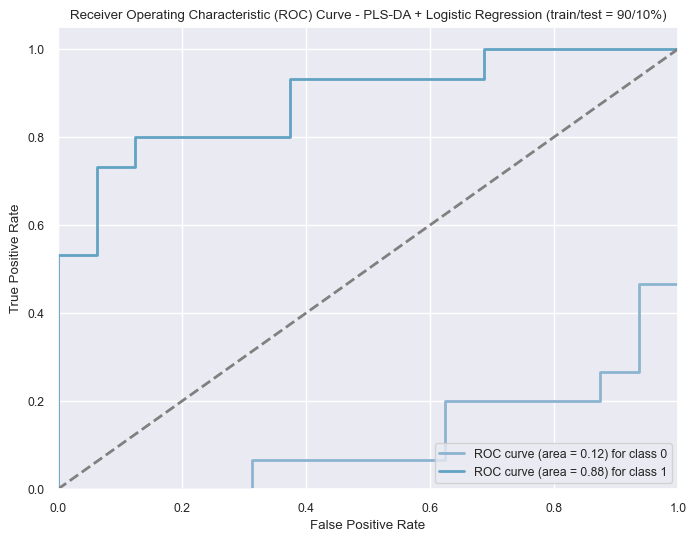

Average ROC AUC score - PLS-DA + Logistic Regression: 0.5
Micro-average F1 score - PLS-DA + Logistic Regression: 0.8064516129032258


In [82]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, roc_auc_score, f1_score


# Initialize the PLS-DA model
# plsda = PLSRegression(n_components=2)

# k-folds
# Train the PLS-DA model
plsda.fit(X_norm, y)

# Get the PLS-DA scores for each sample
plsda_scores = plsda.transform(X_norm)

# Initialize the logistic regression model
logistic_reg = LogisticRegression()

# Train the logistic regression model using PLS-DA scores as input
logistic_reg.fit(plsda_scores, y)

# Predict the probabilities using the logistic regression model
y_probs_logreg = logistic_reg.predict_proba(plsda_scores)

# Binarize the multiclass labels for ROC curve calculation
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y)

# Calculate ROC curve and ROC AUC score for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

# We'll check if y_probs_logreg has one or multiple dimensions
if len(np.shape(y_probs_logreg)) == 1:
    fpr[0], tpr[0], _ = roc_curve(y_test_bin[:, 0], y_probs_logreg)
    roc_auc[0] = roc_auc_score(y_test_bin[:, 0], y_probs_logreg)
else:
    for i in range(len(lb.classes_)):
#         fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_probs_logreg[:, i])
#         roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_probs_logreg[:, i])
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, 0], y_probs_logreg[:, i])
        roc_auc[i] = roc_auc_score(y_test_bin[:, 0], y_probs_logreg[:, i])

fpr_kf_plsda, tpr_kf_plsda, roc_auc_kf_plsda = roc_curve_plsda_storage(lb, y_test_bin, y_probs_logreg)

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(lb.classes_)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {lb.classes_[i]}')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - PLS-DA + Logistic Regression (k-folds case)')
plt.legend(loc="lower right")
plt.show()

# Print average ROC AUC score
print("Average ROC AUC score - PLS-DA + Logistic Regression:", np.mean(list(roc_auc.values())))

# Predict on test set using PLS-DA scores and logistic regression
y_pred_logreg = logistic_reg.predict(plsda_scores)

# Calculate micro-average F1 score
f1_micro = f1_score(y, y_pred_logreg, average='micro')

# Print micro-average F1 score
print("Micro-average F1 score - PLS-DA + Logistic Regression:", f1_micro)

# 80/20
# Train the PLS-DA model
plsda.fit(X_train_norm, y_train_norm)

# Get the PLS-DA scores for each sample
plsda_scores = plsda.transform(X_test_norm)

# Initialize the logistic regression model
logistic_reg = LogisticRegression()

# Train the logistic regression model using PLS-DA scores as input
logistic_reg.fit(plsda_scores, y_test_norm)

# Predict the probabilities using the logistic regression model
y_probs_logreg = logistic_reg.predict_proba(plsda_scores)

# Binarize the multiclass labels for ROC curve calculation
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y_test_norm)

# Calculate ROC curve and ROC AUC score for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

# We'll check if y_probs_logreg has one or multiple dimensions
if len(np.shape(y_probs_logreg)) == 1:
    fpr[0], tpr[0], _ = roc_curve(y_test_bin[:, 0], y_probs_logreg)
    roc_auc[0] = roc_auc_score(y_test_bin[:, 0], y_probs_logreg)
else:
    for i in range(len(lb.classes_)):
#         fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_probs_logreg[:, i])
#         roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_probs_logreg[:, i])
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, 0], y_probs_logreg[:, i])
        roc_auc[i] = roc_auc_score(y_test_bin[:, 0], y_probs_logreg[:, i])
        
fpr_80_20_plsda, tpr_80_20_plsda, roc_auc_80_20_plsda = roc_curve_plsda_storage(lb, y_test_bin, y_probs_logreg)

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(lb.classes_)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {lb.classes_[i]}')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - PLS-DA + Logistic Regression (train/test = 80/20%)')
plt.legend(loc="lower right")
plt.show()

# Print average ROC AUC score
print("Average ROC AUC score - PLS-DA + Logistic Regression:", np.mean(list(roc_auc.values())))

# Predict on test set using PLS-DA scores and logistic regression
y_pred_logreg = logistic_reg.predict(plsda_scores)

# Calculate micro-average F1 score
f1_micro = f1_score(y_test_norm, y_pred_logreg, average='micro')

# Print micro-average F1 score
print("Micro-average F1 score - PLS-DA + Logistic Regression:", f1_micro)

# 90/10
# Train the PLS-DA model
plsda.fit(X_train_norm2, y_train_norm2)

# Get the PLS-DA scores for each sample
plsda_scores = plsda.transform(X_test_norm2)

# Initialize the logistic regression model
logistic_reg = LogisticRegression()

# Train the logistic regression model using PLS-DA scores as input
logistic_reg.fit(plsda_scores, y_test_norm2)

# Predict the probabilities using the logistic regression model
y_probs_logreg = logistic_reg.predict_proba(plsda_scores)

# Binarize the multiclass labels for ROC curve calculation
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y_test_norm2)

# Calculate ROC curve and ROC AUC score for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

# We'll check if y_probs_logreg has one or multiple dimensions
if len(np.shape(y_probs_logreg)) == 1:
    fpr[0], tpr[0], _ = roc_curve(y_test_bin[:, 0], y_probs_logreg)
    roc_auc[0] = roc_auc_score(y_test_bin[:, 0], y_probs_logreg)
else:
    for i in range(len(lb.classes_)):
#         fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_probs_logreg[:, i])
#         roc_auc[i] = roc_auc_score(y_test_bin[:, i], y_probs_logreg[:, i])
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, 0], y_probs_logreg[:, i])
        roc_auc[i] = roc_auc_score(y_test_bin[:, 0], y_probs_logreg[:, i])

fpr_90_10_plsda, tpr_90_10_plsda, roc_auc_90_10_plsda = roc_curve_plsda_storage(lb, y_test_bin, y_probs_logreg)

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(lb.classes_)):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {lb.classes_[i]}')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - PLS-DA + Logistic Regression (train/test = 90/10%)')
plt.legend(loc="lower right")
plt.show()

# Print average ROC AUC score
print("Average ROC AUC score - PLS-DA + Logistic Regression:", np.mean(list(roc_auc.values())))

# Predict on test set using PLS-DA scores and logistic regression
y_pred_logreg = logistic_reg.predict(plsda_scores)

# Calculate micro-average F1 score
f1_micro = f1_score(y_test_norm2, y_pred_logreg, average='micro')

# Print micro-average F1 score
print("Micro-average F1 score - PLS-DA + Logistic Regression:", f1_micro)



### PLS-DA: Scores Biplot

0      0
1      1
2      1
3      0
4      0
      ..
298    1
299    1
300    1
301    1
302    0
Name: Target, Length: 303, dtype: int64


Text(0.5, 1.0, 'PLS-DA Scores Biplot')

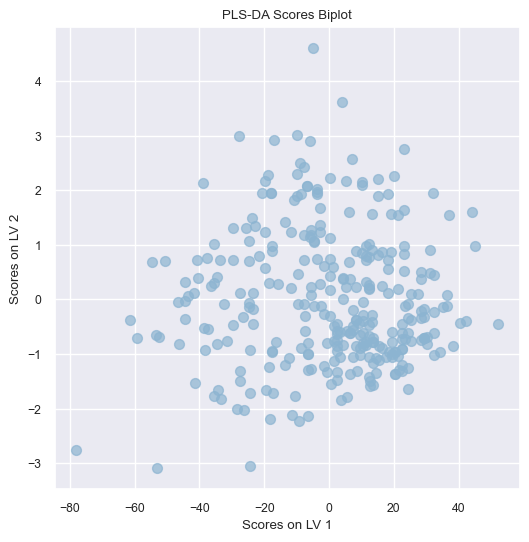

In [83]:
# Data loading
data = pd.read_csv('Correct_Dataset.csv')

# Checking for missing values again
missing_values = data.isnull().sum()

# Inizialization of a variable for the overall accuracies of the all Machine Learning Models
accuracies = {} 

# Encoding (possible encoders: OrdinalEncoder, One-HotEncoder, LabelEncoder)
# Columns for ordinal encoding
ordinal_cols = ["Major_Vessels", "Thalessemia"]
# Perform ordinal encoding
ordinal_encoder = OrdinalEncoder()
# ordinal_encoder = LabelEncoder()
data[ordinal_cols] = ordinal_encoder.fit_transform(data[ordinal_cols])

data = data.drop('Unnamed: 0',axis=1) # unnamed feature remove

feat_rem_arr = ['Age', "Sex","Resting_Blood_Pressure", "Colestrol", "Fasting_Blood_Sugar",
                 "Rest_ECG"]

for feat_rem in feat_rem_arr:
    data = data.drop(feat_rem,axis=1) # feature remove

# Class label from 5 values to 2 (binary)
data["Target"] = data["Target"].replace([1, 2, 3, 4], 1) # trasformation of class 1,2,3 and 4 in 1

print(data["Target"])    
# Split of dataset features and target (class label)
y = data["Target"] # target label
X = data.drop('Target',axis=1) # features label

# Scaling
# scaler = StandardScaler()
scaler = MinMaxScaler()
scaler_lb = LabelBinarizer() # only for multiclass labels (in this case for y_test)
# fit_transform is a function that has inside:
# norm = scaler.fit(X_train)  
# X_norm = norm.transform(X_train)

# Scaling of normalized one
# k-folds
X_norm = scaler.fit_transform(X)

############### TSNE NO NEED IN THIS CASE #############
# Re-assign of variables
# X_norm = X_tsne
# X_train_norm = X_tsne_norm
# X_train_norm2 = X_tsne_norm2
#######################################################

# LDA feature selection of NO normalized data
# LDA
n_comp = 1 # ValueError: n_components cannot be larger than min(n_features, n_classes - 1) => max 2
lda_sel = LinearDiscriminantAnalysis(n_components=n_comp)

# # k-folds
# X = lda_sel.fit_transform(X, y)

# LDA feature selection of normalized data
# k-folds
X_norm = lda_sel.fit_transform(X_norm, y)

##################################################################
plsr = PLSRegression(n_components=2, scale=False) # (1)
df = data
# Split of dataset
y_biplot = df["Target"] # class label
X_biplot = df.drop('Target',axis=1) # features label

plsr.fit(X_biplot, y_biplot) # (2)

colorlist = ["red", "blue"]

scores = pd.DataFrame(plsr.x_scores_)
# Reset the index to use the default integer index
scores.reset_index(drop=True, inplace=True)

# ax = scores.plot(x=0, y=1, kind='scatter', s=50, alpha=0.7, c=colorlist, figsize=(6,6))
ax = scores.plot(x=0, y=1, kind='scatter', s=50, alpha=0.7, figsize=(6,6))
ax.set_xlabel('Scores on LV 1')
ax.set_ylabel('Scores on LV 2')
plt.title("PLS-DA Scores Biplot")


In [84]:
# plsr = PLSRegression(n_components=2, scale=False) # (1)
# df = data
# # Split of dataset
# y_biplot = df["Target"] # class label
# X_biplot = df.drop('Target',axis=1) # features label

# plsr.fit(X_biplot, y_biplot) # (2)

# # Define colors based on class labels
# colors = ["red", "blue", "green"]  # Add more colors as needed for each class

# scores = pd.DataFrame(plsr.x_scores_)
# # Reset the index to use the default integer index
# scores.reset_index(drop=True, inplace=True)

# # Map the colors to the class labels
# colorlist = [colors[label] for label in y]
# label_list = ["Class 0", "Class 1"]

# ax = scores.plot(x=0, y=1, kind='scatter', s=50, alpha=0.7,
#                     c=colorlist, figsize=(6,6))
# ax.set_xlabel('Scores on LV 1')
# ax.set_ylabel('Scores on LV 2')
# plt.title("PLS-DA Scores Biplot")


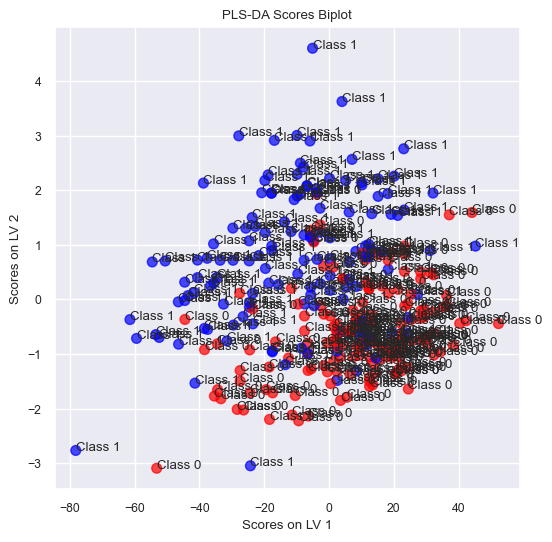

In [85]:
plsr = PLSRegression(n_components=2, scale=False) # (1)
df = data
# Split of dataset
y_biplot = df["Target"] # class label
X_biplot = df.drop('Target',axis=1) # features label

plsr.fit(X_biplot, y_biplot) # (2)

# Define colors based on class labels
colors = ["red", "blue", "green"]  # Add more colors as needed for each class

scores = pd.DataFrame(plsr.x_scores_)
# Reset the index to use the default integer index
scores.reset_index(drop=True, inplace=True)

# Map the colors to the class labels
colorlist = [colors[label] for label in y]

# Define a dictionary to map class labels to their corresponding label text
# class_label_mapping = {0: "Class 0", 1: "Class 1", ...}  # Add more mappings as needed
class_label_mapping = {0: "Class 0", 1: "Class 1"}  # Add more mappings as needed

# Create the label_list based on the class labels in 'y'
label_list = [class_label_mapping[label] for label in y]

ax = scores.plot(x=0, y=1, kind='scatter', s=50, alpha=0.7,
                    c=colorlist, figsize=(6,6))
ax.set_xlabel('Scores on LV 1')
ax.set_ylabel('Scores on LV 2')
plt.title("PLS-DA Scores Biplot")

# Add the label_list to the scatter plot
for i, txt in enumerate(label_list):
    ax.annotate(txt, (scores.iloc[i, 0], scores.iloc[i, 1]))

plt.show()


In [86]:
# plsr = PLSRegression(n_components=2, scale=False) # (1)
# df = data
# # Split of dataset
# y_biplot = df["Target"] # class label
# X_biplot = df.drop('Target',axis=1) # features label

# plsr.fit(X_biplot, y_biplot) # (2)

# # Define colors based on class labels
# colors = ["red", "blue", "green"]  # Add more colors as needed for each class

# scores = pd.DataFrame(plsr.x_scores_)
# # Reset the index to use the default integer index
# scores.reset_index(drop=True, inplace=True)

# # Map the colors to the class labels
# colorlist = [colors[label] for label in y]

# # Define a dictionary to map class labels to their corresponding label text
# class_label_mapping = {0: "Class 0", 1: "Class 1"}  # Add more mappings as needed

# # Create the label_list based on the class labels in 'y'
# label_list = [class_label_mapping[label] for label in y]

# ax = scores.plot(x=0, y=1, kind='scatter', s=50, alpha=0.7,
#                     c=colorlist, figsize=(6,6))
# ax.set_xlabel('Scores on LV 1')
# ax.set_ylabel('Scores on LV 2')
# plt.title("PLS-DA Scores Biplot")

# # Add the legend with label_list
# ax.legend(labels=label_list)

# plt.show()


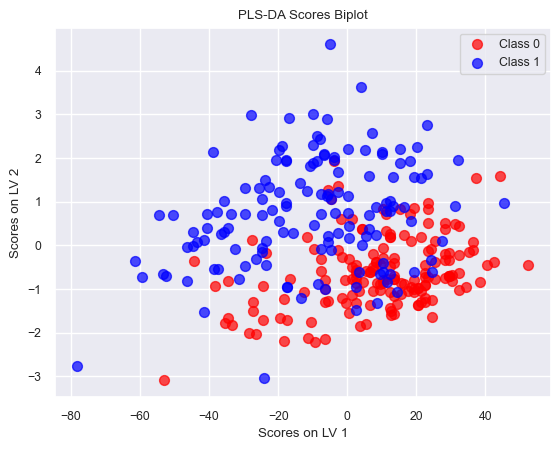

In [87]:
plsr = PLSRegression(n_components=2, scale=False) # (1)
df = data
# Split of dataset
y_biplot = df["Target"] # class label
X_biplot = df.drop('Target',axis=1) # features label

plsr.fit(X_biplot, y_biplot) # (2)
# plsr.fit(X_train_norm, y_train_norm) # (2)
# plsr.fit(X_train_norm2, y_train_norm2) # (2)


# Define colors based on class labels
colors = ["red", "blue"]  # Add more colors as needed for each class

scores = pd.DataFrame(plsr.x_scores_)
# Reset the index to use the default integer index
scores.reset_index(drop=True, inplace=True)

# Map the colors to the class labels
colorlist = [colors[label] for label in y]

# Create a scatter plot for each class separately
for label in set(y):
    indices = (y == label)
    plt.scatter(scores.loc[indices, 0], scores.loc[indices, 1], c=colors[label], s=50, alpha=0.7, label=f'Class {label}')

plt.xlabel('Scores on LV 1')
plt.ylabel('Scores on LV 2')
plt.title("PLS-DA Scores Biplot")

# Add the legend
plt.legend()

plt.show()


## Artificial Feed-Foward Neural Network (ANN): Multi-Layer Perceptrons (MLP) Classifier

### Create the model

In [88]:
model_nn = 'Neural Nets - MLP'
# mlpc = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5000, 10), random_state=1)
# mlpc = MLPClassifier(activation="tanh", solver='lbfgs', alpha=0.01, hidden_layer_sizes=(50,), random_state=1)
# mlpc = MLPClassifier(activation="tanh", solver='lbfgs', alpha=0.01, hidden_layer_sizes=(100,50), random_state=1)
mlpc = MLPClassifier(activation="tanh", solver='sgd', alpha=0.01, hidden_layer_sizes=(100,50), random_state=1)
mlpc_1 = MLPClassifier(activation="tanh", solver='sgd', alpha=0.01, hidden_layer_sizes=(100,50), random_state=1)

# mlpc = MLPClassifier(solver='lbfgs', alpha=0.01, hidden_layer_sizes=(100,80,60), random_state=1)


### Neural Network MLP Validation: k-fold cross validation and tuning of k-folds

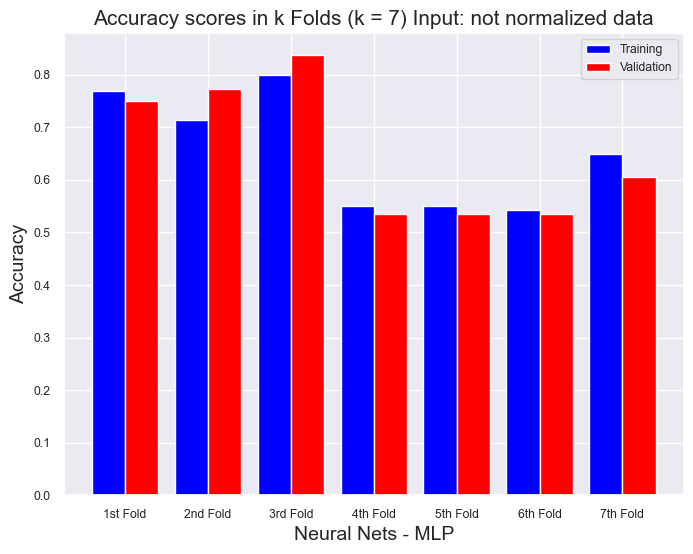

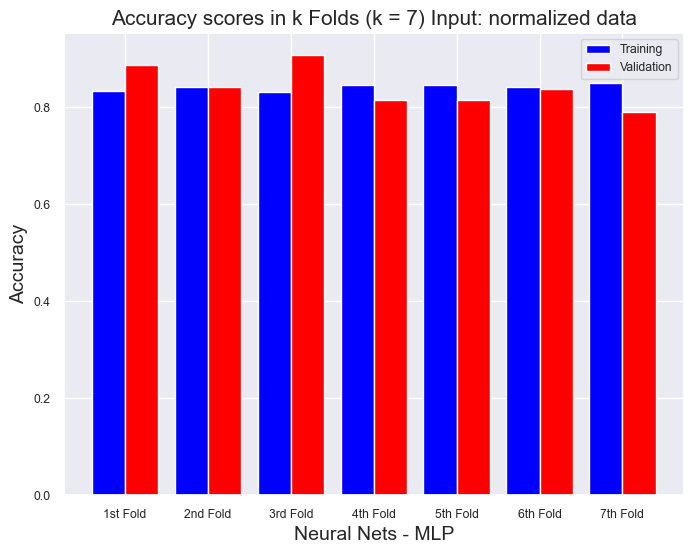

###### Not normalized data in input ######
Max Training Accuracy 80.0
Max Validation Accuracy 83.72093023255815

###### Normalized data in input ######
Max Training Accuracy 85.0
Max Validation Accuracy 90.69767441860465

 ######### k-fold Cross Validation - k Tuning #########

###### k = 2 ######
###### Not normalized data in input ######
Max Training Accuracy 70.86092715231787
Max Validation Accuracy 71.71052631578947

###### Normalized data in input ######
Max Training Accuracy 86.8421052631579
Max Validation Accuracy 87.5

###### k = 3 ######
###### Not normalized data in input ######
Max Training Accuracy 54.45544554455446
Max Validation Accuracy 53.46534653465347

###### Normalized data in input ######
Max Training Accuracy 86.13861386138613
Max Validation Accuracy 86.13861386138613

###### k = 4 ######
###### Not normalized data in input ######
Max Training Accuracy 72.68722466960352
Max Validation Accuracy 71.05263157894737

###### Normalized data in input ######
Max Training A

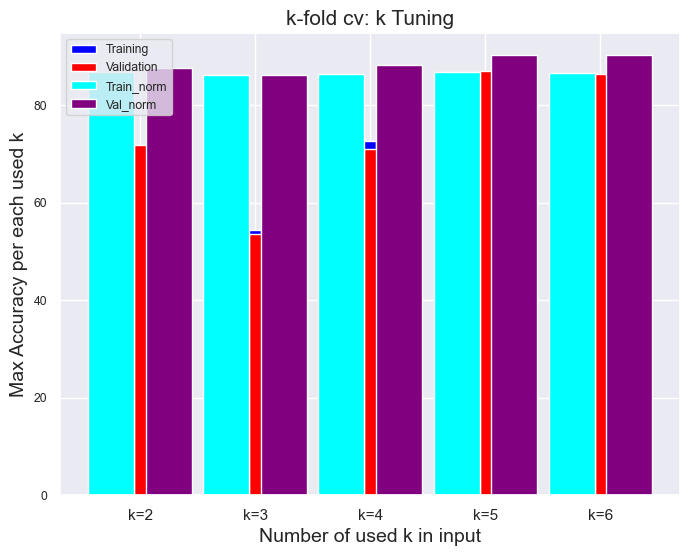

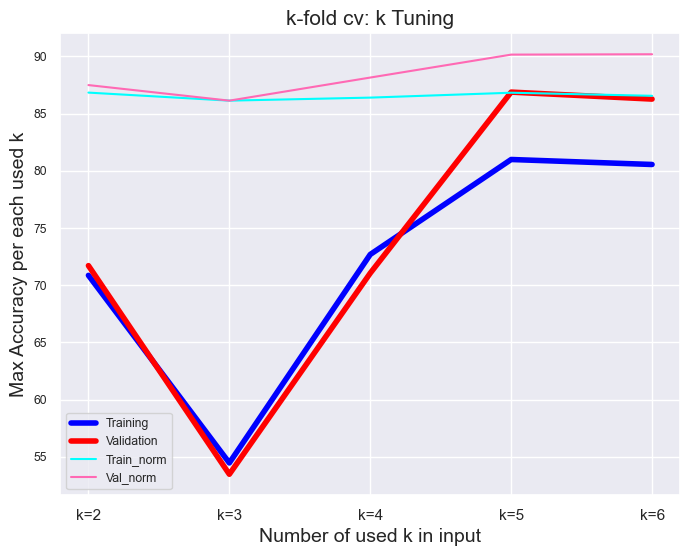

In [89]:
# k_folds = 5 
_result = cross_validation(mlpc, X, y, k_folds) # custom function that contains scklearn function cross_validate
_result_norm = cross_validation(mlpc, X_norm, y, k_folds) # custom function that contains scklearn function cross_validate

# print(_result)

# Plot Accuracy Result - not normalized
model_name = model_nn
plot_result(model_name,
            "Accuracy",
            "Accuracy scores in k Folds (k = " + str(k_folds) + ") Input: not normalized data",
            _result["Training Accuracy scores"],
            _result["Validation Accuracy scores"],
           k_folds)

# Plot Accuracy Result - normalized data
plot_result(model_name,
            "Accuracy",
            "Accuracy scores in k Folds (k = " + str(k_folds) + ") Input: normalized data",
            _result_norm["Training Accuracy scores"],
            _result_norm["Validation Accuracy scores"],
           k_folds)

print("###### Not normalized data in input ######")
print("Max Training Accuracy", _result['Max Training Accuracy'])
print("Max Validation Accuracy", _result['Max Validation Accuracy'])

print("\n###### Normalized data in input ######")
print("Max Training Accuracy", _result_norm['Max Training Accuracy'])
print("Max Validation Accuracy", _result_norm['Max Validation Accuracy'])

# k - tuning - it will require a lot of minutes in case of neural network       
k_iterations = 6       
max_k_fold_val_acc_mlp, k_mlp_max, max_k_fold_val_acc_mlp_norm, k_mlp_norm_max = k_fold_cv_tuning(mlpc, X, y, k_iterations)


### Neural Network MLP Validation: Training/Test one 80/20% and one 90/10%

In [90]:
print("######## Training/test = 80/20% ########")
# model_nn = 'Neural Nets - MLP'
# mlpc = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5000, 10), random_state=1)
mlpc_predicted, mlpc_conf_matrix, mlpc_acc_score = model_classifier(mlpc, X_train, X_test, y_train, y_test)
print_score(model_nn, mlpc_predicted, mlpc_conf_matrix, mlpc_acc_score, y_test)

print("\n######## Training/test = 90/10% ########")
mlpc_predicted2, mlpc_conf_matrix2, mlpc_acc_score2 = model_classifier(mlpc, X_train2, X_test2, y_train2, y_test2)
print_score(model_nn, mlpc_predicted2, mlpc_conf_matrix2, mlpc_acc_score2, y_test2)

print("######## Training/test = 80/20%, Normalized data ########")
mlpc_predicted_norm, mlpc_conf_matrix_norm, mlpc_acc_score_norm = model_classifier(mlpc, X_train_norm, X_test_norm, y_train_norm, y_test_norm)
print_score(model_nn, mlpc_predicted_norm, mlpc_conf_matrix_norm, mlpc_acc_score_norm, y_test_norm)

print("######## Training/test = 90/10%, Normalized data ########")
mlpc_predicted_norm2, mlpc_conf_matrix_norm2, mlpc_acc_score_norm2 = model_classifier(mlpc, X_train_norm2, X_test_norm2, y_train_norm2, y_test_norm2)
print_score(model_nn, mlpc_predicted_norm2, mlpc_conf_matrix_norm2, mlpc_acc_score_norm2, y_test_norm2)


######## Training/test = 80/20% ########
Confusion matrix
[[35  0]
 [22  4]]
-------------------------------------------
Accuracy of Neural Nets - MLP: 63.934426229508205 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.61      1.00      0.76        35
           1       1.00      0.15      0.27        26

    accuracy                           0.64        61
   macro avg       0.81      0.58      0.51        61
weighted avg       0.78      0.64      0.55        61


######## Training/test = 90/10% ########
Confusion matrix
[[14  2]
 [ 6  9]]
-------------------------------------------
Accuracy of Neural Nets - MLP: 74.19354838709677 

-------------------------------------------
              precision    recall  f1-score   support

           0       0.70      0.88      0.78        16
           1       0.82      0.60      0.69        15

    accuracy                           0.74        31
   macro avg       0.

### Neural Network MLP - Architectures, Activation Functions and Hyperparameters Tuning with GridSearchCV

In [91]:
def gridsearch_mlpc_tuning(mlp, X_train, y_train, X_test, y_test):
    # Def
    param_grid_mlp = {
        'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50), (100, 80, 60)],
        'activation': ['relu', 'tanh', 'logistic'],
        'solver': ['adam', 'sgd'],               # Ottimizzator -> Better results without this
#         'batch_size': [32],             # Batch size
#         'max_iter': [100],            # Epochs
    }

    # Esec. GridSearchCV tuning
    grid_search_mlp = GridSearchCV(mlp, param_grid_mlp, cv=5, scoring='accuracy')
    grid_search_mlp.fit(X_train, y_train)

    # Best hyperparameter
    best_params_mlp = grid_search_mlp.best_params_

    # Training
    best_mlp = MLPClassifier(hidden_layer_sizes=best_params_mlp['hidden_layer_sizes'], activation=best_params_mlp['activation'])
    best_mlp.fit(X_train, y_train)

    # Evaluation 
    accuracy_mlp = best_mlp.score(X_test, y_test)
    print("Best MLP Hyperparameters with GridSearchCV approch: ", best_mlp)
    print("Accuracy MLP:", accuracy_mlp)
    
    return best_mlp
    

In [92]:
# mlp = MLPClassifier()
mlp = mlpc

print("######## Training/test = 80/20% ########")
best_mlp8020 = gridsearch_mlpc_tuning(mlp, X_train, y_train, X_test, y_test)

print("\n######## Training/test = 90/10% ########")
best_mlp9010 = gridsearch_mlpc_tuning(mlp, X_train2, y_train2, X_test2, y_test2)

print("\n######## Training/test = 80/20%, Normalized data ########")
best_mlp8020_norm = gridsearch_mlpc_tuning(mlp, X_train_norm, y_train_norm, X_test_norm, y_test_norm)

print("\n######## Training/test = 90/10%, Normalized data ########")
best_mlp9010_norm = gridsearch_mlpc_tuning(mlp, X_train_norm2, y_train_norm2, X_test_norm2, y_test_norm2)


######## Training/test = 80/20% ########
Best MLP Hyperparameters with GridSearchCV approch:  MLPClassifier()
Accuracy MLP: 0.8032786885245902

######## Training/test = 90/10% ########
Best MLP Hyperparameters with GridSearchCV approch:  MLPClassifier(activation='logistic', hidden_layer_sizes=(100, 50))
Accuracy MLP: 0.8387096774193549

######## Training/test = 80/20%, Normalized data ########
Best MLP Hyperparameters with GridSearchCV approch:  MLPClassifier()
Accuracy MLP: 0.8032786885245902

######## Training/test = 90/10%, Normalized data ########
Best MLP Hyperparameters with GridSearchCV approch:  MLPClassifier()
Accuracy MLP: 0.8064516129032258


### Neural Network MLP Extra tuning - Custom tuning

In [93]:
# # Dataset loading 
# data = pd.read_csv('Correct_Dataset.csv')

# # Encoding
# ordinal_cols = ["Major_Vessels", "Thalessemia"]
# ordinal_encoder = OrdinalEncoder()
# data[ordinal_cols] = ordinal_encoder.fit_transform(data[ordinal_cols])

# # Split feature and class(target)
# y = data["Target"]
# X = data.drop('Target', axis=1)

# # Split data for scaling
# X_train_norm, X_test_norm, y_train_norm, y_test_norm = train_test_split(X, y, test_size=0.2, random_state=0)

# Scaling
# scaler = StandardScaler()
# X_train_norm = scaler.fit_transform(X_train_norm)
# X_test_norm = scaler.transform(X_test_norm)

# Definition of MLPClassifier
mlp_classifier = MLPClassifier(
    hidden_layer_sizes=(100, 80, 60),  # Number of neurons in the hidden layers
    activation='relu',           # ReLU activation function
    solver='adam',               # Optimizer Adam
    batch_size=32,               # Batch size
    max_iter=1000,                # Number of epochs
    random_state=42              # Random state for reproducibility
)

print("\n######## Training/test = 80/20%, Normalized data ########")
# Train the MLP classifier
mlp_classifier.fit(X_train_norm, y_train_norm)

# Validation
accuracy = mlp_classifier.score(X_test_norm, y_test_norm)
print("Hyperparameters #1: ", mlp_classifier)
print("Accuracy:", accuracy)

# Another set of architecture
# Optimizer Stochastic Gradient Descent (SGD) (learning rate included)
# Definition of MLP classifier
mlp_classifier = MLPClassifier(
    hidden_layer_sizes=(100, 80, 60),  # Number of neurons in the hidden layers
    activation='relu',           # ReLU activation function
    solver='sgd',                # Optimizer SGD (Stochastic Gradient Descent)
    learning_rate_init=0.001,    # Initial learning rate
    batch_size=32,               # Batch size
    max_iter=1000,                # Number of epochs
    random_state=42              # Random state for reproducibility
)

print("\n######## Training/test = 80/20%, Normalized data ########")
# Train the MLP classifier
mlp_classifier.fit(X_train_norm, y_train_norm)

# Validation
accuracy = mlp_classifier.score(X_test_norm, y_test_norm)
print("Hyperparameters #2: ", mlp_classifier)
print("Accuracy:", accuracy)


######## Training/test = 80/20%, Normalized data ########
Hyperparameters #1:  MLPClassifier(batch_size=32, hidden_layer_sizes=(100, 80, 60), max_iter=1000,
              random_state=42)
Accuracy: 0.819672131147541

######## Training/test = 80/20%, Normalized data ########
Hyperparameters #2:  MLPClassifier(batch_size=32, hidden_layer_sizes=(100, 80, 60), max_iter=1000,
              random_state=42, solver='sgd')
Accuracy: 0.819672131147541


### Neural Network MLP - Architectures, Activation Functions and Hyperparameters Tuning with RandomizedSearchCV

In [112]:
# Dict. for MLP Classifier
mlp_params = {
#     'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50), (5000, 10)],
#     'hidden_layer_sizes': [(50,), (100, 50), (100, 80, 60)],
    'activation': ['relu', 'tanh'],
    'alpha': [1e-5, 0.0001, 0.001, 0.01],
    'solver': ['lbfgs']
}
# RandomizedSearchCV for MLP Classifier
mlp_model = MLPClassifier()
mlp_random = RandomizedSearchCV(mlp_model, mlp_params, n_iter=5, cv=5, random_state=42)
mlp_random.fit(X_train_norm, y_train_norm)
mlp_model = mlp_random.best_estimator_
print("Best Parameter for (ANN) MLP: ", mlp_random.best_estimator_)
accuracy_RandSearchCV = mlp_model.score(X_test_norm, y_test_norm)
print("Accuracy with RandomizedSearchCV approch: ", accuracy_RandSearchCV)

# Re-assign of variable
mlpc = mlp_model


Best Parameter for (ANN) MLP:  MLPClassifier(solver='lbfgs')
Accuracy with RandomizedSearchCV approch:  0.7868852459016393


### Neural Network MLP: plot of hyperparameters tuning

In [95]:
# def plot_mlp_tuning(X_train, X_test, y_train, y_test):
    
# #     activation_func = ['identity','logistic','tanh','relu']
#     activation_func = ['logistic','tanh','relu']
#     hidden_layers_arr = [(50,), (100, 50), (100, 80, 60)]
#     solvers = ['lbfgs','sgd','adam'] # for a possible solver tuning
#     mlpc_acc = []
    
#     for hid in hidden_layers_arr:
#         print("Hidden Layer: ", hid)
#         for func in activation_func:
#             print("Activation function: " + func)
# #             mlpc = MLPClassifier(activation=func, solver='sgd', alpha=0.01, hidden_layer_sizes=(100,50), random_state=1) 
#             mlpc = MLPClassifier(activation=func, solver='sgd', alpha=0.01, hidden_layer_sizes=hid, random_state=1)        
#             mlpc.fit(X_train, y_train) # fit must be done over training
#             mlpc_predicted = mlpc.predict(X_test) # prediction must be done over test
#             mlpc_conf_matrix = confusion_matrix(y_test, mlpc_predicted)
#             mlpc_acc.append(accuracy_score(y_test, mlpc_predicted))
#             print("done")

# #     acc_identity = mlpc_acc[0]
#     acc_logistic = mlpc_acc[0]
#     acc_tanh = mlpc_acc[1]
#     acc_relu = mlpc_acc[2]
    
# #     print(mlpc_acc)
# #     model_mlp = pd.DataFrame({'Activation Function': ['identity','logistic','tanh','relu'], 
# #                              'Accuracy': [acc_identity, acc_logistic, acc_tanh, acc_relu]})
    
#     model_mlp = pd.DataFrame({'Activation Function': ['logistic','tanh','relu', 
#                                                       'logistic','tanh','relu', 
#                                                       'logistic','tanh','relu'],
# #                              'Accuracy': [acc_logistic, acc_tanh, acc_relu],
#                              'Accuracy': mlpc_acc,                              
#                              'Hidden Layer': [(50,),(50,),(50,),
#                                               (100, 50),(100, 50),(100, 50),
#                                               (100, 80, 60),(100, 80, 60),(100, 80, 60)]})    

# #     print(model_mlp)
    
#     sns.set_style('darkgrid')
#     palette = ['rainbow','deep','muted','pastel','bright','dark','colorblind','husl']
#     sns.set_palette(palette[4])  
    
#     colors = ['red','green','blue','darkorange','magenta', 
#           'cyan', '#11A5AA','#AA1190', '#BB6666','#DAF7A6','#FF5733']
    
#     # plt.figure(figsize=(8,5))
#     # plt.title("barplot Represent Accuracy of different models")
#     # plt.ylabel("Accuracy %")
#     # plt.xticks(rotation=70)
#     # plt.xlabel("Algorithms")
#     # plt.bar(model_ev['Model'],model_ev['Accuracy'],color = colors)
#     # plt.show()

#     plt.figure(figsize=(8,5))
#     plt.title("barplot Represent Accuracy of different activation functions\n"+
#               "with fixed hidden layer (100,50) and solver Stochastic Gradient Descent(SGD)")
#     plt.ylabel("Accuracy %")
#     plt.xticks(rotation=0)
#     plt.xlabel("Activation Functions")
#     plt.bar(model_mlp['Activation Function'],model_mlp['Accuracy'], color=colors)
#     # plt.legend(model_ev['Normalized data']) # wrong legend print
# #     plt.legend(model_mlp['Hidden Layer'])
# #     plt.legend("(50,),(50,),(50,), (100, 50),(100, 50),(100, 50), (100, 80, 60),(100, 80, 60),(100, 80, 60)")
#     plt.show()

#     print(model_mlp)

####################################################################  

# def plot_mlp_tuning(X_train, X_test, y_train, y_test):
    
#     activation_func = ['logistic','tanh','relu']
#     hidden_layers_arr = [(50,), (100, 50), (100, 80, 60)]
#     mlpc_acc = []
#     hid_act = []
    
#     for hid in hidden_layers_arr:
# #         print("Hidden Layer: ", hid)
#         for func in activation_func:
# #             print("Activation function: " + func)
#             mlpc = MLPClassifier(activation=func, solver='sgd', alpha=0.01, hidden_layer_sizes=hid, random_state=1)        
#             mlpc.fit(X_train, y_train) 
#             mlpc_predicted = mlpc.predict(X_test) 
#             mlpc_conf_matrix = confusion_matrix(y_test, mlpc_predicted)
#             mlpc_acc.append(accuracy_score(y_test, mlpc_predicted))
#             hid_act.append([str(hid) + ", " + func])
# #             print("done")

#     model_mlp = pd.DataFrame({'Activation Function': activation_func * len(hidden_layers_arr),
#                               'Accuracy': mlpc_acc,
#                               'Hidden Layer': hidden_layers_arr * len(activation_func)})    

#     sns.set_style('darkgrid')
#     palette = ['rainbow','deep','muted','pastel','bright','dark','colorblind','husl']
#     sns.set_palette(palette[4])  
    
#     # Create a dictionary to map each combination to a color
#     color_dict = dict(zip(zip(model_mlp['Activation Function'], model_mlp['Hidden Layer']), sns.color_palette()))

#     # Generate a new list of colors based on the unique combinations
#     unique_combinations = list(set(zip(model_mlp['Activation Function'], model_mlp['Hidden Layer'])))
#     colors = [color_dict[tuple(combination)] for combination in unique_combinations]

#     plt.figure(figsize=(8,5))
#     plt.title("Barplot Represent Accuracy of different activation functions\n"+
#               "with solver Stochastic Gradient Descent(SGD)")
#     plt.ylabel("Accuracy %")
#     plt.xticks(rotation=0)
#     plt.xlabel("Activation Functions")

#     # Bar width and separation
#     bar_width = 0.2
#     bar_positions = [i + bar_width * j for i in range(len(hidden_layers_arr)) for j in range(3)]

#     # Plot the bars
#     plt.bar(bar_positions, model_mlp['Accuracy'], width=bar_width, color=colors)

#     # Set xticks and labels for each group
#     xticks_positions = [i + bar_width for i in range(0, len(hidden_layers_arr))]
#     xticks_labels = [str(hid) for hid in hidden_layers_arr]
# #     plt.xticks(xticks_positions, xticks_labels)
#     plt.xticks(xticks_positions, activation_func)
# #     plt.xticks(activation_func)

#     # Show the legend
# #     plt.legend(unique_combinations, title='Activation Function & Hidden Layer', bbox_to_anchor=(1, 1))
# #     counter = 0
# #     for hid in hidden_layers_arr:
# #         for func in activation_func:
# #             plt.legend(hid_act[counter], title='Activation Function & Hidden Layer', bbox_to_anchor=(1, 1))
# #             counter += 1
#     plt.legend(hid_act, title='Activation Function & Hidden Layer', bbox_to_anchor=(1, 1))            
#     plt.tight_layout()

#     plt.show()

#     print(model_mlp)



In [96]:
def plot_mlp_tuning(X_train, X_test, y_train, y_test):
    
    activation_func = ['logistic', 'tanh', 'relu']
    hidden_layers_arr = [(50,), (100, 50), (100, 80, 60)]
    hid_lay = [[(50,), (100, 50), (100, 80, 60)],
               [(50,), (100, 50), (100, 80, 60)],
               [(50,), (100, 50), (100, 80, 60)]]
    mlpc_acc = []
    hid_act = []
    
    for hid in hidden_layers_arr:
        for func in activation_func:
            mlpc = MLPClassifier(activation=func, solver='sgd', alpha=0.01, hidden_layer_sizes=hid, random_state=1)        
            mlpc.fit(X_train, y_train) 
            mlpc_predicted = mlpc.predict(X_test) 
            mlpc_conf_matrix = confusion_matrix(y_test, mlpc_predicted)
            mlpc_acc.append(accuracy_score(y_test, mlpc_predicted))
#             hid_act.append(str(hid) + ", " + func)
#             hid_act.append(func)
        hid_act.append(str(hid))

    model_mlp = pd.DataFrame({'Activation Function': activation_func * len(hidden_layers_arr),
                              'Accuracy': mlpc_acc,
                              'Hidden Layer': hidden_layers_arr * len(activation_func)})    

#     model_mlp = pd.DataFrame({'Activation Function': ['logistic','tanh','relu', 
#                                                       'logistic','tanh','relu', 
#                                                       'logistic','tanh','relu'],
#                              'Accuracy': mlpc_acc,                              
#                              'Hidden Layer': [(50,),(50,),(50,),
#                                               (100, 50),(100, 50),(100, 50),
#                                               (100, 80, 60),(100, 80, 60),(100, 80, 60)]})   

    sns.set_style('darkgrid')
    palette = ['rainbow', 'deep', 'muted', 'pastel', 'bright', 'dark', 'colorblind', 'husl']
    sns.set_palette(palette[4])  
    
    # Create a dictionary to map each combination to a color
    color_dict = dict(zip(zip(model_mlp['Activation Function'], model_mlp['Hidden Layer']), sns.color_palette()))

    # Generate a new list of colors based on the unique combinations
    unique_combinations = list(set(zip(model_mlp['Activation Function'], model_mlp['Hidden Layer'])))
    colors = [color_dict[tuple(combination)] for combination in unique_combinations]

    plt.figure(figsize=(8,5))
    plt.title("Barplot Represent Accuracy of different activation functions\n"+
              "with solver Stochastic Gradient Descent(SGD)")
    plt.ylabel("Accuracy %")
    plt.xticks(rotation=0)
    plt.xlabel("Activation Functions")

    # Plot the bars for each combination
    bar_width = 0.3
    text_bar = 0.05
#     print(colors)
    
    for i, comb in enumerate(unique_combinations):
        pos = [i + bar_width * j for j in range(len(hidden_layers_arr))]
        acc = model_mlp[(model_mlp['Activation Function'] == comb[0]) & (model_mlp['Hidden Layer'] == comb[1])]['Accuracy']
#         plt.bar(pos, acc, width=bar_width, color=color_dict[comb], label=f"{comb[0]} {comb[1]}")        
#         plt.bar(pos, acc, width=bar_width, color=colors, label=f"{comb[0]} {comb[1]}")
#         plt.bar(pos, acc, width=bar_width, color=colors, label=str(hidden_layers_arr[i]))
        plt.bar(pos, acc, width=bar_width, color=colors)
        counter = 0
        # Add the accuracy label above each bar
        for x, y in zip(pos, acc):
#             plt.text(x + bar_width / 2, y, f"{y:.2f}%", ha='center', va='bottom') # accuracy text
            # Add the hidden layer label above each bar
            plt.text(x + text_bar/ 2, y, hid_lay[i][counter], ha='center', va='bottom',fontsize=9) # hidden layer text
            counter = counter+1

#     print(i)
#     print(comb)
    # Set xticks and labels for each group
    xticks_positions = [i + bar_width for i in range(len(activation_func))]
#     xticks_labels = [str(func) for func in activation_func]
    xticks_labels = [str(func) for func in [ 'relu','tanh','logistic']]

    plt.xticks(xticks_positions, xticks_labels)

    # Show the legend
#     plt.legend(hid_act, title='Hidden Layers', bbox_to_anchor=(1, 1))
#     plt.legend(title='Hidden Layers', bbox_to_anchor=(1,1))
    plt.tight_layout()

    plt.show()

#     print(model_mlp)



######## Training/test = 80/20% ########


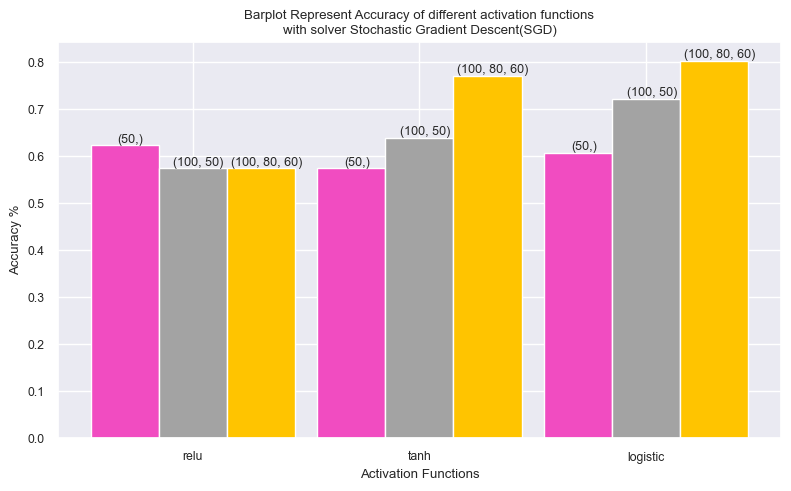


######## Training/test = 90/10% ########


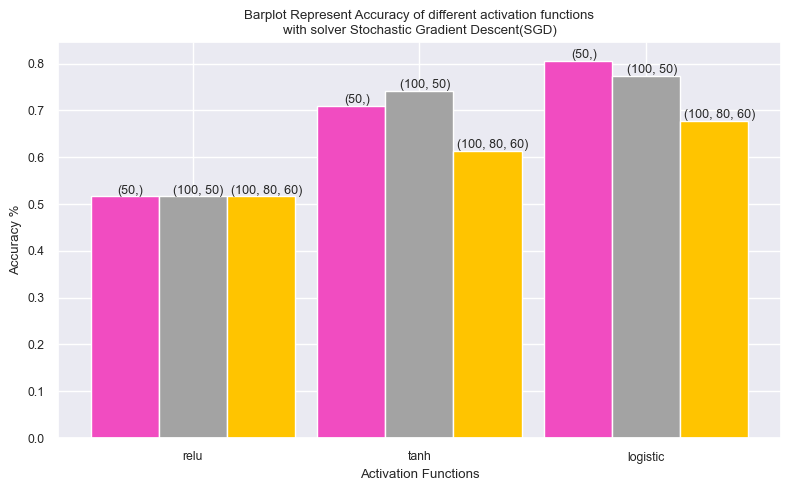


######## Training/test = 80/20%, Normalized data ########


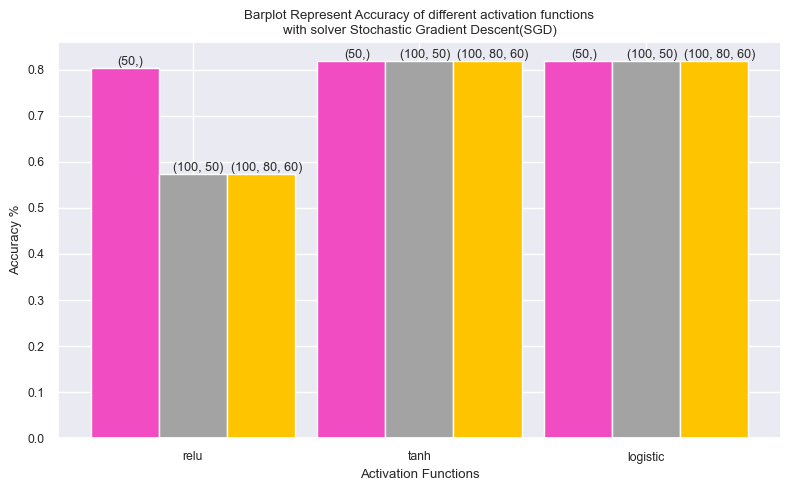


######## Training/test = 90/10%, Normalized data ########


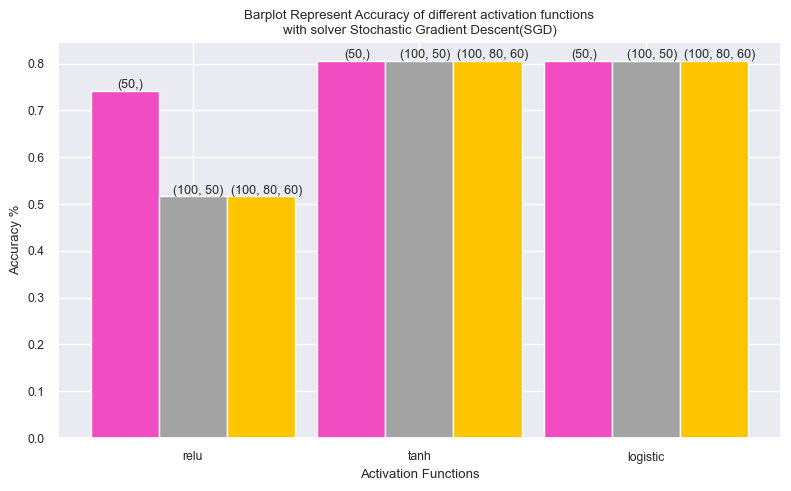

In [97]:
print("\n######## Training/test = 80/20% ########")
plot_mlp_tuning(X_train, X_test, y_train, y_test)

print("\n######## Training/test = 90/10% ########")
plot_mlp_tuning(X_train2, X_test2, y_train2, y_test2)

print("\n######## Training/test = 80/20%, Normalized data ########")
plot_mlp_tuning(X_train_norm, X_test_norm, y_train_norm, y_test_norm)

print("\n######## Training/test = 90/10%, Normalized data ########")
plot_mlp_tuning(X_train_norm2, X_test_norm2, y_train_norm2, y_test_norm2)

### Neural Network MLP: plot of hyperparameters tuning - Learning Curves

No normalized case 80/20


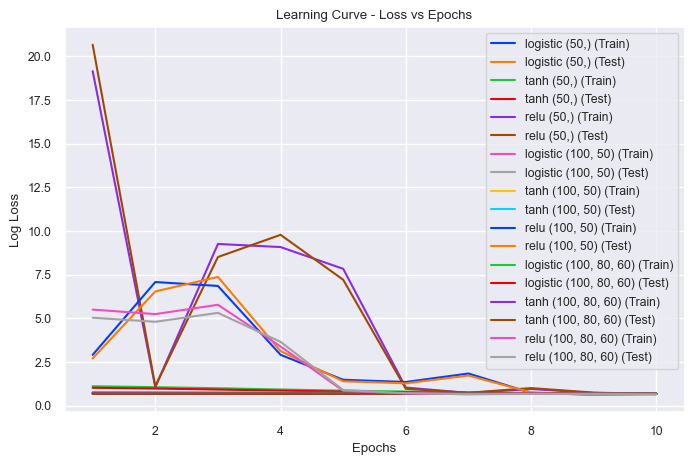

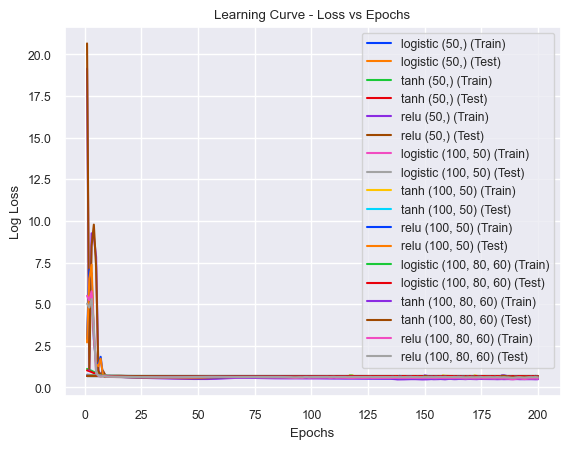

In [98]:
from sklearn.metrics import log_loss

print("No normalized case 80/20")
activation_func = ['logistic', 'tanh', 'relu']
hidden_layers_arr = [(50,), (100, 50), (100, 80, 60)]
# epochs = 100 # I used 200 in the prev. code (default value)
# epochs = 10 # to zoom better, plateau achieved after 10 epochs
epoch_arr = [10, 200]
plt.figure(figsize=(8,5))
for epochs in epoch_arr:
    for hid in hidden_layers_arr:
        for func in activation_func:
            mlpc = MLPClassifier(activation=func, solver='sgd', alpha=0.01, hidden_layer_sizes=hid, random_state=1) 
            loss_train = []
            loss_test = []

            for epoch in range(epochs):
                mlpc.partial_fit(X_train, y_train, classes=np.unique(y_train))
                # Compute training loss
                y_train_pred = mlpc.predict_proba(X_train)
                loss_train.append(log_loss(y_train, y_train_pred))

                # Compute testing loss
                y_test_pred = mlpc.predict_proba(X_test)
                loss_test.append(log_loss(y_test, y_test_pred))

            plt.plot(range(1, epochs + 1), loss_train, label=f"{func} {hid} (Train)")
            plt.plot(range(1, epochs + 1), loss_test, label=f"{func} {hid} (Test)")


    plt.title("Learning Curve - Loss vs Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Log Loss")
    plt.legend(bbox_to_anchor=(1,1))
    plt.grid(True)
    plt.show()



Normalized case 80/20


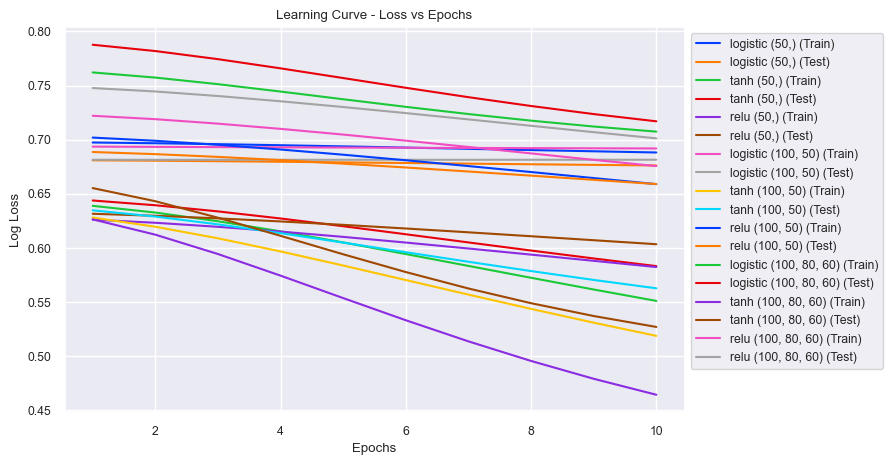

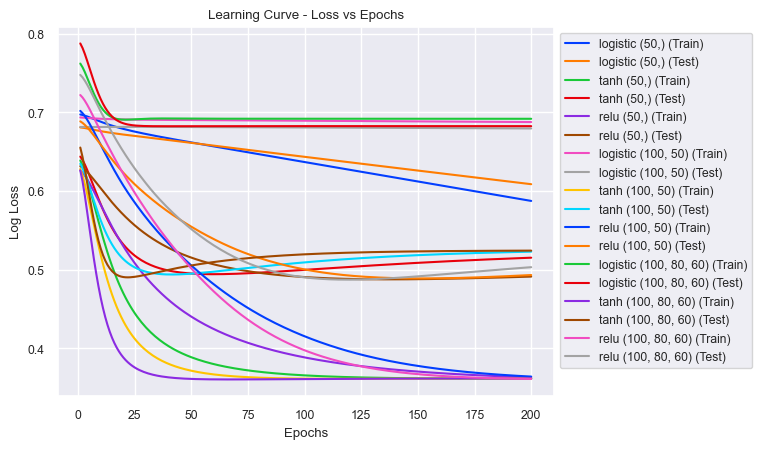

In [99]:
print("Normalized case 80/20")
plt.figure(figsize=(8,5))
for epochs in epoch_arr:
    for hid in hidden_layers_arr:
        for func in activation_func:
            mlpc = MLPClassifier(activation=func, solver='sgd', alpha=0.01, hidden_layer_sizes=hid, random_state=1) 
            loss_train = []
            loss_test = []

            for epoch in range(epochs):
                mlpc.partial_fit(X_train_norm, y_train_norm, classes=np.unique(y_train_norm))
                # Compute training loss
                y_train_pred = mlpc.predict_proba(X_train_norm)
                loss_train.append(log_loss(y_train_norm, y_train_pred))

                # Compute testing loss
                y_test_pred = mlpc.predict_proba(X_test_norm)
                loss_test.append(log_loss(y_test_norm, y_test_pred))

            plt.plot(range(1, epochs + 1), loss_train, label=f"{func} {hid} (Train)")
            plt.plot(range(1, epochs + 1), loss_test, label=f"{func} {hid} (Test)")


    plt.title("Learning Curve - Loss vs Epochs")
    plt.xlabel("Epochs")
    plt.ylabel("Log Loss")
    plt.legend(bbox_to_anchor=(1,1))
    plt.grid(True)
    plt.show()


activation=tanh, solver=sgd, hidden_layer_sizes=(100, 50)
No normalized case 80/20


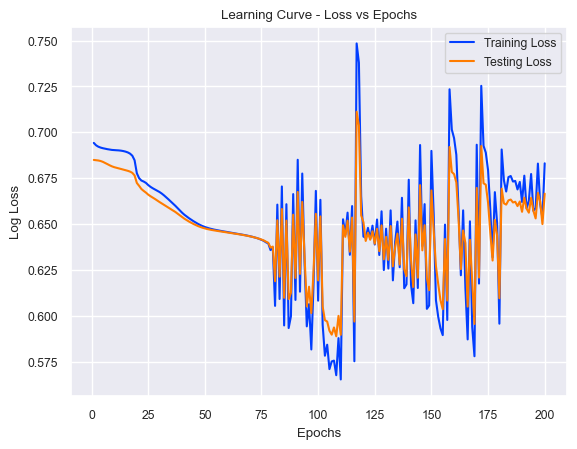

Normalized case 80/20


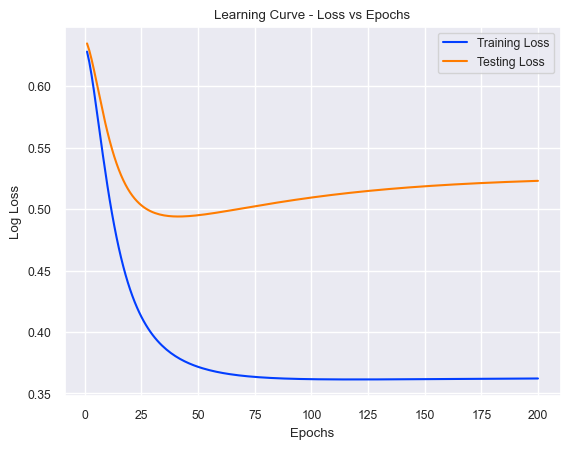

In [100]:
print("activation=tanh, solver=sgd, hidden_layer_sizes=(100, 50)")
print("No normalized case 80/20")
mlpc = MLPClassifier(activation="tanh", solver='sgd', alpha=0.01, hidden_layer_sizes=(100, 50), random_state=1) 

epochs = 200
loss_train = []
loss_test = []

for epoch in range(epochs):
    mlpc.partial_fit(X_train, y_train, classes=np.unique(y_train))
    # Compute training loss
    y_train_pred = mlpc.predict_proba(X_train)
    loss_train.append(log_loss(y_train, y_train_pred))
    
    # Compute testing loss
    y_test_pred = mlpc.predict_proba(X_test)
    loss_test.append(log_loss(y_test, y_test_pred))

plt.plot(range(1, epochs + 1), loss_train, label="Training Loss")
plt.plot(range(1, epochs + 1), loss_test, label="Testing Loss")
plt.title("Learning Curve - Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Log Loss")
plt.legend()
plt.grid(True)
plt.show()

print("Normalized case 80/20")
mlpc = MLPClassifier(activation="tanh", solver='sgd', alpha=0.01, hidden_layer_sizes=(100, 50), random_state=1) 

epochs = 200
loss_train = []
loss_test = []

for epoch in range(epochs):
    mlpc.partial_fit(X_train_norm, y_train_norm, classes=np.unique(y_train_norm))
    # Compute training loss
    y_train_pred = mlpc.predict_proba(X_train_norm)
    loss_train.append(log_loss(y_train_norm, y_train_pred))
    
    # Compute testing loss
    y_test_pred = mlpc.predict_proba(X_test_norm)
    loss_test.append(log_loss(y_test_norm, y_test_pred))

plt.plot(range(1, epochs + 1), loss_train, label="Training Loss")
plt.plot(range(1, epochs + 1), loss_test, label="Testing Loss")
plt.title("Learning Curve - Loss vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Log Loss")
plt.legend()
plt.grid(True)
plt.show()


### Neural Network MLP: ROC Curve and F1 score (only for normalized data)

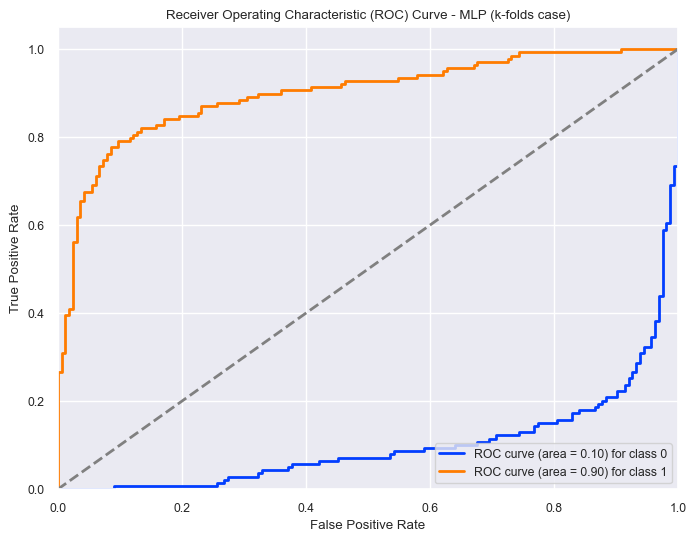

Average ROC AUC score - MLP: 0.5
Micro-average F1 score - MLP: 0.8415841584158416


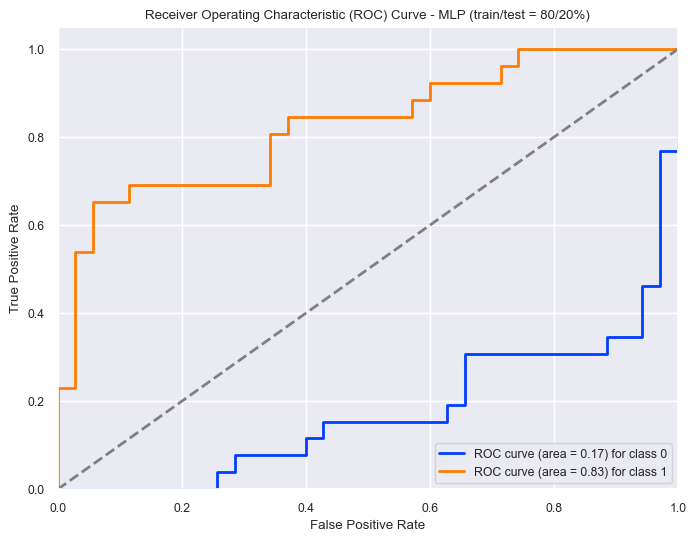

Average ROC AUC score - MLP: 0.5
Micro-average F1 score - MLP: 0.819672131147541


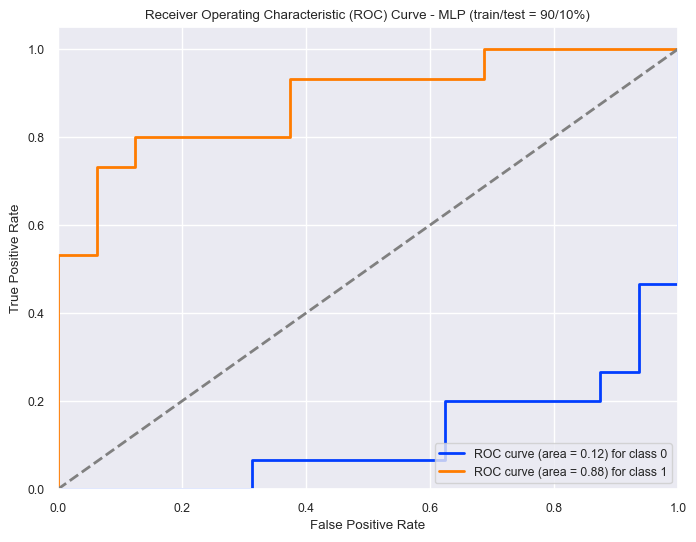

Average ROC AUC score - MLP: 0.5
Micro-average F1 score - MLP: 0.8064516129032258


In [101]:
# Define the MLP model
# mlp = MLPClassifier(hidden_layer_sizes=(100,), activation='relu', solver='adam', learning_rate_init=0.001)
# mlp = mlpc
# mlp = best_mlp8020
mlp = mlpc_1

# k-fold
# Train the model
mlp.fit(X_norm, y)

# Convert the multiclass labels to binary format (one-vs-rest)
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y)

# Predict the probabilities for ROC curve
y_probabilities_mlp = mlp.predict_proba(X_norm)

# Calculate ROC curve and ROC AUC score for each class
fpr_mlp = dict()
tpr_mlp = dict()
roc_auc_mlp = dict()
for i in range(len(lb.classes_)):
#     fpr_mlp[i], tpr_mlp[i], _ = roc_curve(y_test_bin[:, i], y_probabilities_mlp[:, i])
#     roc_auc_mlp[i] = roc_auc_score(y_test_bin[:, i], y_probabilities_mlp[:, i])
    fpr_mlp[i], tpr_mlp[i], _ = roc_curve(y_test_bin[:, 0], y_probabilities_mlp[:, i])
    roc_auc_mlp[i] = roc_auc_score(y_test_bin[:, 0], y_probabilities_mlp[:, i])

fpr_kf_mlp, tpr_kf_mlp, roc_auc_kf_mlp = roc_curve_storage(lb, y_test_bin, y_probabilities_mlp)
    
# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(lb.classes_)):
    plt.plot(fpr_mlp[i], tpr_mlp[i], lw=2, label=f'ROC curve (area = {roc_auc_mlp[i]:.2f}) for class {lb.classes_[i]}')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - MLP (k-folds case)')
plt.legend(loc="lower right")
plt.show()

# Print average ROC AUC score
print("Average ROC AUC score - MLP:", np.mean(list(roc_auc_mlp.values())))

# Predict on test set
y_pred_mlp = mlp.predict(X_norm)

# Calculate micro-average F1 score
f1_micro_mlp = f1_score(y, y_pred_mlp, average='micro')

# Print micro-average F1 score
print("Micro-average F1 score - MLP:", f1_micro_mlp)

# 80/20
# Train the model
mlp.fit(X_train_norm, y_train_norm)

# Convert the multiclass labels to binary format (one-vs-rest)
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y_test_norm)

# Predict the probabilities for ROC curve
y_probabilities_mlp = mlp.predict_proba(X_test_norm)

# Calculate ROC curve and ROC AUC score for each class
fpr_mlp = dict()
tpr_mlp = dict()
roc_auc_mlp = dict()
for i in range(len(lb.classes_)):
#     fpr_mlp[i], tpr_mlp[i], _ = roc_curve(y_test_bin[:, i], y_probabilities_mlp[:, i])
#     roc_auc_mlp[i] = roc_auc_score(y_test_bin[:, i], y_probabilities_mlp[:, i])
    fpr_mlp[i], tpr_mlp[i], _ = roc_curve(y_test_bin[:, 0], y_probabilities_mlp[:, i])
    roc_auc_mlp[i] = roc_auc_score(y_test_bin[:, 0], y_probabilities_mlp[:, i])

fpr_80_20_mlp, tpr_80_20_mlp, roc_auc_80_20_mlp = roc_curve_storage(lb, y_test_bin, y_probabilities_mlp)

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(lb.classes_)):
    plt.plot(fpr_mlp[i], tpr_mlp[i], lw=2, label=f'ROC curve (area = {roc_auc_mlp[i]:.2f}) for class {lb.classes_[i]}')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - MLP (train/test = 80/20%)')
plt.legend(loc="lower right")
plt.show()

# Print average ROC AUC score
print("Average ROC AUC score - MLP:", np.mean(list(roc_auc_mlp.values())))

# Predict on test set
y_pred_mlp = mlp.predict(X_test_norm)

# Calculate micro-average F1 score
f1_micro_mlp = f1_score(y_test_norm, y_pred_mlp, average='micro')

# Print micro-average F1 score
print("Micro-average F1 score - MLP:", f1_micro_mlp)

# 90/10
# Train the model
mlp.fit(X_train_norm2, y_train_norm2)

# Convert the multiclass labels to binary format (one-vs-rest)
lb = LabelBinarizer()
y_test_bin = lb.fit_transform(y_test_norm2)

# Predict the probabilities for ROC curve
y_probabilities_mlp = mlp.predict_proba(X_test_norm2)

# Calculate ROC curve and ROC AUC score for each class
fpr_mlp = dict()
tpr_mlp = dict()
roc_auc_mlp = dict()
for i in range(len(lb.classes_)):
#     fpr_mlp[i], tpr_mlp[i], _ = roc_curve(y_test_bin[:, i], y_probabilities_mlp[:, i])
#     roc_auc_mlp[i] = roc_auc_score(y_test_bin[:, i], y_probabilities_mlp[:, i])
    fpr_mlp[i], tpr_mlp[i], _ = roc_curve(y_test_bin[:, 0], y_probabilities_mlp[:, i])
    roc_auc_mlp[i] = roc_auc_score(y_test_bin[:, 0], y_probabilities_mlp[:, i])

fpr_90_10_mlp, tpr_90_10_mlp, roc_auc_90_10_mlp = roc_curve_storage(lb, y_test_bin, y_probabilities_mlp)

# Plot ROC curve for each class
plt.figure(figsize=(8, 6))
for i in range(len(lb.classes_)):
    plt.plot(fpr_mlp[i], tpr_mlp[i], lw=2, label=f'ROC curve (area = {roc_auc_mlp[i]:.2f}) for class {lb.classes_[i]}')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve - MLP (train/test = 90/10%)')
plt.legend(loc="lower right")
plt.show()

# Print average ROC AUC score
print("Average ROC AUC score - MLP:", np.mean(list(roc_auc_mlp.values())))

# Predict on test set
y_pred_mlp = mlp.predict(X_test_norm2)

# Calculate micro-average F1 score
f1_micro_mlp = f1_score(y_test_norm2, y_pred_mlp, average='micro')

# Print micro-average F1 score
print("Micro-average F1 score - MLP:", f1_micro_mlp)



## Evaluation of Models: Confusion Matrix, Accuracy, ROC curve, Scores Biplot


### Confusion Matrix: numerical to percentage values

In [102]:
def conf_matrix_num2percentage(model_conf_matrix):
    # Numerical matrix
    model_cm_numerical = model_conf_matrix
    # Assume that y_true is the array of true class labels and y_pred is the array of predicted class labels
    # cm = confusion_matrix(y_true, y_pred)

    # Calculate the total number of samples
    total_samples = np.sum(model_conf_matrix)

    # Calculate the confusion matrix in percentage
    model_cm_percentage = (model_conf_matrix / total_samples) * 100
    
    return model_cm_percentage, model_cm_numerical


In [103]:
# Numerical to percentage
# No normalized data case
# knn
knn_cm_percentage, knn_cm_numerical = conf_matrix_num2percentage(knn_conf_matrix) # 80/20
knn_cm_percentage2, knn_cm_numerical2 = conf_matrix_num2percentage(knn_conf_matrix2) # 90/10

# lda
lda_cm_percentage, lda_cm_numerical = conf_matrix_num2percentage(lda_conf_matrix) # 80/20
lda_cm_percentage2, lda_cm_numerical2 = conf_matrix_num2percentage(lda_conf_matrix2) # 90/10

# pls-da
pls_cm_percentage, pls_cm_numerical = conf_matrix_num2percentage(pls_conf_matrix) # 80/20
pls_cm_percentage2, pls_cm_numerical2 = conf_matrix_num2percentage(pls_conf_matrix2) # 90/10

# mlp classifier
mlpc_cm_percentage, mlpc_cm_numerical = conf_matrix_num2percentage(mlpc_conf_matrix) # 80/20
mlpc_cm_percentage2, mlpc_cm_numerical2 = conf_matrix_num2percentage(mlpc_conf_matrix2) # 90/10

# Selection type of matrix chose to show heatmap
# Uncomment to have percentage confusion matrix, comment to have numerical confusion matrix
knn_conf_matrix = knn_cm_percentage
knn_conf_matrix2 = knn_cm_percentage2
lda_conf_matrix = lda_cm_percentage
lda_conf_matrix2 = lda_cm_percentage2
pls_conf_matrix = pls_cm_percentage
pls_conf_matrix2 = pls_cm_percentage2
mlpc_conf_matrix = mlpc_cm_percentage
mlpc_conf_matrix2 = mlpc_cm_percentage2

# Normalized data case
# knn
knn_cm_percentage_norm, knn_cm_numerical_norm = conf_matrix_num2percentage(knn_conf_matrix_norm) # 80/20
knn_cm_percentage_norm2, knn_cm_numerical_norm2 = conf_matrix_num2percentage(knn_conf_matrix_norm2) # 90/10

# lda
lda_cm_percentage_norm, lda_cm_numerical_norm = conf_matrix_num2percentage(lda_conf_matrix_norm) # 80/20
lda_cm_percentage_norm2, lda_cm_numerical_norm2 = conf_matrix_num2percentage(lda_conf_matrix_norm2) # 90/10

# pls-da
pls_cm_percentage_norm, pls_cm_numerical_norm = conf_matrix_num2percentage(pls_conf_matrix_norm) # 80/20
pls_cm_percentage_norm2, pls_cm_numerical_norm2 = conf_matrix_num2percentage(pls_conf_matrix_norm2) # 90/10

# mlp classifier
mlpc_cm_percentage_norm, mlpc_cm_numerical_norm = conf_matrix_num2percentage(mlpc_conf_matrix_norm) # 80/20
mlpc_cm_percentage_norm2, mlpc_cm_numerical_norm2 = conf_matrix_num2percentage(mlpc_conf_matrix_norm2) # 90/10

# Selection type of matrix chose to show heatmap
# Uncomment to have percentage confusion matrix, comment to have numerical confusion matrix
knn_conf_matrix_norm = knn_cm_percentage_norm
knn_conf_matrix_norm2 = knn_cm_percentage_norm2
lda_conf_matrix_norm = lda_cm_percentage_norm
lda_conf_matrix_norm2 = lda_cm_percentage_norm2
pls_conf_matrix_norm = pls_cm_percentage_norm
pls_conf_matrix_norm2 = pls_cm_percentage_norm2
mlpc_conf_matrix_norm = mlpc_cm_percentage_norm
mlpc_conf_matrix_norm2 = mlpc_cm_percentage_norm2


### Confusion Matrix - No normalized data case

<AxesSubplot:title={'center':'Heart Disease --- Model: ANN - Multi-Layer Perceptrons (90/10) --- Accuracy:0.74194'}>

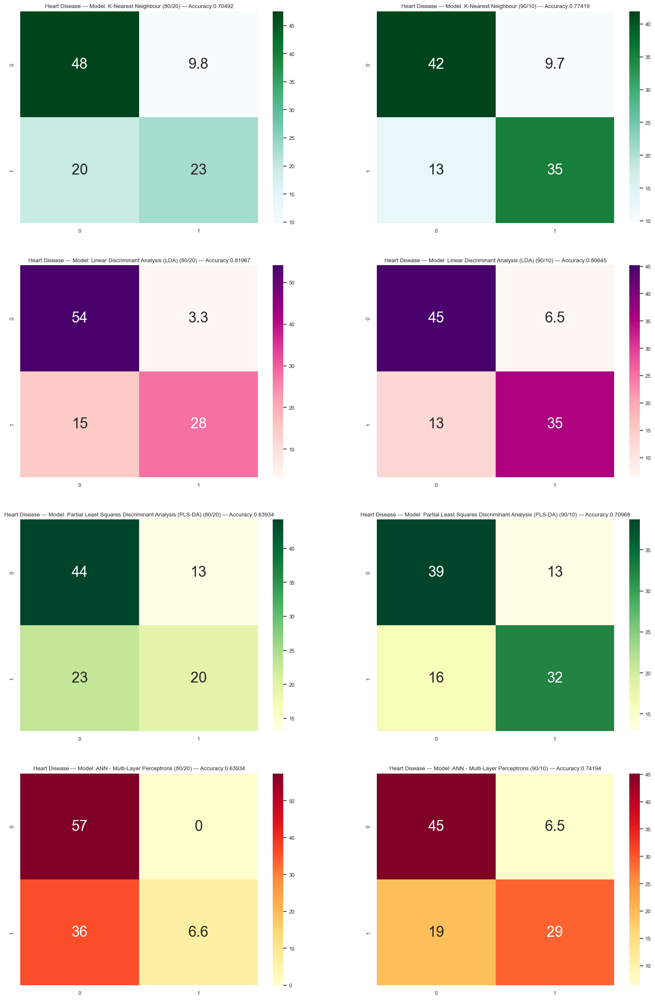

In [118]:
# (!) global styling

# import matplotlib as mpl

# mpl.rcParams['linewidth'] = '--'

# ##### external file mlpstyle
# axes.titlesize      : large   # fontsize of the axes title
# axes.labelsize      : medium  # fontsize of the x any y labels

# ##### temporary style
# with plt.style.context('dark_background'):
#     plt.plot(np.sin(np.linspace(0, 2 * np.pi)), 'r-o')
# plt.show()

##################################à
    
plt.figure(figsize=(20,30))
col_array = ["Blues", "Greens", "Reds", "Oranges", "Purples", "BuGn", "RdPu", "YlGn", "YlOrRd"]

plt.subplot(4,2,1)
plt.title('Heart Disease --- Model: K-Nearest Neighbour (80/20) --- Accuracy:{x:.5f}'.format(x=knn_acc_score))
sns.heatmap(knn_conf_matrix, annot=True, annot_kws={"size": 25}, cmap=col_array[5])

plt.subplot(4,2,2)
plt.title('Heart Disease --- Model: K-Nearest Neighbour (90/10) --- Accuracy:{x:.5f}'.format(x=knn_acc_score2))
sns.heatmap(knn_conf_matrix2, annot=True, annot_kws={"size": 25}, cmap=col_array[5])

plt.subplot(4,2,3)
plt.title('Heart Disease --- Model: Linear Discriminant Analysis (LDA) (80/20) --- Accuracy:{x:.5f}'.format(x=lda_acc_score))
sns.heatmap(lda_conf_matrix, annot=True, annot_kws={"size": 25}, cmap=col_array[6])

plt.subplot(4,2,4)
plt.title('Heart Disease --- Model: Linear Discriminant Analysis (LDA) (90/10) --- Accuracy:{x:.5f}'.format(x=lda_acc_score2))
sns.heatmap(lda_conf_matrix2, annot=True, annot_kws={"size": 25}, cmap=col_array[6])

plt.subplot(4,2,5)
plt.title('Heart Disease --- Model: Partial Least Squares Discriminant Analysis (PLS-DA) (80/20) --- Accuracy:{x:.5f}'.format(x=pls_acc_score))
sns.heatmap(pls_conf_matrix, annot=True, annot_kws={"size": 25}, cmap=col_array[7])

plt.subplot(4,2,6)
plt.title('Heart Disease --- Model: Partial Least Squares Discriminant Analysis (PLS-DA) (90/10) --- Accuracy:{x:.5f}'.format(x=pls_acc_score2))
sns.heatmap(pls_conf_matrix2, annot=True, annot_kws={"size": 25}, cmap=col_array[7])

plt.subplot(4,2,7)
plt.title('Heart Disease --- Model: ANN - Multi-Layer Perceptrons (80/20) --- Accuracy:{x:.5f}'.format(x=mlpc_acc_score))
sns.heatmap(mlpc_conf_matrix, annot=True, annot_kws={"size": 25}, cmap=col_array[8])

plt.subplot(4,2,8)
plt.title('Heart Disease --- Model: ANN - Multi-Layer Perceptrons (90/10) --- Accuracy:{x:.5f}'.format(x=mlpc_acc_score2))
sns.heatmap(mlpc_conf_matrix2, annot=True, annot_kws={"size": 25}, cmap=col_array[8])


### Confusion Matrix -  Normalized data case

<AxesSubplot:title={'center':'Heart Disease --- Model: ANN - Multi-Layer Perceptrons (90/10) --- Accuracy:0.80645'}>

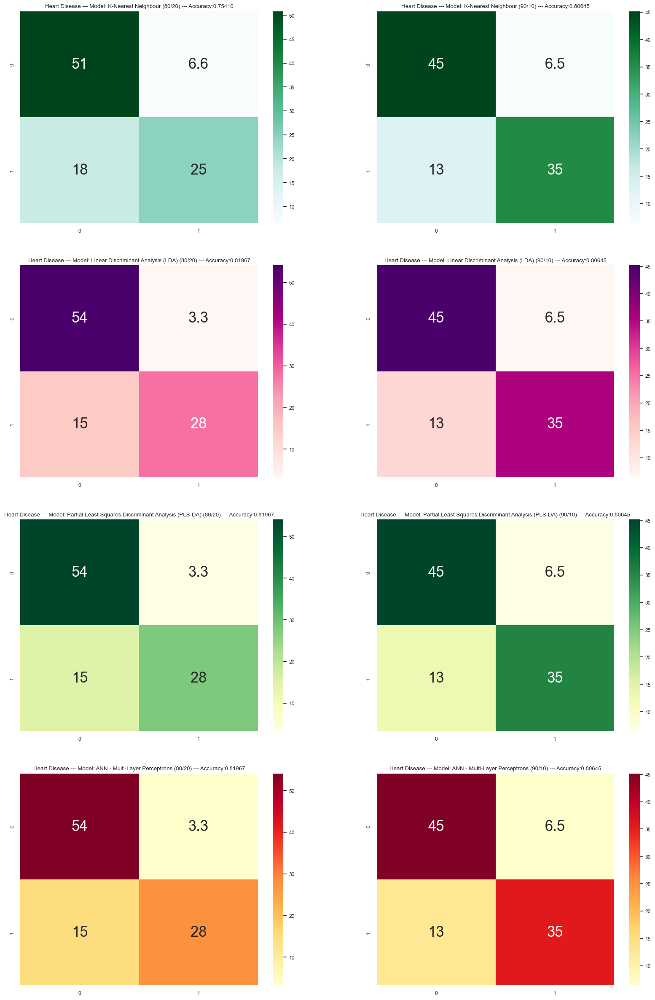

In [105]:
plt.figure(figsize=(20,30))

plt.subplot(4,2,1)
plt.title('Heart Disease --- Model: K-Nearest Neighbour (80/20) --- Accuracy:{x:.5f}'.format(x=knn_acc_score_norm))
sns.heatmap(knn_conf_matrix_norm, annot=True, annot_kws={"size": 25}, cmap=col_array[5])

plt.subplot(4,2,2)
plt.title('Heart Disease --- Model: K-Nearest Neighbour (90/10) --- Accuracy:{x:.5f}'.format(x=knn_acc_score_norm2))
sns.heatmap(knn_conf_matrix_norm2, annot=True, annot_kws={"size": 25}, cmap=col_array[5])

plt.subplot(4,2,3)
plt.title('Heart Disease --- Model: Linear Discriminant Analysis (LDA) (80/20) --- Accuracy:{x:.5f}'.format(x=lda_acc_score_norm))
sns.heatmap(lda_conf_matrix_norm, annot=True, annot_kws={"size": 25}, cmap=col_array[6])

plt.subplot(4,2,4)
plt.title('Heart Disease --- Model: Linear Discriminant Analysis (LDA) (90/10) --- Accuracy:{x:.5f}'.format(x=lda_acc_score_norm2))
sns.heatmap(lda_conf_matrix_norm2, annot=True, annot_kws={"size": 25}, cmap=col_array[6])

plt.subplot(4,2,5)
plt.title('Heart Disease --- Model: Partial Least Squares Discriminant Analysis (PLS-DA) (80/20) --- Accuracy:{x:.5f}'.format(x=pls_acc_score_norm))
sns.heatmap(pls_conf_matrix_norm, annot=True, annot_kws={"size": 25}, cmap=col_array[7])

plt.subplot(4,2,6)
plt.title('Heart Disease --- Model: Partial Least Squares Discriminant Analysis (PLS-DA) (90/10) --- Accuracy:{x:.5f}'.format(x=pls_acc_score_norm2))
sns.heatmap(pls_conf_matrix_norm2, annot=True, annot_kws={"size": 25}, cmap=col_array[7])

plt.subplot(4,2,7)
plt.title('Heart Disease --- Model: ANN - Multi-Layer Perceptrons (80/20) --- Accuracy:{x:.5f}'.format(x=mlpc_acc_score_norm))
sns.heatmap(mlpc_conf_matrix_norm, annot=True, annot_kws={"size": 25}, cmap=col_array[8])

plt.subplot(4,2,8)
plt.title('Heart Disease --- Model: ANN - Multi-Layer Perceptrons (90/10) --- Accuracy:{x:.5f}'.format(x=mlpc_acc_score_norm2))
sns.heatmap(mlpc_conf_matrix_norm2, annot=True, annot_kws={"size": 25}, cmap=col_array[8])


### Accuracy

In [106]:
model_ev_kfold = pd.DataFrame({'k-fold case - Model': ['K-NN', 'K-NN', 
                                   'LDA', 'LDA', 
                                   'PLS-DA', 'PLS-DA', 
                                   'ANN-MLP', 'ANN-MLP'], 
                               
                             'Validation Accuracy': [max_k_fold_val_acc_knn, max_k_fold_val_acc_knn_norm, 
                                                     max_k_fold_val_acc_lda, max_k_fold_val_acc_lda_norm,
                                                     max_k_fold_val_acc_plsda*100, max_k_fold_val_acc_plsda_norm*100,
                                                     max_k_fold_val_acc_mlp, max_k_fold_val_acc_mlp_norm], 
                               
                             'number of k-folds' : [k_knn_max, k_knn_norm_max, k_lda_max, k_lda_norm_max, 
                                                    k_plsda_max, k_plsda_norm_max, k_mlp_max, k_mlp_norm_max],                               
 
                             'Normalized data': ['No','Yes',
                                                 'No','Yes',
                                                 'No','Yes',
                                                 'No','Yes']})

model_ev_kfold

,k-fold case - Model,Validation Accuracy,number of k-folds,Normalized data
0,K-NN,92.105263,8,No
1,K-NN,93.333333,10,Yes
2,LDA,96.666667,10,No
3,LDA,96.666667,10,Yes
4,PLS-DA,69.966997,4,No
5,PLS-DA,84.818482,3,Yes
6,ANN-MLP,86.885246,5,No
7,ANN-MLP,90.196078,6,Yes


In [107]:
model_ev = pd.DataFrame({'Different Train/Test case - Model': ['K-NN', 'K-NN', 'K-NN', 'K-NN', 
                                   'LDA', 'LDA', 'LDA', 'LDA', 
                                   'PLS-DA', 'PLS-DA', 'PLS-DA','PLS-DA', 
                                   'ANN-MLP', 'ANN-MLP', 'ANN-MLP', 'ANN-MLP'], 
                         'Accuracy': [knn_acc_score*100, knn_acc_score2*100, 
                                      knn_acc_score_norm*100, knn_acc_score_norm2*100,
                                      lda_acc_score*100, lda_acc_score2*100, 
                                      lda_acc_score_norm*100, lda_acc_score_norm2*100, 
                                      pls_acc_score*100, pls_acc_score2*100, 
                                      pls_acc_score_norm*100, pls_acc_score_norm2*100, 
                                      mlpc_acc_score*100, mlpc_acc_score2*100, 
                                      mlpc_acc_score_norm*100, mlpc_acc_score_norm2*100],
                         'Training/Test': ['80/20', '90/10','80/20','90/10',
                                          '80/20', '90/10','80/20','90/10',
                                          '80/20', '90/10','80/20','90/10',
                                          '80/20', '90/10','80/20','90/10'],
                         'Normalized data': ['No', 'No','Yes','Yes',
                                             'No', 'No','Yes','Yes',
                                             'No', 'No','Yes','Yes',
                                             'No', 'No','Yes','Yes']})
model_ev


,Different Train/Test case - Model,Accuracy,Training/Test,Normalized data
0,K-NN,70.491803,80/20,No
1,K-NN,77.419355,90/10,No
2,K-NN,75.409836,80/20,Yes
3,K-NN,80.645161,90/10,Yes
4,LDA,81.967213,80/20,No
5,LDA,80.645161,90/10,No
6,LDA,81.967213,80/20,Yes
7,LDA,80.645161,90/10,Yes
8,PLS-DA,63.934426,80/20,No
9,PLS-DA,70.967742,90/10,No


In [108]:
# colors = ['red','green','blue','gold','silver','yellow','orange','magenta', 
#           'cyan', '#11A5AA','#AA1190', '#BB6666','#DAF7A6','#FF5733']
# # plt.figure(figsize=(8,5))
# # plt.title("barplot Represent Accuracy of different models")
# # plt.ylabel("Accuracy %")
# # plt.xticks(rotation=70)
# # plt.xlabel("Algorithms")
# # plt.bar(model_ev['Model'],model_ev['Accuracy'],color = colors)
# # plt.show()

# plt.figure(figsize=(8,5))
# plt.title("barplot Represent Accuracy of different models")
# plt.ylabel("Accuracy %")
# plt.xticks(rotation=0)
# plt.xlabel("Algorithms")
# plt.bar(model_ev['Different Train/Test case - Model'],model_ev['Accuracy'], color=colors)
# # plt.plot(model_ev['Different Train/Test case - Model'],model_ev['Accuracy'])

# # plt.legend(model_ev['Normalized data']) # wrong legend print
# plt.show()


### ROC curve (only normalized case)
Summary of classifier ROC curves in the normalized case, for class 1: Heart Disease is present.

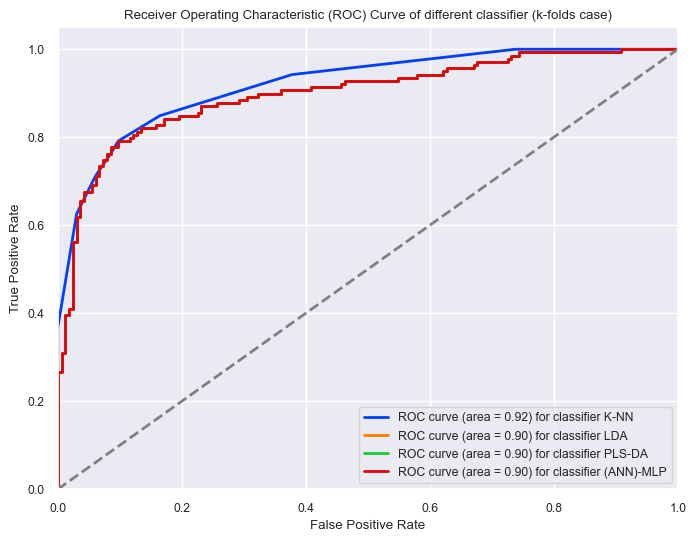

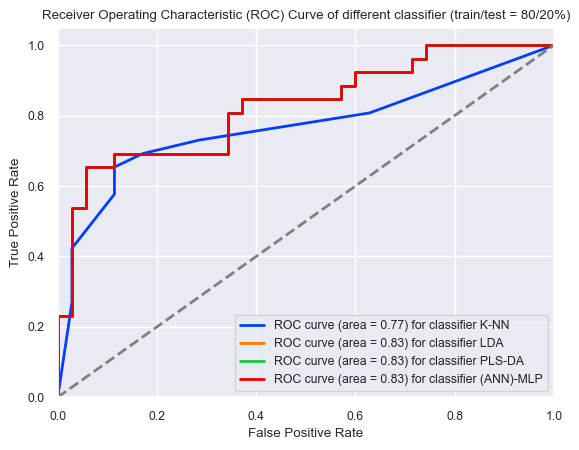

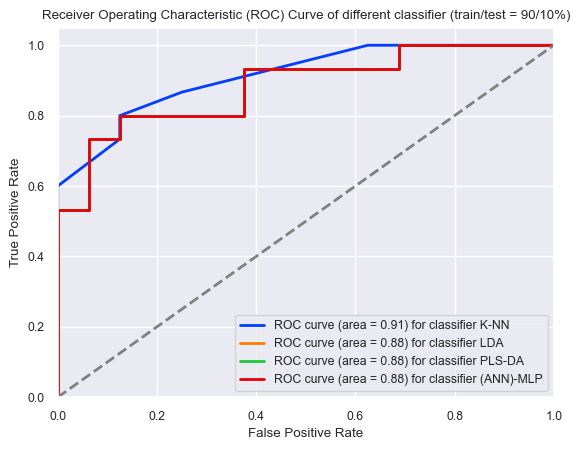

In [109]:
# Plot ROC curve for each classifier
sns.set_style('darkgrid')
palette = ['rainbow','deep','muted','pastel','bright','dark','colorblind','husl']
sns.set_palette(palette[4])

# Custom color palette
# my_colors = ["#FF5733", "#33FF57", "#3357FF", "#FF33A6"]
# my_colors = ["red", "blue", "green", "darkorange"]

# # Set the custom color palette
# sns.set_palette(my_colors)

# True Positive Rate is also called specificity, False Positive Rate is 1-specificity
classifier = ["K-NN", "LDA", "PLS-DA", "(ANN)-MLP"]
# Index to choose which case to show
cla = 1

# k-fold case
plt.figure(figsize=(8, 6))
plt.plot(fpr_kf_knn[cla], tpr_kf_knn[cla], lw=2, label=f'ROC curve (area = {roc_auc_kf_knn[cla]:.2f}) for classifier {classifier[0]}')
plt.plot(fpr_kf_lda[cla], tpr_kf_lda[cla], lw=2, label=f'ROC curve (area = {roc_auc_kf_lda[cla]:.2f}) for classifier {classifier[1]}')
plt.plot(fpr_kf_plsda[cla], tpr_kf_plsda[cla], lw=2, label=f'ROC curve (area = {roc_auc_kf_plsda[cla]:.2f}) for classifier {classifier[2]}')
plt.plot(fpr_kf_mlp[cla], tpr_kf_mlp[cla], lw=2, label=f'ROC curve (area = {roc_auc_kf_mlp[cla]:.2f}) for classifier {classifier[3]}')

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve of different classifier (k-folds case)')
plt.legend(loc="lower right")
plt.show()

# 80/20 case
plt.plot(fpr_80_20_knn[cla], tpr_80_20_knn[cla], lw=2, label=f'ROC curve (area = {roc_auc_80_20_knn[cla]:.2f}) for classifier {classifier[0]}')
plt.plot(fpr_80_20_lda[cla], tpr_80_20_lda[cla], lw=2, label=f'ROC curve (area = {roc_auc_80_20_lda[cla]:.2f}) for classifier {classifier[1]}')
plt.plot(fpr_80_20_plsda[cla], tpr_80_20_plsda[cla], lw=2, label=f'ROC curve (area = {roc_auc_80_20_plsda[cla]:.2f}) for classifier {classifier[2]}')
plt.plot(fpr_80_20_mlp[cla], tpr_80_20_mlp[cla], lw=2, label=f'ROC curve (area = {roc_auc_80_20_mlp[cla]:.2f}) for classifier {classifier[3]}')

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve of different classifier (train/test = 80/20%)')
plt.legend(loc="lower right")
plt.show()

# 90/10 case
plt.plot(fpr_90_10_knn[cla], tpr_90_10_knn[cla], lw=2, label=f'ROC curve (area = {roc_auc_90_10_knn[cla]:.2f}) for classifier {classifier[0]}')
plt.plot(fpr_90_10_lda[cla], tpr_90_10_lda[cla], lw=2, label=f'ROC curve (area = {roc_auc_90_10_lda[cla]:.2f}) for classifier {classifier[1]}')
plt.plot(fpr_90_10_plsda[cla], tpr_90_10_plsda[cla], lw=2, label=f'ROC curve (area = {roc_auc_90_10_plsda[cla]:.2f}) for classifier {classifier[2]}')
plt.plot(fpr_90_10_mlp[cla], tpr_90_10_mlp[cla], lw=2, label=f'ROC curve (area = {roc_auc_90_10_mlp[cla]:.2f}) for classifier {classifier[3]}')

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve of different classifier (train/test = 90/10%)')
plt.legend(loc="lower right")
plt.show()


### K-NN Scores Biplot

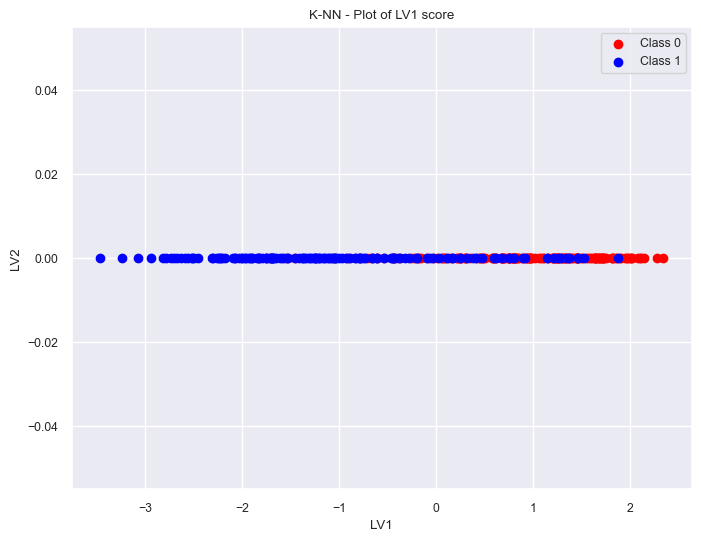

In [110]:
# Define colors based on class labels
colors = ["red", "blue", "green"]  # Add more colors as needed for each class

# Perform LDA transformation to get scores of the first principal component
lda = LinearDiscriminantAnalysis(n_components=1)
X_train_lda = lda.fit_transform(X_norm, y)

# Create a DataFrame with the score and class labels
df_scores = pd.DataFrame(data=X_train_lda, columns=['LV1'])
df_scores['Target'] = y

# Map the colors to the class labels
colorlist = [colors[label] for label in y]

# Plot the LV1 score with different colors for each class
plt.figure(figsize=(8, 6))
targets = df_scores['Target'].unique()
for target in targets:
    plt.scatter(df_scores[df_scores['Target'] == target]['LV1'],
                np.zeros_like(df_scores[df_scores['Target'] == target]['LV1']), # Create a column of zeros for LV2
                c=colors[target], # Use the color mapping
                label=f'Class {target}')
plt.xlabel('LV1')
plt.ylabel('LV2')
plt.title('K-NN - Plot of LV1 score')
plt.legend()
plt.grid(True)
plt.show()


### PLS-DA Scores Biplot

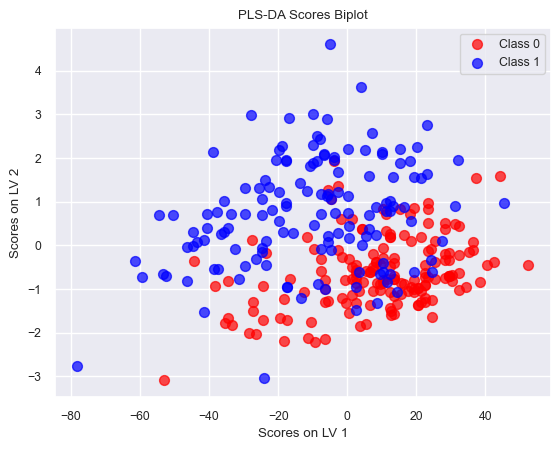

In [111]:
# plsr = PLSRegression(n_components=2, scale=False) # (1)
# df = data
# # Split of dataset
# y_biplot = df["Target"] # class label
# X_biplot = df.drop('Target',axis=1) # features label

# plsr.fit(X_biplot, y_biplot) # (2)

# Define colors based on class labels
colors = ["red", "blue"]  # Add more colors as needed for each class

scores = pd.DataFrame(plsr.x_scores_)
# Reset the index to use the default integer index
scores.reset_index(drop=True, inplace=True)

# Map the colors to the class labels
colorlist = [colors[label] for label in y]

# Create a scatter plot for each class separately
for label in set(y):
    indices = (y == label)
    plt.scatter(scores.loc[indices, 0], scores.loc[indices, 1], c=colors[label], s=50, alpha=0.7, label=f'Class {label}')

plt.xlabel('Scores on LV 1')
plt.ylabel('Scores on LV 2')
plt.title("PLS-DA Scores Biplot")

# Add the legend
plt.legend()

plt.show()



---